# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 3,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1*3, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2*3,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1*3, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2*3,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1*3, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "afriat_v2_2"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: cfq50qog
Name: holographic-wookie-113
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/cfq50qog
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_155910-cfq50qog/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2597,3268,9378
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2597,2554,1710,3404,1641,3337
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4452,10791
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 608,841,2361
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 608,648,398,886,408,862
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1132,2678
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:15<2:39:15, 15.95s/it]

Epoch 1/600:   0%|          | 1/600 [00:15<2:39:15, 15.95s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=51.6]

Epoch 2/600:   0%|          | 1/600 [00:16<2:39:15, 15.95s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=51.6]

Epoch 2/600:   0%|          | 2/600 [00:30<2:30:34, 15.11s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=51.6]

Epoch 2/600:   0%|          | 2/600 [00:30<2:30:34, 15.11s/it, v_num=og_1, total_loss_train=3.23e+3, kl_local_train=79.8]

Epoch 3/600:   0%|          | 2/600 [00:30<2:30:34, 15.11s/it, v_num=og_1, total_loss_train=3.23e+3, kl_local_train=79.8]

Epoch 3/600:   0%|          | 3/600 [00:44<2:26:49, 14.76s/it, v_num=og_1, total_loss_train=3.23e+3, kl_local_train=79.8]

Epoch 3/600:   0%|          | 3/600 [00:44<2:26:49, 14.76s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=81.6]

Epoch 4/600:   0%|          | 3/600 [00:44<2:26:49, 14.76s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=81.6]

Epoch 4/600:   1%|          | 4/600 [00:59<2:26:09, 14.71s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=81.6]

Epoch 4/600:   1%|          | 4/600 [00:59<2:26:09, 14.71s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=78.5]

Epoch 5/600:   1%|          | 4/600 [00:59<2:26:09, 14.71s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=78.5]

Epoch 5/600:   1%|          | 5/600 [01:14<2:26:06, 14.73s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=78.5]

Epoch 5/600:   1%|          | 5/600 [01:14<2:26:06, 14.73s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=71.4]

Epoch 6/600:   1%|          | 5/600 [01:15<2:26:06, 14.73s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=71.4]

Epoch 6/600:   1%|          | 6/600 [01:29<2:27:26, 14.89s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=71.4]

Epoch 6/600:   1%|          | 6/600 [01:29<2:27:26, 14.89s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=61.5, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 7/600:   1%|          | 6/600 [01:29<2:27:26, 14.89s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=61.5, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 7/600:   1%|          | 7/600 [01:43<2:24:16, 14.60s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=61.5, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 7/600:   1%|          | 7/600 [01:43<2:24:16, 14.60s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 8/600:   1%|          | 7/600 [01:43<2:24:16, 14.60s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 8/600:   1%|▏         | 8/600 [01:57<2:22:04, 14.40s/it, v_num=og_1, total_loss_train=3.21e+3, kl_local_train=47.8, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 8/600:   1%|▏         | 8/600 [01:57<2:22:04, 14.40s/it, v_num=og_1, total_loss_train=3.22e+3, kl_local_train=31.7, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 9/600:   1%|▏         | 8/600 [01:57<2:22:04, 14.40s/it, v_num=og_1, total_loss_train=3.22e+3, kl_local_train=31.7, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 9/600:   2%|▏         | 9/600 [02:11<2:20:11, 14.23s/it, v_num=og_1, total_loss_train=3.22e+3, kl_local_train=31.7, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 9/600:   2%|▏         | 9/600 [02:11<2:20:11, 14.23s/it, v_num=og_1, total_loss_train=3.23e+3, kl_local_train=27.8, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 10/600:   2%|▏         | 9/600 [02:11<2:20:11, 14.23s/it, v_num=og_1, total_loss_train=3.23e+3, kl_local_train=27.8, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 10/600:   2%|▏         | 10/600 [02:25<2:19:51, 14.22s/it, v_num=og_1, total_loss_train=3.23e+3, kl_local_train=27.8, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 10/600:   2%|▏         | 10/600 [02:25<2:19:51, 14.22s/it, v_num=og_1, total_loss_train=3.23e+3, kl_local_train=43.4, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 11/600:   2%|▏         | 10/600 [02:26<2:19:51, 14.22s/it, v_num=og_1, total_loss_train=3.23e+3, kl_local_train=43.4, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 11/600:   2%|▏         | 11/600 [02:40<2:22:42, 14.54s/it, v_num=og_1, total_loss_train=3.23e+3, kl_local_train=43.4, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.00748, metric_mi|time_cat_train=0.0121, metric_mi|mouse_train=0.0348]

Epoch 11/600:   2%|▏         | 11/600 [02:40<2:22:42, 14.54s/it, v_num=og_1, total_loss_train=3.24e+3, kl_local_train=95, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]    

Epoch 12/600:   2%|▏         | 11/600 [02:40<2:22:42, 14.54s/it, v_num=og_1, total_loss_train=3.24e+3, kl_local_train=95, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 12/600:   2%|▏         | 12/600 [02:54<2:19:57, 14.28s/it, v_num=og_1, total_loss_train=3.24e+3, kl_local_train=95, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 12/600:   2%|▏         | 12/600 [02:54<2:19:57, 14.28s/it, v_num=og_1, total_loss_train=3.25e+3, kl_local_train=170, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 13/600:   2%|▏         | 12/600 [02:54<2:19:57, 14.28s/it, v_num=og_1, total_loss_train=3.25e+3, kl_local_train=170, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 13/600:   2%|▏         | 13/600 [03:08<2:18:16, 14.13s/it, v_num=og_1, total_loss_train=3.25e+3, kl_local_train=170, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 13/600:   2%|▏         | 13/600 [03:08<2:18:16, 14.13s/it, v_num=og_1, total_loss_train=3.26e+3, kl_local_train=236, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 14/600:   2%|▏         | 13/600 [03:08<2:18:16, 14.13s/it, v_num=og_1, total_loss_train=3.26e+3, kl_local_train=236, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 14/600:   2%|▏         | 14/600 [03:22<2:17:13, 14.05s/it, v_num=og_1, total_loss_train=3.26e+3, kl_local_train=236, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 14/600:   2%|▏         | 14/600 [03:22<2:17:13, 14.05s/it, v_num=og_1, total_loss_train=3.27e+3, kl_local_train=295, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 15/600:   2%|▏         | 14/600 [03:22<2:17:13, 14.05s/it, v_num=og_1, total_loss_train=3.27e+3, kl_local_train=295, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 15/600:   2%|▎         | 15/600 [03:36<2:16:58, 14.05s/it, v_num=og_1, total_loss_train=3.27e+3, kl_local_train=295, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 15/600:   2%|▎         | 15/600 [03:36<2:16:58, 14.05s/it, v_num=og_1, total_loss_train=3.28e+3, kl_local_train=380, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 16/600:   2%|▎         | 15/600 [03:37<2:16:58, 14.05s/it, v_num=og_1, total_loss_train=3.28e+3, kl_local_train=380, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 16/600:   3%|▎         | 16/600 [03:51<2:20:03, 14.39s/it, v_num=og_1, total_loss_train=3.28e+3, kl_local_train=380, metric_mi|status_control_train=0.0227, metric_mi|zone_train=0.0735, metric_mi|time_cat_train=0.0176, metric_mi|mouse_train=0.043]

Epoch 16/600:   3%|▎         | 16/600 [03:51<2:20:03, 14.39s/it, v_num=og_1, total_loss_train=3.29e+3, kl_local_train=445, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 17/600:   3%|▎         | 16/600 [03:51<2:20:03, 14.39s/it, v_num=og_1, total_loss_train=3.29e+3, kl_local_train=445, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 17/600:   3%|▎         | 17/600 [04:05<2:19:23, 14.35s/it, v_num=og_1, total_loss_train=3.29e+3, kl_local_train=445, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 17/600:   3%|▎         | 17/600 [04:05<2:19:23, 14.35s/it, v_num=og_1, total_loss_train=3.3e+3, kl_local_train=486, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511] 

Epoch 18/600:   3%|▎         | 17/600 [04:05<2:19:23, 14.35s/it, v_num=og_1, total_loss_train=3.3e+3, kl_local_train=486, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 18/600:   3%|▎         | 18/600 [04:19<2:17:11, 14.14s/it, v_num=og_1, total_loss_train=3.3e+3, kl_local_train=486, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 18/600:   3%|▎         | 18/600 [04:19<2:17:11, 14.14s/it, v_num=og_1, total_loss_train=3.31e+3, kl_local_train=542, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 19/600:   3%|▎         | 18/600 [04:19<2:17:11, 14.14s/it, v_num=og_1, total_loss_train=3.31e+3, kl_local_train=542, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 19/600:   3%|▎         | 19/600 [04:33<2:17:06, 14.16s/it, v_num=og_1, total_loss_train=3.31e+3, kl_local_train=542, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 19/600:   3%|▎         | 19/600 [04:33<2:17:06, 14.16s/it, v_num=og_1, total_loss_train=3.33e+3, kl_local_train=566, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 20/600:   3%|▎         | 19/600 [04:33<2:17:06, 14.16s/it, v_num=og_1, total_loss_train=3.33e+3, kl_local_train=566, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 20/600:   3%|▎         | 20/600 [04:47<2:15:53, 14.06s/it, v_num=og_1, total_loss_train=3.33e+3, kl_local_train=566, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 20/600:   3%|▎         | 20/600 [04:47<2:15:53, 14.06s/it, v_num=og_1, total_loss_train=3.34e+3, kl_local_train=606, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 21/600:   3%|▎         | 20/600 [04:48<2:15:53, 14.06s/it, v_num=og_1, total_loss_train=3.34e+3, kl_local_train=606, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 21/600:   4%|▎         | 21/600 [05:02<2:19:29, 14.46s/it, v_num=og_1, total_loss_train=3.34e+3, kl_local_train=606, metric_mi|status_control_train=0.0236, metric_mi|zone_train=0.0612, metric_mi|time_cat_train=0.0258, metric_mi|mouse_train=0.0511]

Epoch 21/600:   4%|▎         | 21/600 [05:02<2:19:29, 14.46s/it, v_num=og_1, total_loss_train=3.35e+3, kl_local_train=643, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 22/600:   4%|▎         | 21/600 [05:02<2:19:29, 14.46s/it, v_num=og_1, total_loss_train=3.35e+3, kl_local_train=643, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 22/600:   4%|▎         | 22/600 [05:16<2:16:55, 14.21s/it, v_num=og_1, total_loss_train=3.35e+3, kl_local_train=643, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 22/600:   4%|▎         | 22/600 [05:16<2:16:55, 14.21s/it, v_num=og_1, total_loss_train=3.36e+3, kl_local_train=687, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 23/600:   4%|▎         | 22/600 [05:16<2:16:55, 14.21s/it, v_num=og_1, total_loss_train=3.36e+3, kl_local_train=687, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 23/600:   4%|▍         | 23/600 [05:30<2:15:56, 14.14s/it, v_num=og_1, total_loss_train=3.36e+3, kl_local_train=687, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 23/600:   4%|▍         | 23/600 [05:30<2:15:56, 14.14s/it, v_num=og_1, total_loss_train=3.37e+3, kl_local_train=733, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 24/600:   4%|▍         | 23/600 [05:30<2:15:56, 14.14s/it, v_num=og_1, total_loss_train=3.37e+3, kl_local_train=733, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 24/600:   4%|▍         | 24/600 [05:44<2:15:14, 14.09s/it, v_num=og_1, total_loss_train=3.37e+3, kl_local_train=733, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 24/600:   4%|▍         | 24/600 [05:44<2:15:14, 14.09s/it, v_num=og_1, total_loss_train=3.38e+3, kl_local_train=693, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 25/600:   4%|▍         | 24/600 [05:44<2:15:14, 14.09s/it, v_num=og_1, total_loss_train=3.38e+3, kl_local_train=693, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 25/600:   4%|▍         | 25/600 [05:58<2:14:42, 14.06s/it, v_num=og_1, total_loss_train=3.38e+3, kl_local_train=693, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 25/600:   4%|▍         | 25/600 [05:58<2:14:42, 14.06s/it, v_num=og_1, total_loss_train=3.39e+3, kl_local_train=702, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 26/600:   4%|▍         | 25/600 [05:59<2:14:42, 14.06s/it, v_num=og_1, total_loss_train=3.39e+3, kl_local_train=702, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 26/600:   4%|▍         | 26/600 [06:13<2:18:00, 14.43s/it, v_num=og_1, total_loss_train=3.39e+3, kl_local_train=702, metric_mi|status_control_train=0.0265, metric_mi|zone_train=0.0938, metric_mi|time_cat_train=0.0376, metric_mi|mouse_train=0.0605]

Epoch 26/600:   4%|▍         | 26/600 [06:13<2:18:00, 14.43s/it, v_num=og_1, total_loss_train=3.41e+3, kl_local_train=773, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 27/600:   4%|▍         | 26/600 [06:13<2:18:00, 14.43s/it, v_num=og_1, total_loss_train=3.41e+3, kl_local_train=773, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 27/600:   4%|▍         | 27/600 [06:27<2:16:11, 14.26s/it, v_num=og_1, total_loss_train=3.41e+3, kl_local_train=773, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 27/600:   4%|▍         | 27/600 [06:27<2:16:11, 14.26s/it, v_num=og_1, total_loss_train=3.42e+3, kl_local_train=793, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 28/600:   4%|▍         | 27/600 [06:27<2:16:11, 14.26s/it, v_num=og_1, total_loss_train=3.42e+3, kl_local_train=793, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 28/600:   5%|▍         | 28/600 [06:41<2:14:56, 14.15s/it, v_num=og_1, total_loss_train=3.42e+3, kl_local_train=793, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 28/600:   5%|▍         | 28/600 [06:41<2:14:56, 14.15s/it, v_num=og_1, total_loss_train=3.43e+3, kl_local_train=801, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 29/600:   5%|▍         | 28/600 [06:41<2:14:56, 14.15s/it, v_num=og_1, total_loss_train=3.43e+3, kl_local_train=801, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 29/600:   5%|▍         | 29/600 [06:55<2:14:14, 14.11s/it, v_num=og_1, total_loss_train=3.43e+3, kl_local_train=801, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 29/600:   5%|▍         | 29/600 [06:55<2:14:14, 14.11s/it, v_num=og_1, total_loss_train=3.44e+3, kl_local_train=832, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 30/600:   5%|▍         | 29/600 [06:55<2:14:14, 14.11s/it, v_num=og_1, total_loss_train=3.44e+3, kl_local_train=832, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 30/600:   5%|▌         | 30/600 [07:09<2:13:40, 14.07s/it, v_num=og_1, total_loss_train=3.44e+3, kl_local_train=832, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 30/600:   5%|▌         | 30/600 [07:09<2:13:40, 14.07s/it, v_num=og_1, total_loss_train=3.45e+3, kl_local_train=910, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 31/600:   5%|▌         | 30/600 [07:10<2:13:40, 14.07s/it, v_num=og_1, total_loss_train=3.45e+3, kl_local_train=910, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 31/600:   5%|▌         | 31/600 [07:24<2:16:48, 14.43s/it, v_num=og_1, total_loss_train=3.45e+3, kl_local_train=910, metric_mi|status_control_train=0.0321, metric_mi|zone_train=0.0993, metric_mi|time_cat_train=0.0431, metric_mi|mouse_train=0.0656]

Epoch 31/600:   5%|▌         | 31/600 [07:24<2:16:48, 14.43s/it, v_num=og_1, total_loss_train=3.46e+3, kl_local_train=932, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832] 

Epoch 32/600:   5%|▌         | 31/600 [07:24<2:16:48, 14.43s/it, v_num=og_1, total_loss_train=3.46e+3, kl_local_train=932, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 32/600:   5%|▌         | 32/600 [07:38<2:14:52, 14.25s/it, v_num=og_1, total_loss_train=3.46e+3, kl_local_train=932, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 32/600:   5%|▌         | 32/600 [07:38<2:14:52, 14.25s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=961, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 33/600:   5%|▌         | 32/600 [07:38<2:14:52, 14.25s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=961, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 33/600:   6%|▌         | 33/600 [07:52<2:13:48, 14.16s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=961, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 33/600:   6%|▌         | 33/600 [07:52<2:13:48, 14.16s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=1.01e+3, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 34/600:   6%|▌         | 33/600 [07:52<2:13:48, 14.16s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=1.01e+3, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 34/600:   6%|▌         | 34/600 [08:06<2:12:49, 14.08s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=1.01e+3, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 34/600:   6%|▌         | 34/600 [08:06<2:12:49, 14.08s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=1.03e+3, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832] 

Epoch 35/600:   6%|▌         | 34/600 [08:06<2:12:49, 14.08s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=1.03e+3, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 35/600:   6%|▌         | 35/600 [08:20<2:13:13, 14.15s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=1.03e+3, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 35/600:   6%|▌         | 35/600 [08:20<2:13:13, 14.15s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=1.08e+3, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 36/600:   6%|▌         | 35/600 [08:21<2:13:13, 14.15s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=1.08e+3, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 36/600:   6%|▌         | 36/600 [08:35<2:16:00, 14.47s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=1.08e+3, metric_mi|status_control_train=0.0429, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0832]

Epoch 36/600:   6%|▌         | 36/600 [08:35<2:16:00, 14.47s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=1.15e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953] 

Epoch 37/600:   6%|▌         | 36/600 [08:35<2:16:00, 14.47s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=1.15e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 37/600:   6%|▌         | 37/600 [08:49<2:14:07, 14.29s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=1.15e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 37/600:   6%|▌         | 37/600 [08:49<2:14:07, 14.29s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=1.23e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 38/600:   6%|▌         | 37/600 [08:49<2:14:07, 14.29s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=1.23e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 38/600:   6%|▋         | 38/600 [09:03<2:12:36, 14.16s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=1.23e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 38/600:   6%|▋         | 38/600 [09:03<2:12:36, 14.16s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=1.33e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 39/600:   6%|▋         | 38/600 [09:03<2:12:36, 14.16s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=1.33e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 39/600:   6%|▋         | 39/600 [09:17<2:11:35, 14.07s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=1.33e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 39/600:   6%|▋         | 39/600 [09:17<2:11:35, 14.07s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=1.45e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 40/600:   6%|▋         | 39/600 [09:17<2:11:35, 14.07s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=1.45e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 40/600:   7%|▋         | 40/600 [09:31<2:11:36, 14.10s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=1.45e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 40/600:   7%|▋         | 40/600 [09:31<2:11:36, 14.10s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=1.56e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 41/600:   7%|▋         | 40/600 [09:33<2:11:36, 14.10s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=1.56e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 41/600:   7%|▋         | 41/600 [09:46<2:15:04, 14.50s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=1.56e+3, metric_mi|status_control_train=0.059, metric_mi|zone_train=0.122, metric_mi|time_cat_train=0.0926, metric_mi|mouse_train=0.0953]

Epoch 41/600:   7%|▋         | 41/600 [09:46<2:15:04, 14.50s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=1.57e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 42/600:   7%|▋         | 41/600 [09:46<2:15:04, 14.50s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=1.57e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 42/600:   7%|▋         | 42/600 [10:00<2:13:11, 14.32s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=1.57e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 42/600:   7%|▋         | 42/600 [10:00<2:13:11, 14.32s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=1.61e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 43/600:   7%|▋         | 42/600 [10:00<2:13:11, 14.32s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=1.61e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 43/600:   7%|▋         | 43/600 [10:14<2:11:28, 14.16s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=1.61e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 43/600:   7%|▋         | 43/600 [10:14<2:11:28, 14.16s/it, v_num=og_1, total_loss_train=3.63e+3, kl_local_train=1.64e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 44/600:   7%|▋         | 43/600 [10:14<2:11:28, 14.16s/it, v_num=og_1, total_loss_train=3.63e+3, kl_local_train=1.64e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 44/600:   7%|▋         | 44/600 [10:28<2:10:36, 14.09s/it, v_num=og_1, total_loss_train=3.63e+3, kl_local_train=1.64e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 44/600:   7%|▋         | 44/600 [10:28<2:10:36, 14.09s/it, v_num=og_1, total_loss_train=3.65e+3, kl_local_train=1.64e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 45/600:   7%|▋         | 44/600 [10:28<2:10:36, 14.09s/it, v_num=og_1, total_loss_train=3.65e+3, kl_local_train=1.64e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 45/600:   8%|▊         | 45/600 [10:42<2:10:51, 14.15s/it, v_num=og_1, total_loss_train=3.65e+3, kl_local_train=1.64e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 45/600:   8%|▊         | 45/600 [10:42<2:10:51, 14.15s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=1.59e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 46/600:   8%|▊         | 45/600 [10:44<2:10:51, 14.15s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=1.59e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 46/600:   8%|▊         | 46/600 [10:58<2:13:43, 14.48s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=1.59e+3, metric_mi|status_control_train=0.0845, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.0963, metric_mi|mouse_train=0.0971]

Epoch 46/600:   8%|▊         | 46/600 [10:58<2:13:43, 14.48s/it, v_num=og_1, total_loss_train=3.67e+3, kl_local_train=1.54e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 47/600:   8%|▊         | 46/600 [10:58<2:13:43, 14.48s/it, v_num=og_1, total_loss_train=3.67e+3, kl_local_train=1.54e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 47/600:   8%|▊         | 47/600 [11:11<2:11:40, 14.29s/it, v_num=og_1, total_loss_train=3.67e+3, kl_local_train=1.54e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 47/600:   8%|▊         | 47/600 [11:11<2:11:40, 14.29s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=1.5e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967] 

Epoch 48/600:   8%|▊         | 47/600 [11:11<2:11:40, 14.29s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=1.5e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 48/600:   8%|▊         | 48/600 [11:25<2:10:20, 14.17s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=1.5e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 48/600:   8%|▊         | 48/600 [11:25<2:10:20, 14.17s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.34e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 49/600:   8%|▊         | 48/600 [11:25<2:10:20, 14.17s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.34e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 49/600:   8%|▊         | 49/600 [11:39<2:08:59, 14.05s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.34e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 49/600:   8%|▊         | 49/600 [11:39<2:08:59, 14.05s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.22e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 50/600:   8%|▊         | 49/600 [11:39<2:08:59, 14.05s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.22e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 50/600:   8%|▊         | 50/600 [11:53<2:09:19, 14.11s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.22e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 50/600:   8%|▊         | 50/600 [11:53<2:09:19, 14.11s/it, v_num=og_1, total_loss_train=3.71e+3, kl_local_train=1.11e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 51/600:   8%|▊         | 50/600 [11:55<2:09:19, 14.11s/it, v_num=og_1, total_loss_train=3.71e+3, kl_local_train=1.11e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 51/600:   8%|▊         | 51/600 [12:09<2:12:12, 14.45s/it, v_num=og_1, total_loss_train=3.71e+3, kl_local_train=1.11e+3, metric_mi|status_control_train=0.0848, metric_mi|zone_train=0.0899, metric_mi|time_cat_train=0.0967, metric_mi|mouse_train=0.0967]

Epoch 51/600:   8%|▊         | 51/600 [12:09<2:12:12, 14.45s/it, v_num=og_1, total_loss_train=3.71e+3, kl_local_train=1.09e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 52/600:   8%|▊         | 51/600 [12:09<2:12:12, 14.45s/it, v_num=og_1, total_loss_train=3.71e+3, kl_local_train=1.09e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 52/600:   9%|▊         | 52/600 [12:22<2:10:24, 14.28s/it, v_num=og_1, total_loss_train=3.71e+3, kl_local_train=1.09e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 52/600:   9%|▊         | 52/600 [12:22<2:10:24, 14.28s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.06e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943] 

Epoch 53/600:   9%|▊         | 52/600 [12:22<2:10:24, 14.28s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.06e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 53/600:   9%|▉         | 53/600 [12:36<2:09:12, 14.17s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.06e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 53/600:   9%|▉         | 53/600 [12:36<2:09:12, 14.17s/it, v_num=og_1, total_loss_train=3.71e+3, kl_local_train=1.14e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 54/600:   9%|▉         | 53/600 [12:36<2:09:12, 14.17s/it, v_num=og_1, total_loss_train=3.71e+3, kl_local_train=1.14e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 54/600:   9%|▉         | 54/600 [12:50<2:07:58, 14.06s/it, v_num=og_1, total_loss_train=3.71e+3, kl_local_train=1.14e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 54/600:   9%|▉         | 54/600 [12:50<2:07:58, 14.06s/it, v_num=og_1, total_loss_train=3.71e+3, kl_local_train=1.12e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 55/600:   9%|▉         | 54/600 [12:50<2:07:58, 14.06s/it, v_num=og_1, total_loss_train=3.71e+3, kl_local_train=1.12e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 55/600:   9%|▉         | 55/600 [13:04<2:08:07, 14.11s/it, v_num=og_1, total_loss_train=3.71e+3, kl_local_train=1.12e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 55/600:   9%|▉         | 55/600 [13:04<2:08:07, 14.11s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.08e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943] 

Epoch 56/600:   9%|▉         | 55/600 [13:06<2:08:07, 14.11s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.08e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 56/600:   9%|▉         | 56/600 [13:20<2:11:03, 14.45s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.08e+3, metric_mi|status_control_train=0.0785, metric_mi|zone_train=0.0824, metric_mi|time_cat_train=0.0925, metric_mi|mouse_train=0.0943]

Epoch 56/600:   9%|▉         | 56/600 [13:20<2:11:03, 14.45s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.1e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]    

Epoch 57/600:   9%|▉         | 56/600 [13:20<2:11:03, 14.45s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.1e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 57/600:  10%|▉         | 57/600 [13:33<2:09:12, 14.28s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.1e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 57/600:  10%|▉         | 57/600 [13:33<2:09:12, 14.28s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.08e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 58/600:  10%|▉         | 57/600 [13:33<2:09:12, 14.28s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.08e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 58/600:  10%|▉         | 58/600 [13:47<2:07:55, 14.16s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.08e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 58/600:  10%|▉         | 58/600 [13:47<2:07:55, 14.16s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.11e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 59/600:  10%|▉         | 58/600 [13:47<2:07:55, 14.16s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.11e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 59/600:  10%|▉         | 59/600 [14:01<2:06:54, 14.08s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.11e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 59/600:  10%|▉         | 59/600 [14:01<2:06:54, 14.08s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.1e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988] 

Epoch 60/600:  10%|▉         | 59/600 [14:01<2:06:54, 14.08s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.1e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 60/600:  10%|█         | 60/600 [14:16<2:07:12, 14.14s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.1e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 60/600:  10%|█         | 60/600 [14:16<2:07:12, 14.14s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.13e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 61/600:  10%|█         | 60/600 [14:17<2:07:12, 14.14s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.13e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 61/600:  10%|█         | 61/600 [14:31<2:09:26, 14.41s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.13e+3, metric_mi|status_control_train=0.0878, metric_mi|zone_train=0.0923, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0988]

Epoch 61/600:  10%|█         | 61/600 [14:31<2:09:26, 14.41s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.12e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]   

Epoch 62/600:  10%|█         | 61/600 [14:31<2:09:26, 14.41s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.12e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 62/600:  10%|█         | 62/600 [14:44<2:07:55, 14.27s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.12e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 62/600:  10%|█         | 62/600 [14:44<2:07:55, 14.27s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.1e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1] 

Epoch 63/600:  10%|█         | 62/600 [14:45<2:07:55, 14.27s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.1e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 63/600:  10%|█         | 63/600 [14:58<2:06:49, 14.17s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.1e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 63/600:  10%|█         | 63/600 [14:58<2:06:49, 14.17s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.08e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 64/600:  10%|█         | 63/600 [14:58<2:06:49, 14.17s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.08e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 64/600:  11%|█         | 64/600 [15:12<2:06:05, 14.11s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.08e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 64/600:  11%|█         | 64/600 [15:12<2:06:05, 14.11s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.06e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 65/600:  11%|█         | 64/600 [15:12<2:06:05, 14.11s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.06e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 65/600:  11%|█         | 65/600 [15:26<2:04:44, 13.99s/it, v_num=og_1, total_loss_train=3.7e+3, kl_local_train=1.06e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 65/600:  11%|█         | 65/600 [15:26<2:04:44, 13.99s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=1.03e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 66/600:  11%|█         | 65/600 [15:27<2:04:44, 13.99s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=1.03e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 66/600:  11%|█         | 66/600 [15:40<2:04:03, 13.94s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=1.03e+3, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.08, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.1]

Epoch 66/600:  11%|█         | 66/600 [15:40<2:04:03, 13.94s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=937, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 67/600:  11%|█         | 66/600 [15:40<2:04:03, 13.94s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=937, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 67/600:  11%|█         | 67/600 [15:53<2:00:11, 13.53s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=937, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 67/600:  11%|█         | 67/600 [15:53<2:00:11, 13.53s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=898, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 68/600:  11%|█         | 67/600 [15:53<2:00:11, 13.53s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=898, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 68/600:  11%|█▏        | 68/600 [16:05<1:57:24, 13.24s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=898, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 68/600:  11%|█▏        | 68/600 [16:05<1:57:24, 13.24s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=950, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 69/600:  11%|█▏        | 68/600 [16:05<1:57:24, 13.24s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=950, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 69/600:  12%|█▏        | 69/600 [16:18<1:55:20, 13.03s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=950, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 69/600:  12%|█▏        | 69/600 [16:18<1:55:20, 13.03s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=917, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 70/600:  12%|█▏        | 69/600 [16:18<1:55:20, 13.03s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=917, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 70/600:  12%|█▏        | 70/600 [16:30<1:54:33, 12.97s/it, v_num=og_1, total_loss_train=3.69e+3, kl_local_train=917, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 70/600:  12%|█▏        | 70/600 [16:30<1:54:33, 12.97s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=862, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 71/600:  12%|█▏        | 70/600 [16:32<1:54:33, 12.97s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=862, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 71/600:  12%|█▏        | 71/600 [16:44<1:56:32, 13.22s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=862, metric_mi|status_control_train=0.0795, metric_mi|zone_train=0.0772, metric_mi|time_cat_train=0.0998, metric_mi|mouse_train=0.0993]

Epoch 71/600:  12%|█▏        | 71/600 [16:44<1:56:32, 13.22s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=885, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 72/600:  12%|█▏        | 71/600 [16:44<1:56:32, 13.22s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=885, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 72/600:  12%|█▏        | 72/600 [16:57<1:54:30, 13.01s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=885, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 72/600:  12%|█▏        | 72/600 [16:57<1:54:30, 13.01s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=848, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 73/600:  12%|█▏        | 72/600 [16:57<1:54:30, 13.01s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=848, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 73/600:  12%|█▏        | 73/600 [17:09<1:53:03, 12.87s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=848, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 73/600:  12%|█▏        | 73/600 [17:09<1:53:03, 12.87s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=849, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 74/600:  12%|█▏        | 73/600 [17:09<1:53:03, 12.87s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=849, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 74/600:  12%|█▏        | 74/600 [17:22<1:52:02, 12.78s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=849, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 74/600:  12%|█▏        | 74/600 [17:22<1:52:02, 12.78s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=860, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 75/600:  12%|█▏        | 74/600 [17:22<1:52:02, 12.78s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=860, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 75/600:  12%|█▎        | 75/600 [17:35<1:52:55, 12.91s/it, v_num=og_1, total_loss_train=3.68e+3, kl_local_train=860, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 75/600:  12%|█▎        | 75/600 [17:35<1:52:55, 12.91s/it, v_num=og_1, total_loss_train=3.67e+3, kl_local_train=784, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 76/600:  12%|█▎        | 75/600 [17:36<1:52:55, 12.91s/it, v_num=og_1, total_loss_train=3.67e+3, kl_local_train=784, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 76/600:  13%|█▎        | 76/600 [17:50<1:58:59, 13.62s/it, v_num=og_1, total_loss_train=3.67e+3, kl_local_train=784, metric_mi|status_control_train=0.0734, metric_mi|zone_train=0.0879, metric_mi|time_cat_train=0.0955, metric_mi|mouse_train=0.0969]

Epoch 76/600:  13%|█▎        | 76/600 [17:50<1:58:59, 13.62s/it, v_num=og_1, total_loss_train=3.67e+3, kl_local_train=689, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939] 

Epoch 77/600:  13%|█▎        | 76/600 [17:50<1:58:59, 13.62s/it, v_num=og_1, total_loss_train=3.67e+3, kl_local_train=689, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 77/600:  13%|█▎        | 77/600 [18:04<1:59:30, 13.71s/it, v_num=og_1, total_loss_train=3.67e+3, kl_local_train=689, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 77/600:  13%|█▎        | 77/600 [18:04<1:59:30, 13.71s/it, v_num=og_1, total_loss_train=3.67e+3, kl_local_train=758, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 78/600:  13%|█▎        | 77/600 [18:04<1:59:30, 13.71s/it, v_num=og_1, total_loss_train=3.67e+3, kl_local_train=758, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 78/600:  13%|█▎        | 78/600 [18:18<1:59:07, 13.69s/it, v_num=og_1, total_loss_train=3.67e+3, kl_local_train=758, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 78/600:  13%|█▎        | 78/600 [18:18<1:59:07, 13.69s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=751, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 79/600:  13%|█▎        | 78/600 [18:18<1:59:07, 13.69s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=751, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 79/600:  13%|█▎        | 79/600 [18:32<1:59:34, 13.77s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=751, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 79/600:  13%|█▎        | 79/600 [18:32<1:59:34, 13.77s/it, v_num=og_1, total_loss_train=3.65e+3, kl_local_train=703, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 80/600:  13%|█▎        | 79/600 [18:32<1:59:34, 13.77s/it, v_num=og_1, total_loss_train=3.65e+3, kl_local_train=703, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 80/600:  13%|█▎        | 80/600 [18:46<2:00:24, 13.89s/it, v_num=og_1, total_loss_train=3.65e+3, kl_local_train=703, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 80/600:  13%|█▎        | 80/600 [18:46<2:00:24, 13.89s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=755, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 81/600:  13%|█▎        | 80/600 [18:47<2:00:24, 13.89s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=755, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 81/600:  14%|█▎        | 81/600 [19:01<2:03:46, 14.31s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=755, metric_mi|status_control_train=0.0639, metric_mi|zone_train=0.0848, metric_mi|time_cat_train=0.091, metric_mi|mouse_train=0.0939]

Epoch 81/600:  14%|█▎        | 81/600 [19:01<2:03:46, 14.31s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=744, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]  

Epoch 82/600:  14%|█▎        | 81/600 [19:01<2:03:46, 14.31s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=744, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 82/600:  14%|█▎        | 82/600 [19:15<2:02:44, 14.22s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=744, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 82/600:  14%|█▎        | 82/600 [19:15<2:02:44, 14.22s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=769, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 83/600:  14%|█▎        | 82/600 [19:15<2:02:44, 14.22s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=769, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 83/600:  14%|█▍        | 83/600 [19:29<2:01:38, 14.12s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=769, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 83/600:  14%|█▍        | 83/600 [19:29<2:01:38, 14.12s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=792, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 84/600:  14%|█▍        | 83/600 [19:29<2:01:38, 14.12s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=792, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 84/600:  14%|█▍        | 84/600 [19:43<2:00:45, 14.04s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=792, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 84/600:  14%|█▍        | 84/600 [19:43<2:00:45, 14.04s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=795, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 85/600:  14%|█▍        | 84/600 [19:43<2:00:45, 14.04s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=795, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 85/600:  14%|█▍        | 85/600 [19:58<2:01:25, 14.15s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=795, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 85/600:  14%|█▍        | 85/600 [19:58<2:01:25, 14.15s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=614, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 86/600:  14%|█▍        | 85/600 [19:59<2:01:25, 14.15s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=614, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 86/600:  14%|█▍        | 86/600 [20:13<2:04:11, 14.50s/it, v_num=og_1, total_loss_train=3.66e+3, kl_local_train=614, metric_mi|status_control_train=0.0876, metric_mi|zone_train=0.088, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 86/600:  14%|█▍        | 86/600 [20:13<2:04:11, 14.50s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=455, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 87/600:  14%|█▍        | 86/600 [20:13<2:04:11, 14.50s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=455, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 87/600:  14%|█▍        | 87/600 [20:27<2:02:25, 14.32s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=455, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 87/600:  14%|█▍        | 87/600 [20:27<2:02:25, 14.32s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=501, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 88/600:  14%|█▍        | 87/600 [20:27<2:02:25, 14.32s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=501, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 88/600:  15%|█▍        | 88/600 [20:41<2:01:18, 14.22s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=501, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 88/600:  15%|█▍        | 88/600 [20:41<2:01:18, 14.22s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=552, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 89/600:  15%|█▍        | 88/600 [20:41<2:01:18, 14.22s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=552, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 89/600:  15%|█▍        | 89/600 [20:55<2:00:30, 14.15s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=552, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 89/600:  15%|█▍        | 89/600 [20:55<2:00:30, 14.15s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=553, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 90/600:  15%|█▍        | 89/600 [20:55<2:00:30, 14.15s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=553, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 90/600:  15%|█▌        | 90/600 [21:09<2:00:46, 14.21s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=553, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 90/600:  15%|█▌        | 90/600 [21:09<2:00:46, 14.21s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=555, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 91/600:  15%|█▌        | 90/600 [21:10<2:00:46, 14.21s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=555, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 91/600:  15%|█▌        | 91/600 [21:25<2:03:44, 14.59s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=555, metric_mi|status_control_train=0.0647, metric_mi|zone_train=0.0791, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.0945]

Epoch 91/600:  15%|█▌        | 91/600 [21:25<2:03:44, 14.59s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=581, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]  

Epoch 92/600:  15%|█▌        | 91/600 [21:25<2:03:44, 14.59s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=581, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 92/600:  15%|█▌        | 92/600 [21:39<2:02:19, 14.45s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=581, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 92/600:  15%|█▌        | 92/600 [21:39<2:02:19, 14.45s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=627, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 93/600:  15%|█▌        | 92/600 [21:39<2:02:19, 14.45s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=627, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 93/600:  16%|█▌        | 93/600 [21:53<2:01:07, 14.33s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=627, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 93/600:  16%|█▌        | 93/600 [21:53<2:01:07, 14.33s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=620, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 94/600:  16%|█▌        | 93/600 [21:53<2:01:07, 14.33s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=620, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 94/600:  16%|█▌        | 94/600 [22:07<1:59:38, 14.19s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=620, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 94/600:  16%|█▌        | 94/600 [22:07<1:59:38, 14.19s/it, v_num=og_1, total_loss_train=3.63e+3, kl_local_train=618, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 95/600:  16%|█▌        | 94/600 [22:07<1:59:38, 14.19s/it, v_num=og_1, total_loss_train=3.63e+3, kl_local_train=618, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 95/600:  16%|█▌        | 95/600 [22:21<2:00:42, 14.34s/it, v_num=og_1, total_loss_train=3.63e+3, kl_local_train=618, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 95/600:  16%|█▌        | 95/600 [22:21<2:00:42, 14.34s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=615, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 96/600:  16%|█▌        | 95/600 [22:23<2:00:42, 14.34s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=615, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 96/600:  16%|█▌        | 96/600 [22:36<2:02:42, 14.61s/it, v_num=og_1, total_loss_train=3.64e+3, kl_local_train=615, metric_mi|status_control_train=0.0885, metric_mi|zone_train=0.0911, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 96/600:  16%|█▌        | 96/600 [22:36<2:02:42, 14.61s/it, v_num=og_1, total_loss_train=3.63e+3, kl_local_train=571, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 97/600:  16%|█▌        | 96/600 [22:37<2:02:42, 14.61s/it, v_num=og_1, total_loss_train=3.63e+3, kl_local_train=571, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 97/600:  16%|█▌        | 97/600 [22:51<2:01:03, 14.44s/it, v_num=og_1, total_loss_train=3.63e+3, kl_local_train=571, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 97/600:  16%|█▌        | 97/600 [22:51<2:01:03, 14.44s/it, v_num=og_1, total_loss_train=3.63e+3, kl_local_train=514, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 98/600:  16%|█▌        | 97/600 [22:51<2:01:03, 14.44s/it, v_num=og_1, total_loss_train=3.63e+3, kl_local_train=514, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 98/600:  16%|█▋        | 98/600 [23:05<2:00:02, 14.35s/it, v_num=og_1, total_loss_train=3.63e+3, kl_local_train=514, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 98/600:  16%|█▋        | 98/600 [23:05<2:00:02, 14.35s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=454, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 99/600:  16%|█▋        | 98/600 [23:05<2:00:02, 14.35s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=454, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 99/600:  16%|█▋        | 99/600 [23:19<1:59:21, 14.29s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=454, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 99/600:  16%|█▋        | 99/600 [23:19<1:59:21, 14.29s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=432, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 100/600:  16%|█▋        | 99/600 [23:19<1:59:21, 14.29s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=432, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 100/600:  17%|█▋        | 100/600 [23:33<1:59:34, 14.35s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=432, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 100/600:  17%|█▋        | 100/600 [23:33<1:59:34, 14.35s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=432, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 101/600:  17%|█▋        | 100/600 [23:35<1:59:34, 14.35s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=432, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 101/600:  17%|█▋        | 101/600 [23:49<2:02:09, 14.69s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=432, metric_mi|status_control_train=0.0735, metric_mi|zone_train=0.0896, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 101/600:  17%|█▋        | 101/600 [23:49<2:02:09, 14.69s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=457, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 102/600:  17%|█▋        | 101/600 [23:49<2:02:09, 14.69s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=457, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 102/600:  17%|█▋        | 102/600 [24:03<2:00:23, 14.51s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=457, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 102/600:  17%|█▋        | 102/600 [24:03<2:00:23, 14.51s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=451, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 103/600:  17%|█▋        | 102/600 [24:03<2:00:23, 14.51s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=451, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 103/600:  17%|█▋        | 103/600 [24:17<1:58:14, 14.27s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=451, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 103/600:  17%|█▋        | 103/600 [24:17<1:58:14, 14.27s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=450, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 104/600:  17%|█▋        | 103/600 [24:17<1:58:14, 14.27s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=450, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 104/600:  17%|█▋        | 104/600 [24:31<1:57:33, 14.22s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=450, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 104/600:  17%|█▋        | 104/600 [24:31<1:57:33, 14.22s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=465, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 105/600:  17%|█▋        | 104/600 [24:31<1:57:33, 14.22s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=465, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 105/600:  18%|█▊        | 105/600 [24:45<1:58:19, 14.34s/it, v_num=og_1, total_loss_train=3.62e+3, kl_local_train=465, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 105/600:  18%|█▊        | 105/600 [24:45<1:58:19, 14.34s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=452, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 106/600:  18%|█▊        | 105/600 [24:47<1:58:19, 14.34s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=452, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 106/600:  18%|█▊        | 106/600 [25:01<2:01:08, 14.71s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=452, metric_mi|status_control_train=0.0808, metric_mi|zone_train=0.0856, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 106/600:  18%|█▊        | 106/600 [25:01<2:01:08, 14.71s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=470, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 107/600:  18%|█▊        | 106/600 [25:01<2:01:08, 14.71s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=470, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 107/600:  18%|█▊        | 107/600 [25:15<1:59:24, 14.53s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=470, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 107/600:  18%|█▊        | 107/600 [25:15<1:59:24, 14.53s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=477, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 108/600:  18%|█▊        | 107/600 [25:15<1:59:24, 14.53s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=477, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 108/600:  18%|█▊        | 108/600 [25:29<1:58:04, 14.40s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=477, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 108/600:  18%|█▊        | 108/600 [25:29<1:58:04, 14.40s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=454, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 109/600:  18%|█▊        | 108/600 [25:29<1:58:04, 14.40s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=454, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 109/600:  18%|█▊        | 109/600 [25:43<1:57:16, 14.33s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=454, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 109/600:  18%|█▊        | 109/600 [25:43<1:57:16, 14.33s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=452, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 110/600:  18%|█▊        | 109/600 [25:43<1:57:16, 14.33s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=452, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 110/600:  18%|█▊        | 110/600 [25:58<1:57:28, 14.39s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=452, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 110/600:  18%|█▊        | 110/600 [25:58<1:57:28, 14.39s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=466, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 111/600:  18%|█▊        | 110/600 [25:59<1:57:28, 14.39s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=466, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 111/600:  18%|█▊        | 111/600 [26:13<1:59:53, 14.71s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=466, metric_mi|status_control_train=0.0946, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.106]

Epoch 111/600:  18%|█▊        | 111/600 [26:13<1:59:53, 14.71s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=457, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 112/600:  18%|█▊        | 111/600 [26:13<1:59:53, 14.71s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=457, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 112/600:  19%|█▊        | 112/600 [26:27<1:57:39, 14.47s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=457, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 112/600:  19%|█▊        | 112/600 [26:27<1:57:39, 14.47s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=444, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 113/600:  19%|█▊        | 112/600 [26:27<1:57:39, 14.47s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=444, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 113/600:  19%|█▉        | 113/600 [26:41<1:56:52, 14.40s/it, v_num=og_1, total_loss_train=3.61e+3, kl_local_train=444, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 113/600:  19%|█▉        | 113/600 [26:41<1:56:52, 14.40s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=435, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103] 

Epoch 114/600:  19%|█▉        | 113/600 [26:41<1:56:52, 14.40s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=435, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 114/600:  19%|█▉        | 114/600 [26:56<1:55:56, 14.31s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=435, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 114/600:  19%|█▉        | 114/600 [26:56<1:55:56, 14.31s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=435, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 115/600:  19%|█▉        | 114/600 [26:56<1:55:56, 14.31s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=435, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 115/600:  19%|█▉        | 115/600 [27:10<1:55:54, 14.34s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=435, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 115/600:  19%|█▉        | 115/600 [27:10<1:55:54, 14.34s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=423, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 116/600:  19%|█▉        | 115/600 [27:11<1:55:54, 14.34s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=423, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 116/600:  19%|█▉        | 116/600 [27:25<1:58:37, 14.70s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=423, metric_mi|status_control_train=0.0824, metric_mi|zone_train=0.0983, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 116/600:  19%|█▉        | 116/600 [27:25<1:58:37, 14.70s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=426, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]  

Epoch 117/600:  19%|█▉        | 116/600 [27:25<1:58:37, 14.70s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=426, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 117/600:  20%|█▉        | 117/600 [27:39<1:56:42, 14.50s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=426, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 117/600:  20%|█▉        | 117/600 [27:39<1:56:42, 14.50s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=420, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 118/600:  20%|█▉        | 117/600 [27:39<1:56:42, 14.50s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=420, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 118/600:  20%|█▉        | 118/600 [27:54<1:55:27, 14.37s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=420, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 118/600:  20%|█▉        | 118/600 [27:54<1:55:27, 14.37s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=423, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 119/600:  20%|█▉        | 118/600 [27:54<1:55:27, 14.37s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=423, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 119/600:  20%|█▉        | 119/600 [28:08<1:54:32, 14.29s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=423, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 119/600:  20%|█▉        | 119/600 [28:08<1:54:32, 14.29s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=393, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 120/600:  20%|█▉        | 119/600 [28:08<1:54:32, 14.29s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=393, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 120/600:  20%|██        | 120/600 [28:22<1:55:18, 14.41s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=393, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 120/600:  20%|██        | 120/600 [28:22<1:55:18, 14.41s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=381, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 121/600:  20%|██        | 120/600 [28:24<1:55:18, 14.41s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=381, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 121/600:  20%|██        | 121/600 [28:38<1:57:31, 14.72s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=381, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.109, metric_mi|mouse_train=0.106]

Epoch 121/600:  20%|██        | 121/600 [28:38<1:57:31, 14.72s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=367, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 122/600:  20%|██        | 121/600 [28:38<1:57:31, 14.72s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=367, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 122/600:  20%|██        | 122/600 [28:52<1:55:55, 14.55s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=367, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 122/600:  20%|██        | 122/600 [28:52<1:55:55, 14.55s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=366, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 123/600:  20%|██        | 122/600 [28:52<1:55:55, 14.55s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=366, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 123/600:  20%|██        | 123/600 [29:06<1:54:45, 14.43s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=366, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 123/600:  20%|██        | 123/600 [29:06<1:54:45, 14.43s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=364, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 124/600:  20%|██        | 123/600 [29:06<1:54:45, 14.43s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=364, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 124/600:  21%|██        | 124/600 [29:20<1:53:47, 14.34s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=364, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 124/600:  21%|██        | 124/600 [29:20<1:53:47, 14.34s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=370, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 125/600:  21%|██        | 124/600 [29:20<1:53:47, 14.34s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=370, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 125/600:  21%|██        | 125/600 [29:34<1:53:03, 14.28s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=370, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 125/600:  21%|██        | 125/600 [29:34<1:53:03, 14.28s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=356, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 126/600:  21%|██        | 125/600 [29:36<1:53:03, 14.28s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=356, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 126/600:  21%|██        | 126/600 [29:50<1:55:47, 14.66s/it, v_num=og_1, total_loss_train=3.6e+3, kl_local_train=356, metric_mi|status_control_train=0.102, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 126/600:  21%|██        | 126/600 [29:50<1:55:47, 14.66s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=339, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 127/600:  21%|██        | 126/600 [29:50<1:55:47, 14.66s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=339, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 127/600:  21%|██        | 127/600 [30:04<1:53:56, 14.45s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=339, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 127/600:  21%|██        | 127/600 [30:04<1:53:56, 14.45s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=320, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 128/600:  21%|██        | 127/600 [30:04<1:53:56, 14.45s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=320, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 128/600:  21%|██▏       | 128/600 [30:18<1:52:01, 14.24s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=320, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 128/600:  21%|██▏       | 128/600 [30:18<1:52:01, 14.24s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=308, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 129/600:  21%|██▏       | 128/600 [30:18<1:52:01, 14.24s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=308, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 129/600:  22%|██▏       | 129/600 [30:32<1:51:14, 14.17s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=308, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 129/600:  22%|██▏       | 129/600 [30:32<1:51:14, 14.17s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=300, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 130/600:  22%|██▏       | 129/600 [30:32<1:51:14, 14.17s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=300, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 130/600:  22%|██▏       | 130/600 [30:46<1:51:40, 14.26s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=300, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 130/600:  22%|██▏       | 130/600 [30:46<1:51:40, 14.26s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=302, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 131/600:  22%|██▏       | 130/600 [30:47<1:51:40, 14.26s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=302, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 131/600:  22%|██▏       | 131/600 [31:01<1:53:57, 14.58s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=302, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.106, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.103]

Epoch 131/600:  22%|██▏       | 131/600 [31:01<1:53:57, 14.58s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=309, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 132/600:  22%|██▏       | 131/600 [31:01<1:53:57, 14.58s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=309, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 132/600:  22%|██▏       | 132/600 [31:15<1:52:08, 14.38s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=309, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 132/600:  22%|██▏       | 132/600 [31:15<1:52:08, 14.38s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=311, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 133/600:  22%|██▏       | 132/600 [31:15<1:52:08, 14.38s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=311, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 133/600:  22%|██▏       | 133/600 [31:29<1:50:55, 14.25s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=311, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 133/600:  22%|██▏       | 133/600 [31:29<1:50:55, 14.25s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=304, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 134/600:  22%|██▏       | 133/600 [31:29<1:50:55, 14.25s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=304, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 134/600:  22%|██▏       | 134/600 [31:43<1:49:58, 14.16s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=304, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 134/600:  22%|██▏       | 134/600 [31:43<1:49:58, 14.16s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=317, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 135/600:  22%|██▏       | 134/600 [31:43<1:49:58, 14.16s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=317, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 135/600:  22%|██▎       | 135/600 [31:57<1:49:18, 14.10s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=317, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 135/600:  22%|██▎       | 135/600 [31:57<1:49:18, 14.10s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=319, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 136/600:  22%|██▎       | 135/600 [31:59<1:49:18, 14.10s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=319, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 136/600:  23%|██▎       | 136/600 [32:12<1:51:39, 14.44s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=319, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 136/600:  23%|██▎       | 136/600 [32:12<1:51:39, 14.44s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=312, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105] 

Epoch 137/600:  23%|██▎       | 136/600 [32:12<1:51:39, 14.44s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=312, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 137/600:  23%|██▎       | 137/600 [32:26<1:50:06, 14.27s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=312, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 137/600:  23%|██▎       | 137/600 [32:26<1:50:06, 14.27s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=319, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 138/600:  23%|██▎       | 137/600 [32:26<1:50:06, 14.27s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=319, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 138/600:  23%|██▎       | 138/600 [32:40<1:49:01, 14.16s/it, v_num=og_1, total_loss_train=3.59e+3, kl_local_train=319, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 138/600:  23%|██▎       | 138/600 [32:40<1:49:01, 14.16s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=295, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 139/600:  23%|██▎       | 138/600 [32:40<1:49:01, 14.16s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=295, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 139/600:  23%|██▎       | 139/600 [32:54<1:47:59, 14.06s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=295, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 139/600:  23%|██▎       | 139/600 [32:54<1:47:59, 14.06s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=285, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 140/600:  23%|██▎       | 139/600 [32:54<1:47:59, 14.06s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=285, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 140/600:  23%|██▎       | 140/600 [33:09<1:49:03, 14.22s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=285, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 140/600:  23%|██▎       | 140/600 [33:09<1:49:03, 14.22s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=298, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 141/600:  23%|██▎       | 140/600 [33:10<1:49:03, 14.22s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=298, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 141/600:  24%|██▎       | 141/600 [33:24<1:51:09, 14.53s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=298, metric_mi|status_control_train=0.108, metric_mi|zone_train=0.119, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 141/600:  24%|██▎       | 141/600 [33:24<1:51:09, 14.53s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=316, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 142/600:  24%|██▎       | 141/600 [33:24<1:51:09, 14.53s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=316, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 142/600:  24%|██▎       | 142/600 [33:38<1:49:47, 14.38s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=316, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 142/600:  24%|██▎       | 142/600 [33:38<1:49:47, 14.38s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=314, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 143/600:  24%|██▎       | 142/600 [33:38<1:49:47, 14.38s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=314, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 143/600:  24%|██▍       | 143/600 [33:52<1:48:36, 14.26s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=314, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 143/600:  24%|██▍       | 143/600 [33:52<1:48:36, 14.26s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=325, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 144/600:  24%|██▍       | 143/600 [33:52<1:48:36, 14.26s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=325, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 144/600:  24%|██▍       | 144/600 [34:06<1:47:44, 14.18s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=325, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 144/600:  24%|██▍       | 144/600 [34:06<1:47:44, 14.18s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=301, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 145/600:  24%|██▍       | 144/600 [34:06<1:47:44, 14.18s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=301, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 145/600:  24%|██▍       | 145/600 [34:20<1:48:04, 14.25s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=301, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 145/600:  24%|██▍       | 145/600 [34:20<1:48:04, 14.25s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=293, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 146/600:  24%|██▍       | 145/600 [34:22<1:48:04, 14.25s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=293, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 146/600:  24%|██▍       | 146/600 [34:35<1:49:28, 14.47s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=293, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.118, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 146/600:  24%|██▍       | 146/600 [34:35<1:49:28, 14.47s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=301, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 147/600:  24%|██▍       | 146/600 [34:35<1:49:28, 14.47s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=301, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 147/600:  24%|██▍       | 147/600 [34:49<1:48:23, 14.36s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=301, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 147/600:  24%|██▍       | 147/600 [34:49<1:48:23, 14.36s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=295, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 148/600:  24%|██▍       | 147/600 [34:49<1:48:23, 14.36s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=295, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 148/600:  25%|██▍       | 148/600 [35:03<1:47:16, 14.24s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=295, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 148/600:  25%|██▍       | 148/600 [35:03<1:47:16, 14.24s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=298, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 149/600:  25%|██▍       | 148/600 [35:03<1:47:16, 14.24s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=298, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 149/600:  25%|██▍       | 149/600 [35:17<1:46:27, 14.16s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=298, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 149/600:  25%|██▍       | 149/600 [35:17<1:46:27, 14.16s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=280, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 150/600:  25%|██▍       | 149/600 [35:17<1:46:27, 14.16s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=280, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 150/600:  25%|██▌       | 150/600 [35:32<1:46:19, 14.18s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=280, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 150/600:  25%|██▌       | 150/600 [35:32<1:46:19, 14.18s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=278, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 151/600:  25%|██▌       | 150/600 [35:33<1:46:19, 14.18s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=278, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 151/600:  25%|██▌       | 151/600 [35:47<1:48:02, 14.44s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=278, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.114, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.105]

Epoch 151/600:  25%|██▌       | 151/600 [35:47<1:48:02, 14.44s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=268, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 152/600:  25%|██▌       | 151/600 [35:47<1:48:02, 14.44s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=268, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 152/600:  25%|██▌       | 152/600 [36:00<1:46:37, 14.28s/it, v_num=og_1, total_loss_train=3.58e+3, kl_local_train=268, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 152/600:  25%|██▌       | 152/600 [36:00<1:46:37, 14.28s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=262, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 153/600:  25%|██▌       | 152/600 [36:01<1:46:37, 14.28s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=262, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 153/600:  26%|██▌       | 153/600 [36:14<1:45:35, 14.17s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=262, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 153/600:  26%|██▌       | 153/600 [36:14<1:45:35, 14.17s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=256, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 154/600:  26%|██▌       | 153/600 [36:14<1:45:35, 14.17s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=256, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 154/600:  26%|██▌       | 154/600 [36:28<1:44:59, 14.12s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=256, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 154/600:  26%|██▌       | 154/600 [36:28<1:44:59, 14.12s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=266, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 155/600:  26%|██▌       | 154/600 [36:28<1:44:59, 14.12s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=266, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 155/600:  26%|██▌       | 155/600 [36:43<1:45:43, 14.26s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=266, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 155/600:  26%|██▌       | 155/600 [36:43<1:45:43, 14.26s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=275, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 156/600:  26%|██▌       | 155/600 [36:44<1:45:43, 14.26s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=275, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 156/600:  26%|██▌       | 156/600 [36:58<1:47:51, 14.58s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=275, metric_mi|status_control_train=0.0883, metric_mi|zone_train=0.112, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 156/600:  26%|██▌       | 156/600 [36:58<1:47:51, 14.58s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=263, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 157/600:  26%|██▌       | 156/600 [36:58<1:47:51, 14.58s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=263, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 157/600:  26%|██▌       | 157/600 [37:12<1:45:55, 14.35s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=263, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 157/600:  26%|██▌       | 157/600 [37:12<1:45:55, 14.35s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=257, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 158/600:  26%|██▌       | 157/600 [37:12<1:45:55, 14.35s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=257, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 158/600:  26%|██▋       | 158/600 [37:26<1:44:54, 14.24s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=257, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 158/600:  26%|██▋       | 158/600 [37:26<1:44:54, 14.24s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=277, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 159/600:  26%|██▋       | 158/600 [37:26<1:44:54, 14.24s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=277, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 159/600:  26%|██▋       | 159/600 [37:40<1:43:52, 14.13s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=277, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 159/600:  26%|██▋       | 159/600 [37:40<1:43:52, 14.13s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=292, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 160/600:  26%|██▋       | 159/600 [37:40<1:43:52, 14.13s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=292, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 160/600:  27%|██▋       | 160/600 [37:54<1:43:43, 14.14s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=292, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 160/600:  27%|██▋       | 160/600 [37:54<1:43:43, 14.14s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=289, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 161/600:  27%|██▋       | 160/600 [37:56<1:43:43, 14.14s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=289, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 161/600:  27%|██▋       | 161/600 [38:09<1:46:01, 14.49s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=289, metric_mi|status_control_train=0.0989, metric_mi|zone_train=0.113, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 161/600:  27%|██▋       | 161/600 [38:09<1:46:01, 14.49s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=286, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 162/600:  27%|██▋       | 161/600 [38:09<1:46:01, 14.49s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=286, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 162/600:  27%|██▋       | 162/600 [38:23<1:44:29, 14.31s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=286, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 162/600:  27%|██▋       | 162/600 [38:23<1:44:29, 14.31s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=295, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 163/600:  27%|██▋       | 162/600 [38:23<1:44:29, 14.31s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=295, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 163/600:  27%|██▋       | 163/600 [38:37<1:43:14, 14.18s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=295, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 163/600:  27%|██▋       | 163/600 [38:37<1:43:14, 14.18s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=303, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 164/600:  27%|██▋       | 163/600 [38:37<1:43:14, 14.18s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=303, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 164/600:  27%|██▋       | 164/600 [38:51<1:42:22, 14.09s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=303, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 164/600:  27%|██▋       | 164/600 [38:51<1:42:22, 14.09s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=305, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 165/600:  27%|██▋       | 164/600 [38:51<1:42:22, 14.09s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=305, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 165/600:  28%|██▊       | 165/600 [39:06<1:43:12, 14.23s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=305, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 165/600:  28%|██▊       | 165/600 [39:06<1:43:12, 14.23s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=296, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 166/600:  28%|██▊       | 165/600 [39:07<1:43:12, 14.23s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=296, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 166/600:  28%|██▊       | 166/600 [39:21<1:45:06, 14.53s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=296, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.108, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 166/600:  28%|██▊       | 166/600 [39:21<1:45:06, 14.53s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=297, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104] 

Epoch 167/600:  28%|██▊       | 166/600 [39:21<1:45:06, 14.53s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=297, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 167/600:  28%|██▊       | 167/600 [39:35<1:43:18, 14.32s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=297, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 167/600:  28%|██▊       | 167/600 [39:35<1:43:18, 14.32s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=308, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 168/600:  28%|██▊       | 167/600 [39:35<1:43:18, 14.32s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=308, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 168/600:  28%|██▊       | 168/600 [39:48<1:41:24, 14.08s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=308, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 168/600:  28%|██▊       | 168/600 [39:48<1:41:24, 14.08s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=316, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 169/600:  28%|██▊       | 168/600 [39:48<1:41:24, 14.08s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=316, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 169/600:  28%|██▊       | 169/600 [40:02<1:41:03, 14.07s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=316, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 169/600:  28%|██▊       | 169/600 [40:02<1:41:03, 14.07s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=307, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 170/600:  28%|██▊       | 169/600 [40:02<1:41:03, 14.07s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=307, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 170/600:  28%|██▊       | 170/600 [40:17<1:41:23, 14.15s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=307, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 170/600:  28%|██▊       | 170/600 [40:17<1:41:23, 14.15s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=302, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 171/600:  28%|██▊       | 170/600 [40:18<1:41:23, 14.15s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=302, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 171/600:  28%|██▊       | 171/600 [40:32<1:43:16, 14.44s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=302, metric_mi|status_control_train=0.114, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 171/600:  28%|██▊       | 171/600 [40:32<1:43:16, 14.44s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=310, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 172/600:  28%|██▊       | 171/600 [40:32<1:43:16, 14.44s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=310, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 172/600:  29%|██▊       | 172/600 [40:46<1:41:46, 14.27s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=310, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 172/600:  29%|██▊       | 172/600 [40:46<1:41:46, 14.27s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=298, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 173/600:  29%|██▊       | 172/600 [40:46<1:41:46, 14.27s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=298, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 173/600:  29%|██▉       | 173/600 [40:59<1:40:39, 14.14s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=298, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 173/600:  29%|██▉       | 173/600 [40:59<1:40:39, 14.14s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=285, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 174/600:  29%|██▉       | 173/600 [41:00<1:40:39, 14.14s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=285, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 174/600:  29%|██▉       | 174/600 [41:13<1:39:46, 14.05s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=285, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 174/600:  29%|██▉       | 174/600 [41:13<1:39:46, 14.05s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=288, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 175/600:  29%|██▉       | 174/600 [41:13<1:39:46, 14.05s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=288, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 175/600:  29%|██▉       | 175/600 [41:28<1:40:03, 14.13s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=288, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 175/600:  29%|██▉       | 175/600 [41:28<1:40:03, 14.13s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=304, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 176/600:  29%|██▉       | 175/600 [41:29<1:40:03, 14.13s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=304, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 176/600:  29%|██▉       | 176/600 [41:43<1:42:12, 14.46s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=304, metric_mi|status_control_train=0.113, metric_mi|zone_train=0.105, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.104]

Epoch 176/600:  29%|██▉       | 176/600 [41:43<1:42:12, 14.46s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=298, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 177/600:  29%|██▉       | 176/600 [41:43<1:42:12, 14.46s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=298, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 177/600:  30%|██▉       | 177/600 [41:57<1:40:41, 14.28s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=298, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 177/600:  30%|██▉       | 177/600 [41:57<1:40:41, 14.28s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=289, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 178/600:  30%|██▉       | 177/600 [41:57<1:40:41, 14.28s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=289, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 178/600:  30%|██▉       | 178/600 [42:10<1:38:56, 14.07s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=289, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 178/600:  30%|██▉       | 178/600 [42:10<1:38:56, 14.07s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=290, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 179/600:  30%|██▉       | 178/600 [42:10<1:38:56, 14.07s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=290, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 179/600:  30%|██▉       | 179/600 [42:24<1:38:31, 14.04s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=290, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 179/600:  30%|██▉       | 179/600 [42:24<1:38:31, 14.04s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=296, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 180/600:  30%|██▉       | 179/600 [42:24<1:38:31, 14.04s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=296, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 180/600:  30%|███       | 180/600 [42:38<1:38:36, 14.09s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=296, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 180/600:  30%|███       | 180/600 [42:38<1:38:36, 14.09s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=290, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 181/600:  30%|███       | 180/600 [42:40<1:38:36, 14.09s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=290, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 181/600:  30%|███       | 181/600 [42:54<1:41:01, 14.47s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=290, metric_mi|status_control_train=0.119, metric_mi|zone_train=0.104, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.104]

Epoch 181/600:  30%|███       | 181/600 [42:54<1:41:01, 14.47s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=281, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 182/600:  30%|███       | 181/600 [42:54<1:41:01, 14.47s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=281, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 182/600:  30%|███       | 182/600 [43:08<1:39:31, 14.29s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=281, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 182/600:  30%|███       | 182/600 [43:08<1:39:31, 14.29s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=288, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 183/600:  30%|███       | 182/600 [43:08<1:39:31, 14.29s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=288, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 183/600:  30%|███       | 183/600 [43:22<1:38:33, 14.18s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=288, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 183/600:  30%|███       | 183/600 [43:22<1:38:33, 14.18s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=284, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 184/600:  30%|███       | 183/600 [43:22<1:38:33, 14.18s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=284, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 184/600:  31%|███       | 184/600 [43:36<1:37:43, 14.09s/it, v_num=og_1, total_loss_train=3.57e+3, kl_local_train=284, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 184/600:  31%|███       | 184/600 [43:36<1:37:43, 14.09s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=285, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 185/600:  31%|███       | 184/600 [43:36<1:37:43, 14.09s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=285, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 185/600:  31%|███       | 185/600 [43:50<1:38:14, 14.20s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=285, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 185/600:  31%|███       | 185/600 [43:50<1:38:14, 14.20s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=284, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 186/600:  31%|███       | 185/600 [43:51<1:38:14, 14.20s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=284, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 186/600:  31%|███       | 186/600 [44:05<1:40:12, 14.52s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=284, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.101, metric_mi|time_cat_train=0.107, metric_mi|mouse_train=0.104]

Epoch 186/600:  31%|███       | 186/600 [44:05<1:40:12, 14.52s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=270, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]  

Epoch 187/600:  31%|███       | 186/600 [44:05<1:40:12, 14.52s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=270, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 187/600:  31%|███       | 187/600 [44:19<1:38:38, 14.33s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=270, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 187/600:  31%|███       | 187/600 [44:19<1:38:38, 14.33s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=268, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 188/600:  31%|███       | 187/600 [44:19<1:38:38, 14.33s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=268, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 188/600:  31%|███▏      | 188/600 [44:33<1:37:10, 14.15s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=268, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 188/600:  31%|███▏      | 188/600 [44:33<1:37:10, 14.15s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=271, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 189/600:  31%|███▏      | 188/600 [44:33<1:37:10, 14.15s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=271, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 189/600:  32%|███▏      | 189/600 [44:47<1:35:58, 14.01s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=271, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 189/600:  32%|███▏      | 189/600 [44:47<1:35:58, 14.01s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=260, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 190/600:  32%|███▏      | 189/600 [44:47<1:35:58, 14.01s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=260, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 190/600:  32%|███▏      | 190/600 [45:00<1:35:38, 14.00s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=260, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 190/600:  32%|███▏      | 190/600 [45:01<1:35:38, 14.00s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=266, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 191/600:  32%|███▏      | 190/600 [45:02<1:35:38, 14.00s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=266, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 191/600:  32%|███▏      | 191/600 [45:16<1:38:05, 14.39s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=266, metric_mi|status_control_train=0.103, metric_mi|zone_train=0.1, metric_mi|time_cat_train=0.108, metric_mi|mouse_train=0.105]

Epoch 191/600:  32%|███▏      | 191/600 [45:16<1:38:05, 14.39s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=269, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 192/600:  32%|███▏      | 191/600 [45:16<1:38:05, 14.39s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=269, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 192/600:  32%|███▏      | 192/600 [45:30<1:37:08, 14.29s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=269, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 192/600:  32%|███▏      | 192/600 [45:30<1:37:08, 14.29s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=266, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 193/600:  32%|███▏      | 192/600 [45:30<1:37:08, 14.29s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=266, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 193/600:  32%|███▏      | 193/600 [45:44<1:36:10, 14.18s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=266, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 193/600:  32%|███▏      | 193/600 [45:44<1:36:10, 14.18s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=269, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 194/600:  32%|███▏      | 193/600 [45:44<1:36:10, 14.18s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=269, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 194/600:  32%|███▏      | 194/600 [45:58<1:35:23, 14.10s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=269, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 194/600:  32%|███▏      | 194/600 [45:58<1:35:23, 14.10s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=266, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 195/600:  32%|███▏      | 194/600 [45:58<1:35:23, 14.10s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=266, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 195/600:  32%|███▎      | 195/600 [46:11<1:34:34, 14.01s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=266, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 195/600:  32%|███▎      | 195/600 [46:11<1:34:34, 14.01s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=259, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 196/600:  32%|███▎      | 195/600 [46:13<1:34:34, 14.01s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=259, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 196/600:  33%|███▎      | 196/600 [46:27<1:36:50, 14.38s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=259, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.099, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 196/600:  33%|███▎      | 196/600 [46:27<1:36:50, 14.38s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=248, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 197/600:  33%|███▎      | 196/600 [46:27<1:36:50, 14.38s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=248, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 197/600:  33%|███▎      | 197/600 [46:41<1:35:39, 14.24s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=248, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 197/600:  33%|███▎      | 197/600 [46:41<1:35:39, 14.24s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=240, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 198/600:  33%|███▎      | 197/600 [46:41<1:35:39, 14.24s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=240, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 198/600:  33%|███▎      | 198/600 [46:55<1:34:47, 14.15s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=240, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 198/600:  33%|███▎      | 198/600 [46:55<1:34:47, 14.15s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=250, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 199/600:  33%|███▎      | 198/600 [46:55<1:34:47, 14.15s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=250, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 199/600:  33%|███▎      | 199/600 [47:08<1:33:38, 14.01s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=250, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 199/600:  33%|███▎      | 199/600 [47:08<1:33:38, 14.01s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=255, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 200/600:  33%|███▎      | 199/600 [47:08<1:33:38, 14.01s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=255, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 200/600:  33%|███▎      | 200/600 [47:23<1:34:32, 14.18s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=255, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 200/600:  33%|███▎      | 200/600 [47:23<1:34:32, 14.18s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=255, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 201/600:  33%|███▎      | 200/600 [47:24<1:34:32, 14.18s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=255, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 201/600:  34%|███▎      | 201/600 [47:38<1:36:14, 14.47s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=255, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0996, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 201/600:  34%|███▎      | 201/600 [47:38<1:36:14, 14.47s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=244, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 202/600:  34%|███▎      | 201/600 [47:38<1:36:14, 14.47s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=244, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 202/600:  34%|███▎      | 202/600 [47:52<1:34:55, 14.31s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=244, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 202/600:  34%|███▎      | 202/600 [47:52<1:34:55, 14.31s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=250, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 203/600:  34%|███▎      | 202/600 [47:52<1:34:55, 14.31s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=250, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 203/600:  34%|███▍      | 203/600 [48:06<1:33:59, 14.21s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=250, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 203/600:  34%|███▍      | 203/600 [48:06<1:33:59, 14.21s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=249, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 204/600:  34%|███▍      | 203/600 [48:06<1:33:59, 14.21s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=249, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 204/600:  34%|███▍      | 204/600 [48:20<1:33:11, 14.12s/it, v_num=og_1, total_loss_train=3.56e+3, kl_local_train=249, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 204/600:  34%|███▍      | 204/600 [48:20<1:33:11, 14.12s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=244, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 205/600:  34%|███▍      | 204/600 [48:20<1:33:11, 14.12s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=244, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 205/600:  34%|███▍      | 205/600 [48:34<1:33:26, 14.19s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=244, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 205/600:  34%|███▍      | 205/600 [48:34<1:33:26, 14.19s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=234, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 206/600:  34%|███▍      | 205/600 [48:36<1:33:26, 14.19s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=234, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 206/600:  34%|███▍      | 206/600 [48:49<1:35:02, 14.47s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=234, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0987, metric_mi|time_cat_train=0.105, metric_mi|mouse_train=0.103]

Epoch 206/600:  34%|███▍      | 206/600 [48:49<1:35:02, 14.47s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=241, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 207/600:  34%|███▍      | 206/600 [48:49<1:35:02, 14.47s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=241, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 207/600:  34%|███▍      | 207/600 [49:03<1:33:37, 14.29s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=241, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 207/600:  34%|███▍      | 207/600 [49:03<1:33:37, 14.29s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=234, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 208/600:  34%|███▍      | 207/600 [49:03<1:33:37, 14.29s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=234, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 208/600:  35%|███▍      | 208/600 [49:17<1:32:31, 14.16s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=234, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 208/600:  35%|███▍      | 208/600 [49:17<1:32:31, 14.16s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=233, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 209/600:  35%|███▍      | 208/600 [49:17<1:32:31, 14.16s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=233, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 209/600:  35%|███▍      | 209/600 [49:31<1:31:36, 14.06s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=233, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 209/600:  35%|███▍      | 209/600 [49:31<1:31:36, 14.06s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=231, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 210/600:  35%|███▍      | 209/600 [49:31<1:31:36, 14.06s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=231, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 210/600:  35%|███▌      | 210/600 [49:45<1:31:42, 14.11s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=231, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 210/600:  35%|███▌      | 210/600 [49:45<1:31:42, 14.11s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=232, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 211/600:  35%|███▌      | 210/600 [49:46<1:31:42, 14.11s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=232, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 211/600:  35%|███▌      | 211/600 [49:59<1:30:44, 14.00s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=232, metric_mi|status_control_train=0.116, metric_mi|zone_train=0.0992, metric_mi|time_cat_train=0.106, metric_mi|mouse_train=0.103]

Epoch 211/600:  35%|███▌      | 211/600 [49:59<1:30:44, 14.00s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=225, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 212/600:  35%|███▌      | 211/600 [49:59<1:30:44, 14.00s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=225, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 212/600:  35%|███▌      | 212/600 [50:11<1:27:35, 13.55s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=225, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 212/600:  35%|███▌      | 212/600 [50:11<1:27:35, 13.55s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=217, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 213/600:  35%|███▌      | 212/600 [50:11<1:27:35, 13.55s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=217, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 213/600:  36%|███▌      | 213/600 [50:24<1:25:10, 13.21s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=217, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 213/600:  36%|███▌      | 213/600 [50:24<1:25:10, 13.21s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=210, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 214/600:  36%|███▌      | 213/600 [50:24<1:25:10, 13.21s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=210, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 214/600:  36%|███▌      | 214/600 [50:36<1:23:27, 12.97s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=210, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 214/600:  36%|███▌      | 214/600 [50:36<1:23:27, 12.97s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=208, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 215/600:  36%|███▌      | 214/600 [50:36<1:23:27, 12.97s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=208, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 215/600:  36%|███▌      | 215/600 [50:49<1:23:06, 12.95s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=208, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 215/600:  36%|███▌      | 215/600 [50:49<1:23:06, 12.95s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=202, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 216/600:  36%|███▌      | 215/600 [50:50<1:23:06, 12.95s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=202, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 216/600:  36%|███▌      | 216/600 [51:03<1:24:22, 13.18s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=202, metric_mi|status_control_train=0.0985, metric_mi|zone_train=0.0971, metric_mi|time_cat_train=0.104, metric_mi|mouse_train=0.101]

Epoch 216/600:  36%|███▌      | 216/600 [51:03<1:24:22, 13.18s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=192, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 217/600:  36%|███▌      | 216/600 [51:03<1:24:22, 13.18s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=192, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 217/600:  36%|███▌      | 217/600 [51:15<1:22:37, 12.94s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=192, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 217/600:  36%|███▌      | 217/600 [51:15<1:22:37, 12.94s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=188, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 218/600:  36%|███▌      | 217/600 [51:15<1:22:37, 12.94s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=188, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 218/600:  36%|███▋      | 218/600 [51:28<1:21:33, 12.81s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=188, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 218/600:  36%|███▋      | 218/600 [51:28<1:21:33, 12.81s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=187, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 219/600:  36%|███▋      | 218/600 [51:28<1:21:33, 12.81s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=187, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 219/600:  36%|███▋      | 219/600 [51:40<1:20:47, 12.72s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=187, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 219/600:  36%|███▋      | 219/600 [51:40<1:20:47, 12.72s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=186, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 220/600:  36%|███▋      | 219/600 [51:40<1:20:47, 12.72s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=186, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 220/600:  37%|███▋      | 220/600 [51:53<1:20:33, 12.72s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=186, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 220/600:  37%|███▋      | 220/600 [51:53<1:20:33, 12.72s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=191, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 221/600:  37%|███▋      | 220/600 [51:54<1:20:33, 12.72s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=191, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 221/600:  37%|███▋      | 221/600 [52:08<1:25:10, 13.48s/it, v_num=og_1, total_loss_train=3.55e+3, kl_local_train=191, metric_mi|status_control_train=0.101, metric_mi|zone_train=0.0967, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0995]

Epoch 221/600:  37%|███▋      | 221/600 [52:08<1:25:10, 13.48s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=182, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 222/600:  37%|███▋      | 221/600 [52:08<1:25:10, 13.48s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=182, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 222/600:  37%|███▋      | 222/600 [52:22<1:25:49, 13.62s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=182, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 222/600:  37%|███▋      | 222/600 [52:22<1:25:49, 13.62s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=183, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 223/600:  37%|███▋      | 222/600 [52:22<1:25:49, 13.62s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=183, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 223/600:  37%|███▋      | 223/600 [52:36<1:25:33, 13.62s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=183, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 223/600:  37%|███▋      | 223/600 [52:36<1:25:33, 13.62s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=179, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 224/600:  37%|███▋      | 223/600 [52:36<1:25:33, 13.62s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=179, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 224/600:  37%|███▋      | 224/600 [52:50<1:25:55, 13.71s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=179, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 224/600:  37%|███▋      | 224/600 [52:50<1:25:55, 13.71s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=177, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 225/600:  37%|███▋      | 224/600 [52:50<1:25:55, 13.71s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=177, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 225/600:  38%|███▊      | 225/600 [53:03<1:25:58, 13.76s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=177, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 225/600:  38%|███▊      | 225/600 [53:04<1:25:58, 13.76s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=178, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 226/600:  38%|███▊      | 225/600 [53:05<1:25:58, 13.76s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=178, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 226/600:  38%|███▊      | 226/600 [53:19<1:28:41, 14.23s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=178, metric_mi|status_control_train=0.0954, metric_mi|zone_train=0.0965, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0996]

Epoch 226/600:  38%|███▊      | 226/600 [53:19<1:28:41, 14.23s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=175, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]    

Epoch 227/600:  38%|███▊      | 226/600 [53:19<1:28:41, 14.23s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=175, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 227/600:  38%|███▊      | 227/600 [53:33<1:27:54, 14.14s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=175, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 227/600:  38%|███▊      | 227/600 [53:33<1:27:54, 14.14s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=173, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 228/600:  38%|███▊      | 227/600 [53:33<1:27:54, 14.14s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=173, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 228/600:  38%|███▊      | 228/600 [53:46<1:26:47, 14.00s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=173, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 228/600:  38%|███▊      | 228/600 [53:46<1:26:47, 14.00s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=172, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 229/600:  38%|███▊      | 228/600 [53:46<1:26:47, 14.00s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=172, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 229/600:  38%|███▊      | 229/600 [54:00<1:26:29, 13.99s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=172, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 229/600:  38%|███▊      | 229/600 [54:00<1:26:29, 13.99s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=173, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 230/600:  38%|███▊      | 229/600 [54:00<1:26:29, 13.99s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=173, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 230/600:  38%|███▊      | 230/600 [54:15<1:26:53, 14.09s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=173, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 230/600:  38%|███▊      | 230/600 [54:15<1:26:53, 14.09s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=172, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 231/600:  38%|███▊      | 230/600 [54:16<1:26:53, 14.09s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=172, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 231/600:  38%|███▊      | 231/600 [54:30<1:28:51, 14.45s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=172, metric_mi|status_control_train=0.11, metric_mi|zone_train=0.0969, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0995]

Epoch 231/600:  38%|███▊      | 231/600 [54:30<1:28:51, 14.45s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=171, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 232/600:  38%|███▊      | 231/600 [54:30<1:28:51, 14.45s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=171, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 232/600:  39%|███▊      | 232/600 [54:44<1:27:39, 14.29s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=171, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 232/600:  39%|███▊      | 232/600 [54:44<1:27:39, 14.29s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=173, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 233/600:  39%|███▊      | 232/600 [54:44<1:27:39, 14.29s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=173, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 233/600:  39%|███▉      | 233/600 [54:58<1:26:12, 14.09s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=173, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 233/600:  39%|███▉      | 233/600 [54:58<1:26:12, 14.09s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=171, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 234/600:  39%|███▉      | 233/600 [54:58<1:26:12, 14.09s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=171, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 234/600:  39%|███▉      | 234/600 [55:11<1:25:26, 14.01s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=171, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 234/600:  39%|███▉      | 234/600 [55:11<1:25:26, 14.01s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=167, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 235/600:  39%|███▉      | 234/600 [55:11<1:25:26, 14.01s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=167, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 235/600:  39%|███▉      | 235/600 [55:25<1:24:52, 13.95s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=167, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 235/600:  39%|███▉      | 235/600 [55:25<1:24:52, 13.95s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=166, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 236/600:  39%|███▉      | 235/600 [55:27<1:24:52, 13.95s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=166, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 236/600:  39%|███▉      | 236/600 [55:40<1:26:53, 14.32s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=166, metric_mi|status_control_train=0.0915, metric_mi|zone_train=0.0961, metric_mi|time_cat_train=0.0999, metric_mi|mouse_train=0.0989]

Epoch 236/600:  39%|███▉      | 236/600 [55:40<1:26:53, 14.32s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=169, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098] 

Epoch 237/600:  39%|███▉      | 236/600 [55:40<1:26:53, 14.32s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=169, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 237/600:  40%|███▉      | 237/600 [55:54<1:25:56, 14.21s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=169, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 237/600:  40%|███▉      | 237/600 [55:54<1:25:56, 14.21s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=164, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 238/600:  40%|███▉      | 237/600 [55:54<1:25:56, 14.21s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=164, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 238/600:  40%|███▉      | 238/600 [56:08<1:25:13, 14.13s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=164, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 238/600:  40%|███▉      | 238/600 [56:08<1:25:13, 14.13s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=170, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 239/600:  40%|███▉      | 238/600 [56:08<1:25:13, 14.13s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=170, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 239/600:  40%|███▉      | 239/600 [56:22<1:24:28, 14.04s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=170, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 239/600:  40%|███▉      | 239/600 [56:22<1:24:28, 14.04s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=170, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 240/600:  40%|███▉      | 239/600 [56:22<1:24:28, 14.04s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=170, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 240/600:  40%|████      | 240/600 [56:36<1:23:34, 13.93s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=170, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 240/600:  40%|████      | 240/600 [56:36<1:23:34, 13.93s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=170, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 241/600:  40%|████      | 240/600 [56:37<1:23:34, 13.93s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=170, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 241/600:  40%|████      | 241/600 [56:51<1:25:59, 14.37s/it, v_num=og_1, total_loss_train=3.54e+3, kl_local_train=170, metric_mi|status_control_train=0.0871, metric_mi|zone_train=0.0924, metric_mi|time_cat_train=0.0986, metric_mi|mouse_train=0.098]

Epoch 241/600:  40%|████      | 241/600 [56:51<1:25:59, 14.37s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=165, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 242/600:  40%|████      | 241/600 [56:51<1:25:59, 14.37s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=165, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 242/600:  40%|████      | 242/600 [57:05<1:24:30, 14.16s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=165, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 242/600:  40%|████      | 242/600 [57:05<1:24:30, 14.16s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=164, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 243/600:  40%|████      | 242/600 [57:05<1:24:30, 14.16s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=164, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 243/600:  40%|████      | 243/600 [57:19<1:23:44, 14.08s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=164, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 243/600:  40%|████      | 243/600 [57:19<1:23:44, 14.08s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=162, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 244/600:  40%|████      | 243/600 [57:19<1:23:44, 14.08s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=162, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 244/600:  41%|████      | 244/600 [57:33<1:23:05, 14.00s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=162, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 244/600:  41%|████      | 244/600 [57:33<1:23:05, 14.00s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=163, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 245/600:  41%|████      | 244/600 [57:33<1:23:05, 14.00s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=163, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 245/600:  41%|████      | 245/600 [57:47<1:23:14, 14.07s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=163, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 245/600:  41%|████      | 245/600 [57:47<1:23:14, 14.07s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=165, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 246/600:  41%|████      | 245/600 [57:48<1:23:14, 14.07s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=165, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 246/600:  41%|████      | 246/600 [58:02<1:24:51, 14.38s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=165, metric_mi|status_control_train=0.104, metric_mi|zone_train=0.0942, metric_mi|time_cat_train=0.0975, metric_mi|mouse_train=0.0975]

Epoch 246/600:  41%|████      | 246/600 [58:02<1:24:51, 14.38s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=166, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]   

Epoch 247/600:  41%|████      | 246/600 [58:02<1:24:51, 14.38s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=166, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 247/600:  41%|████      | 247/600 [58:15<1:23:09, 14.14s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=166, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 247/600:  41%|████      | 247/600 [58:15<1:23:09, 14.14s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=167, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 248/600:  41%|████      | 247/600 [58:15<1:23:09, 14.14s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=167, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 248/600:  41%|████▏     | 248/600 [58:29<1:22:25, 14.05s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=167, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 248/600:  41%|████▏     | 248/600 [58:29<1:22:25, 14.05s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=164, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 249/600:  41%|████▏     | 248/600 [58:29<1:22:25, 14.05s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=164, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 249/600:  42%|████▏     | 249/600 [58:43<1:21:44, 13.97s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=164, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 249/600:  42%|████▏     | 249/600 [58:43<1:21:44, 13.97s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=169, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 250/600:  42%|████▏     | 249/600 [58:43<1:21:44, 13.97s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=169, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 250/600:  42%|████▏     | 250/600 [58:58<1:22:16, 14.10s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=169, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 250/600:  42%|████▏     | 250/600 [58:58<1:22:16, 14.10s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=167, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 251/600:  42%|████▏     | 250/600 [58:59<1:22:16, 14.10s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=167, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 251/600:  42%|████▏     | 251/600 [59:13<1:23:51, 14.42s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=167, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0922, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.1]

Epoch 251/600:  42%|████▏     | 251/600 [59:13<1:23:51, 14.42s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=166, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 252/600:  42%|████▏     | 251/600 [59:13<1:23:51, 14.42s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=166, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 252/600:  42%|████▏     | 252/600 [59:27<1:22:38, 14.25s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=166, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 252/600:  42%|████▏     | 252/600 [59:27<1:22:38, 14.25s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=171, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 253/600:  42%|████▏     | 252/600 [59:27<1:22:38, 14.25s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=171, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 253/600:  42%|████▏     | 253/600 [59:40<1:21:41, 14.13s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=171, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 253/600:  42%|████▏     | 253/600 [59:40<1:21:41, 14.13s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=169, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 254/600:  42%|████▏     | 253/600 [59:40<1:21:41, 14.13s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=169, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 254/600:  42%|████▏     | 254/600 [59:54<1:20:46, 14.01s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=169, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 254/600:  42%|████▏     | 254/600 [59:54<1:20:46, 14.01s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=166, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 255/600:  42%|████▏     | 254/600 [59:54<1:20:46, 14.01s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=166, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 255/600:  42%|████▎     | 255/600 [1:00:08<1:20:22, 13.98s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=166, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 255/600:  42%|████▎     | 255/600 [1:00:08<1:20:22, 13.98s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=165, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 256/600:  42%|████▎     | 255/600 [1:00:09<1:20:22, 13.98s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=165, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 256/600:  43%|████▎     | 256/600 [1:00:23<1:22:01, 14.31s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=165, metric_mi|status_control_train=0.106, metric_mi|zone_train=0.0891, metric_mi|time_cat_train=0.101, metric_mi|mouse_train=0.0993]

Epoch 256/600:  43%|████▎     | 256/600 [1:00:23<1:22:01, 14.31s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=167, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 257/600:  43%|████▎     | 256/600 [1:00:23<1:22:01, 14.31s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=167, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 257/600:  43%|████▎     | 257/600 [1:00:37<1:20:56, 14.16s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=167, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 257/600:  43%|████▎     | 257/600 [1:00:37<1:20:56, 14.16s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=164, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 258/600:  43%|████▎     | 257/600 [1:00:37<1:20:56, 14.16s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=164, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 258/600:  43%|████▎     | 258/600 [1:00:51<1:20:01, 14.04s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=164, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 258/600:  43%|████▎     | 258/600 [1:00:51<1:20:01, 14.04s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=165, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 259/600:  43%|████▎     | 258/600 [1:00:51<1:20:01, 14.04s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=165, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 259/600:  43%|████▎     | 259/600 [1:01:05<1:19:33, 14.00s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=165, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 259/600:  43%|████▎     | 259/600 [1:01:05<1:19:33, 14.00s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=162, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 260/600:  43%|████▎     | 259/600 [1:01:05<1:19:33, 14.00s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=162, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 260/600:  43%|████▎     | 260/600 [1:01:19<1:19:45, 14.08s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=162, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 260/600:  43%|████▎     | 260/600 [1:01:19<1:19:45, 14.08s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=156, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 261/600:  43%|████▎     | 260/600 [1:01:20<1:19:45, 14.08s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=156, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 261/600:  44%|████▎     | 261/600 [1:01:34<1:21:10, 14.37s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=156, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0898, metric_mi|time_cat_train=0.102, metric_mi|mouse_train=0.0997]

Epoch 261/600:  44%|████▎     | 261/600 [1:01:34<1:21:10, 14.37s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=152, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 262/600:  44%|████▎     | 261/600 [1:01:34<1:21:10, 14.37s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=152, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 262/600:  44%|████▎     | 262/600 [1:01:48<1:19:55, 14.19s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=152, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 262/600:  44%|████▎     | 262/600 [1:01:48<1:19:55, 14.19s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=151, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 263/600:  44%|████▎     | 262/600 [1:01:48<1:19:55, 14.19s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=151, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 263/600:  44%|████▍     | 263/600 [1:02:01<1:19:01, 14.07s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=151, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 263/600:  44%|████▍     | 263/600 [1:02:01<1:19:01, 14.07s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=152, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 264/600:  44%|████▍     | 263/600 [1:02:01<1:19:01, 14.07s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=152, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 264/600:  44%|████▍     | 264/600 [1:02:15<1:18:08, 13.95s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=152, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 264/600:  44%|████▍     | 264/600 [1:02:15<1:18:08, 13.95s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=147, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 265/600:  44%|████▍     | 264/600 [1:02:15<1:18:08, 13.95s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=147, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 265/600:  44%|████▍     | 265/600 [1:02:29<1:17:30, 13.88s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=147, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 265/600:  44%|████▍     | 265/600 [1:02:29<1:17:30, 13.88s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=147, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 266/600:  44%|████▍     | 265/600 [1:02:30<1:17:30, 13.88s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=147, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 266/600:  44%|████▍     | 266/600 [1:02:44<1:19:25, 14.27s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=147, metric_mi|status_control_train=0.0925, metric_mi|zone_train=0.0883, metric_mi|time_cat_train=0.0994, metric_mi|mouse_train=0.0982]

Epoch 266/600:  44%|████▍     | 266/600 [1:02:44<1:19:25, 14.27s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=150, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]   

Epoch 267/600:  44%|████▍     | 266/600 [1:02:44<1:19:25, 14.27s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=150, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 267/600:  44%|████▍     | 267/600 [1:02:58<1:18:18, 14.11s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=150, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 267/600:  44%|████▍     | 267/600 [1:02:58<1:18:18, 14.11s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=147, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 268/600:  44%|████▍     | 267/600 [1:02:58<1:18:18, 14.11s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=147, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 268/600:  45%|████▍     | 268/600 [1:03:12<1:17:33, 14.02s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=147, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 268/600:  45%|████▍     | 268/600 [1:03:12<1:17:33, 14.02s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=150, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 269/600:  45%|████▍     | 268/600 [1:03:12<1:17:33, 14.02s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=150, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 269/600:  45%|████▍     | 269/600 [1:03:25<1:16:54, 13.94s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=150, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 269/600:  45%|████▍     | 269/600 [1:03:25<1:16:54, 13.94s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=153, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 270/600:  45%|████▍     | 269/600 [1:03:25<1:16:54, 13.94s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=153, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 270/600:  45%|████▌     | 270/600 [1:03:40<1:17:15, 14.05s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=153, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 270/600:  45%|████▌     | 270/600 [1:03:40<1:17:15, 14.05s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=152, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 271/600:  45%|████▌     | 270/600 [1:03:41<1:17:15, 14.05s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=152, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 271/600:  45%|████▌     | 271/600 [1:03:55<1:18:42, 14.35s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=152, metric_mi|status_control_train=0.0904, metric_mi|zone_train=0.0858, metric_mi|time_cat_train=0.1, metric_mi|mouse_train=0.0982]

Epoch 271/600:  45%|████▌     | 271/600 [1:03:55<1:18:42, 14.35s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=147, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 272/600:  45%|████▌     | 271/600 [1:03:55<1:18:42, 14.35s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=147, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 272/600:  45%|████▌     | 272/600 [1:04:08<1:17:24, 14.16s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=147, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 272/600:  45%|████▌     | 272/600 [1:04:08<1:17:24, 14.16s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=148, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 273/600:  45%|████▌     | 272/600 [1:04:08<1:17:24, 14.16s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=148, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 273/600:  46%|████▌     | 273/600 [1:04:22<1:16:38, 14.06s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=148, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 273/600:  46%|████▌     | 273/600 [1:04:22<1:16:38, 14.06s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=148, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 274/600:  46%|████▌     | 273/600 [1:04:22<1:16:38, 14.06s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=148, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 274/600:  46%|████▌     | 274/600 [1:04:36<1:15:39, 13.93s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=148, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 274/600:  46%|████▌     | 274/600 [1:04:36<1:15:39, 13.93s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=144, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 275/600:  46%|████▌     | 274/600 [1:04:36<1:15:39, 13.93s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=144, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 275/600:  46%|████▌     | 275/600 [1:04:50<1:15:11, 13.88s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=144, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 275/600:  46%|████▌     | 275/600 [1:04:50<1:15:11, 13.88s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=143, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 276/600:  46%|████▌     | 275/600 [1:04:51<1:15:11, 13.88s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=143, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 276/600:  46%|████▌     | 276/600 [1:05:05<1:17:06, 14.28s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=143, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0841, metric_mi|time_cat_train=0.0995, metric_mi|mouse_train=0.098]

Epoch 276/600:  46%|████▌     | 276/600 [1:05:05<1:17:06, 14.28s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=148, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 277/600:  46%|████▌     | 276/600 [1:05:05<1:17:06, 14.28s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=148, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 277/600:  46%|████▌     | 277/600 [1:05:19<1:16:14, 14.16s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=148, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 277/600:  46%|████▌     | 277/600 [1:05:19<1:16:14, 14.16s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=146, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 278/600:  46%|████▌     | 277/600 [1:05:19<1:16:14, 14.16s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=146, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 278/600:  46%|████▋     | 278/600 [1:05:32<1:15:20, 14.04s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=146, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 278/600:  46%|████▋     | 278/600 [1:05:32<1:15:20, 14.04s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=141, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 279/600:  46%|████▋     | 278/600 [1:05:32<1:15:20, 14.04s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=141, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 279/600:  46%|████▋     | 279/600 [1:05:46<1:14:17, 13.89s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=141, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 279/600:  46%|████▋     | 279/600 [1:05:46<1:14:17, 13.89s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=140, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 280/600:  46%|████▋     | 279/600 [1:05:46<1:14:17, 13.89s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=140, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 280/600:  47%|████▋     | 280/600 [1:06:00<1:14:56, 14.05s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=140, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 280/600:  47%|████▋     | 280/600 [1:06:00<1:14:56, 14.05s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=146, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 281/600:  47%|████▋     | 280/600 [1:06:02<1:14:56, 14.05s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=146, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 281/600:  47%|████▋     | 281/600 [1:06:16<1:16:25, 14.37s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=146, metric_mi|status_control_train=0.0944, metric_mi|zone_train=0.0826, metric_mi|time_cat_train=0.0991, metric_mi|mouse_train=0.0977]

Epoch 281/600:  47%|████▋     | 281/600 [1:06:16<1:16:25, 14.37s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=142, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972] 

Epoch 282/600:  47%|████▋     | 281/600 [1:06:16<1:16:25, 14.37s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=142, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 282/600:  47%|████▋     | 282/600 [1:06:29<1:15:23, 14.22s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=142, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 282/600:  47%|████▋     | 282/600 [1:06:29<1:15:23, 14.22s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=147, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 283/600:  47%|████▋     | 282/600 [1:06:29<1:15:23, 14.22s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=147, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 283/600:  47%|████▋     | 283/600 [1:06:43<1:14:24, 14.08s/it, v_num=og_1, total_loss_train=3.53e+3, kl_local_train=147, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 283/600:  47%|████▋     | 283/600 [1:06:43<1:14:24, 14.08s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=141, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 284/600:  47%|████▋     | 283/600 [1:06:43<1:14:24, 14.08s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=141, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 284/600:  47%|████▋     | 284/600 [1:06:57<1:13:44, 14.00s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=141, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 284/600:  47%|████▋     | 284/600 [1:06:57<1:13:44, 14.00s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=138, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 285/600:  47%|████▋     | 284/600 [1:06:57<1:13:44, 14.00s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=138, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 285/600:  48%|████▊     | 285/600 [1:07:11<1:13:56, 14.08s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=138, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 285/600:  48%|████▊     | 285/600 [1:07:11<1:13:56, 14.08s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=139, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 286/600:  48%|████▊     | 285/600 [1:07:13<1:13:56, 14.08s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=139, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 286/600:  48%|████▊     | 286/600 [1:07:26<1:14:51, 14.30s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=139, metric_mi|status_control_train=0.0912, metric_mi|zone_train=0.082, metric_mi|time_cat_train=0.0978, metric_mi|mouse_train=0.0972]

Epoch 286/600:  48%|████▊     | 286/600 [1:07:26<1:14:51, 14.30s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=143, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 287/600:  48%|████▊     | 286/600 [1:07:26<1:14:51, 14.30s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=143, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 287/600:  48%|████▊     | 287/600 [1:07:40<1:13:57, 14.18s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=143, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 287/600:  48%|████▊     | 287/600 [1:07:40<1:13:57, 14.18s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=138, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 288/600:  48%|████▊     | 287/600 [1:07:40<1:13:57, 14.18s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=138, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 288/600:  48%|████▊     | 288/600 [1:07:54<1:13:12, 14.08s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=138, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 288/600:  48%|████▊     | 288/600 [1:07:54<1:13:12, 14.08s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=131, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 289/600:  48%|████▊     | 288/600 [1:07:54<1:13:12, 14.08s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=131, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 289/600:  48%|████▊     | 289/600 [1:08:08<1:12:31, 13.99s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=131, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 289/600:  48%|████▊     | 289/600 [1:08:08<1:12:31, 13.99s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=124, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 290/600:  48%|████▊     | 289/600 [1:08:08<1:12:31, 13.99s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=124, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 290/600:  48%|████▊     | 290/600 [1:08:21<1:12:00, 13.94s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=124, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 290/600:  48%|████▊     | 290/600 [1:08:21<1:12:00, 13.94s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=120, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 291/600:  48%|████▊     | 290/600 [1:08:23<1:12:00, 13.94s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=120, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 291/600:  48%|████▊     | 291/600 [1:08:37<1:13:43, 14.31s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=120, metric_mi|status_control_train=0.0806, metric_mi|zone_train=0.0792, metric_mi|time_cat_train=0.0965, metric_mi|mouse_train=0.0957]

Epoch 291/600:  48%|████▊     | 291/600 [1:08:37<1:13:43, 14.31s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=126, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945] 

Epoch 292/600:  48%|████▊     | 291/600 [1:08:37<1:13:43, 14.31s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=126, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 292/600:  49%|████▊     | 292/600 [1:08:50<1:12:43, 14.17s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=126, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 292/600:  49%|████▊     | 292/600 [1:08:50<1:12:43, 14.17s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=129, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 293/600:  49%|████▊     | 292/600 [1:08:50<1:12:43, 14.17s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=129, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 293/600:  49%|████▉     | 293/600 [1:09:04<1:11:31, 13.98s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=129, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 293/600:  49%|████▉     | 293/600 [1:09:04<1:11:31, 13.98s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=131, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 294/600:  49%|████▉     | 293/600 [1:09:04<1:11:31, 13.98s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=131, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 294/600:  49%|████▉     | 294/600 [1:09:18<1:10:59, 13.92s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=131, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 294/600:  49%|████▉     | 294/600 [1:09:18<1:10:59, 13.92s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=131, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 295/600:  49%|████▉     | 294/600 [1:09:18<1:10:59, 13.92s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=131, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 295/600:  49%|████▉     | 295/600 [1:09:32<1:11:18, 14.03s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=131, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 295/600:  49%|████▉     | 295/600 [1:09:32<1:11:18, 14.03s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=129, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 296/600:  49%|████▉     | 295/600 [1:09:33<1:11:18, 14.03s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=129, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 296/600:  49%|████▉     | 296/600 [1:09:47<1:12:56, 14.40s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=129, metric_mi|status_control_train=0.0847, metric_mi|zone_train=0.0789, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0945]

Epoch 296/600:  49%|████▉     | 296/600 [1:09:47<1:12:56, 14.40s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=127, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943] 

Epoch 297/600:  49%|████▉     | 296/600 [1:09:47<1:12:56, 14.40s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=127, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 297/600:  50%|████▉     | 297/600 [1:10:01<1:11:54, 14.24s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=127, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 297/600:  50%|████▉     | 297/600 [1:10:01<1:11:54, 14.24s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=127, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 298/600:  50%|████▉     | 297/600 [1:10:01<1:11:54, 14.24s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=127, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 298/600:  50%|████▉     | 298/600 [1:10:15<1:11:08, 14.13s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=127, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 298/600:  50%|████▉     | 298/600 [1:10:15<1:11:08, 14.13s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=122, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 299/600:  50%|████▉     | 298/600 [1:10:15<1:11:08, 14.13s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=122, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 299/600:  50%|████▉     | 299/600 [1:10:29<1:10:13, 14.00s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=122, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 299/600:  50%|████▉     | 299/600 [1:10:29<1:10:13, 14.00s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=123, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 300/600:  50%|████▉     | 299/600 [1:10:29<1:10:13, 14.00s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=123, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 300/600:  50%|█████     | 300/600 [1:10:43<1:09:55, 13.98s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=123, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 300/600:  50%|█████     | 300/600 [1:10:43<1:09:55, 13.98s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=124, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 301/600:  50%|█████     | 300/600 [1:10:44<1:09:55, 13.98s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=124, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 301/600:  50%|█████     | 301/600 [1:10:58<1:12:00, 14.45s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=124, metric_mi|status_control_train=0.0833, metric_mi|zone_train=0.078, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.0943]

Epoch 301/600:  50%|█████     | 301/600 [1:10:58<1:12:00, 14.45s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=121, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 302/600:  50%|█████     | 301/600 [1:10:58<1:12:00, 14.45s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=121, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 302/600:  50%|█████     | 302/600 [1:11:12<1:11:20, 14.36s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=121, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 302/600:  50%|█████     | 302/600 [1:11:12<1:11:20, 14.36s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=122, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 303/600:  50%|█████     | 302/600 [1:11:12<1:11:20, 14.36s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=122, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 303/600:  50%|█████     | 303/600 [1:11:27<1:10:48, 14.31s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=122, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 303/600:  50%|█████     | 303/600 [1:11:27<1:10:48, 14.31s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=124, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 304/600:  50%|█████     | 303/600 [1:11:27<1:10:48, 14.31s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=124, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 304/600:  51%|█████     | 304/600 [1:11:41<1:10:20, 14.26s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=124, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 304/600:  51%|█████     | 304/600 [1:11:41<1:10:20, 14.26s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=124, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 305/600:  51%|█████     | 304/600 [1:11:41<1:10:20, 14.26s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=124, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 305/600:  51%|█████     | 305/600 [1:11:55<1:09:55, 14.22s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=124, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 305/600:  51%|█████     | 305/600 [1:11:55<1:09:55, 14.22s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=120, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 306/600:  51%|█████     | 305/600 [1:11:56<1:09:55, 14.22s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=120, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 306/600:  51%|█████     | 306/600 [1:12:10<1:11:37, 14.62s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=120, metric_mi|status_control_train=0.0864, metric_mi|zone_train=0.0763, metric_mi|time_cat_train=0.0942, metric_mi|mouse_train=0.0945]

Epoch 306/600:  51%|█████     | 306/600 [1:12:10<1:11:37, 14.62s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=116, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934] 

Epoch 307/600:  51%|█████     | 306/600 [1:12:10<1:11:37, 14.62s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=116, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 307/600:  51%|█████     | 307/600 [1:12:25<1:10:46, 14.49s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=116, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 307/600:  51%|█████     | 307/600 [1:12:25<1:10:46, 14.49s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=113, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 308/600:  51%|█████     | 307/600 [1:12:25<1:10:46, 14.49s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=113, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 308/600:  51%|█████▏    | 308/600 [1:12:39<1:10:06, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=113, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 308/600:  51%|█████▏    | 308/600 [1:12:39<1:10:06, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=111, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 309/600:  51%|█████▏    | 308/600 [1:12:39<1:10:06, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=111, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 309/600:  52%|█████▏    | 309/600 [1:12:53<1:09:34, 14.35s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=111, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 309/600:  52%|█████▏    | 309/600 [1:12:53<1:09:34, 14.35s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=112, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 310/600:  52%|█████▏    | 309/600 [1:12:53<1:09:34, 14.35s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=112, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 310/600:  52%|█████▏    | 310/600 [1:13:07<1:08:59, 14.28s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=112, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 310/600:  52%|█████▏    | 310/600 [1:13:07<1:08:59, 14.28s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=114, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 311/600:  52%|█████▏    | 310/600 [1:13:08<1:08:59, 14.28s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=114, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 311/600:  52%|█████▏    | 311/600 [1:13:23<1:10:32, 14.65s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=114, metric_mi|status_control_train=0.073, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0923, metric_mi|mouse_train=0.0934]

Epoch 311/600:  52%|█████▏    | 311/600 [1:13:23<1:10:32, 14.65s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=117, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 312/600:  52%|█████▏    | 311/600 [1:13:23<1:10:32, 14.65s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=117, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 312/600:  52%|█████▏    | 312/600 [1:13:37<1:09:38, 14.51s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=117, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 312/600:  52%|█████▏    | 312/600 [1:13:37<1:09:38, 14.51s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=122, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 313/600:  52%|█████▏    | 312/600 [1:13:37<1:09:38, 14.51s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=122, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 313/600:  52%|█████▏    | 313/600 [1:13:51<1:09:01, 14.43s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=122, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 313/600:  52%|█████▏    | 313/600 [1:13:51<1:09:01, 14.43s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=119, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 314/600:  52%|█████▏    | 313/600 [1:13:51<1:09:01, 14.43s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=119, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 314/600:  52%|█████▏    | 314/600 [1:14:05<1:08:24, 14.35s/it, v_num=og_1, total_loss_train=3.52e+3, kl_local_train=119, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 314/600:  52%|█████▏    | 314/600 [1:14:05<1:08:24, 14.35s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=113, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 315/600:  52%|█████▏    | 314/600 [1:14:05<1:08:24, 14.35s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=113, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 315/600:  52%|█████▎    | 315/600 [1:14:20<1:08:40, 14.46s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=113, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 315/600:  52%|█████▎    | 315/600 [1:14:20<1:08:40, 14.46s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=111, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 316/600:  52%|█████▎    | 315/600 [1:14:21<1:08:40, 14.46s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=111, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 316/600:  53%|█████▎    | 316/600 [1:14:36<1:10:10, 14.83s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=111, metric_mi|status_control_train=0.0862, metric_mi|zone_train=0.0721, metric_mi|time_cat_train=0.0934, metric_mi|mouse_train=0.0938]

Epoch 316/600:  53%|█████▎    | 316/600 [1:14:36<1:10:10, 14.83s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=117, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 317/600:  53%|█████▎    | 316/600 [1:14:36<1:10:10, 14.83s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=117, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 317/600:  53%|█████▎    | 317/600 [1:14:50<1:09:04, 14.64s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=117, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 317/600:  53%|█████▎    | 317/600 [1:14:50<1:09:04, 14.64s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=118, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 318/600:  53%|█████▎    | 317/600 [1:14:50<1:09:04, 14.64s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=118, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 318/600:  53%|█████▎    | 318/600 [1:15:04<1:08:16, 14.53s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=118, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 318/600:  53%|█████▎    | 318/600 [1:15:04<1:08:16, 14.53s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=112, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 319/600:  53%|█████▎    | 318/600 [1:15:04<1:08:16, 14.53s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=112, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 319/600:  53%|█████▎    | 319/600 [1:15:18<1:07:34, 14.43s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=112, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 319/600:  53%|█████▎    | 319/600 [1:15:18<1:07:34, 14.43s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=115, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 320/600:  53%|█████▎    | 319/600 [1:15:18<1:07:34, 14.43s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=115, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 320/600:  53%|█████▎    | 320/600 [1:15:33<1:07:48, 14.53s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=115, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 320/600:  53%|█████▎    | 320/600 [1:15:33<1:07:48, 14.53s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=112, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 321/600:  53%|█████▎    | 320/600 [1:15:34<1:07:48, 14.53s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=112, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 321/600:  54%|█████▎    | 321/600 [1:15:48<1:08:51, 14.81s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=112, metric_mi|status_control_train=0.0737, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0914, metric_mi|mouse_train=0.0928]

Epoch 321/600:  54%|█████▎    | 321/600 [1:15:48<1:08:51, 14.81s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=115, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 322/600:  54%|█████▎    | 321/600 [1:15:48<1:08:51, 14.81s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=115, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 322/600:  54%|█████▎    | 322/600 [1:16:03<1:08:00, 14.68s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=115, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 322/600:  54%|█████▎    | 322/600 [1:16:03<1:08:00, 14.68s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=118, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 323/600:  54%|█████▎    | 322/600 [1:16:03<1:08:00, 14.68s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=118, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 323/600:  54%|█████▍    | 323/600 [1:16:17<1:07:02, 14.52s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=118, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 323/600:  54%|█████▍    | 323/600 [1:16:17<1:07:02, 14.52s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=115, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 324/600:  54%|█████▍    | 323/600 [1:16:17<1:07:02, 14.52s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=115, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 324/600:  54%|█████▍    | 324/600 [1:16:31<1:06:15, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=115, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 324/600:  54%|█████▍    | 324/600 [1:16:31<1:06:15, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=117, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 325/600:  54%|█████▍    | 324/600 [1:16:31<1:06:15, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=117, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 325/600:  54%|█████▍    | 325/600 [1:16:46<1:06:07, 14.43s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=117, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 325/600:  54%|█████▍    | 325/600 [1:16:46<1:06:07, 14.43s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=114, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 326/600:  54%|█████▍    | 325/600 [1:16:47<1:06:07, 14.43s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=114, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 326/600:  54%|█████▍    | 326/600 [1:17:01<1:07:11, 14.71s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=114, metric_mi|status_control_train=0.0792, metric_mi|zone_train=0.0675, metric_mi|time_cat_train=0.0911, metric_mi|mouse_train=0.0927]

Epoch 326/600:  54%|█████▍    | 326/600 [1:17:01<1:07:11, 14.71s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=118, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 327/600:  54%|█████▍    | 326/600 [1:17:01<1:07:11, 14.71s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=118, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 327/600:  55%|█████▍    | 327/600 [1:17:15<1:06:08, 14.54s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=118, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 327/600:  55%|█████▍    | 327/600 [1:17:15<1:06:08, 14.54s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=114, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 328/600:  55%|█████▍    | 327/600 [1:17:15<1:06:08, 14.54s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=114, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 328/600:  55%|█████▍    | 328/600 [1:17:29<1:05:20, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=114, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 328/600:  55%|█████▍    | 328/600 [1:17:29<1:05:20, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=109, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 329/600:  55%|█████▍    | 328/600 [1:17:29<1:05:20, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=109, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 329/600:  55%|█████▍    | 329/600 [1:17:43<1:04:37, 14.31s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=109, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 329/600:  55%|█████▍    | 329/600 [1:17:43<1:04:37, 14.31s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=109, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 330/600:  55%|█████▍    | 329/600 [1:17:43<1:04:37, 14.31s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=109, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 330/600:  55%|█████▌    | 330/600 [1:17:58<1:04:30, 14.34s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=109, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 330/600:  55%|█████▌    | 330/600 [1:17:58<1:04:30, 14.34s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=111, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 331/600:  55%|█████▌    | 330/600 [1:17:59<1:04:30, 14.34s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=111, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 331/600:  55%|█████▌    | 331/600 [1:18:13<1:05:54, 14.70s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=111, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0679, metric_mi|time_cat_train=0.0927, metric_mi|mouse_train=0.0936]

Epoch 331/600:  55%|█████▌    | 331/600 [1:18:13<1:05:54, 14.70s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=112, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 332/600:  55%|█████▌    | 331/600 [1:18:13<1:05:54, 14.70s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=112, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 332/600:  55%|█████▌    | 332/600 [1:18:28<1:05:09, 14.59s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=112, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 332/600:  55%|█████▌    | 332/600 [1:18:28<1:05:09, 14.59s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=113, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 333/600:  55%|█████▌    | 332/600 [1:18:28<1:05:09, 14.59s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=113, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 333/600:  56%|█████▌    | 333/600 [1:18:42<1:04:13, 14.43s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=113, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 333/600:  56%|█████▌    | 333/600 [1:18:42<1:04:13, 14.43s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=107, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 334/600:  56%|█████▌    | 333/600 [1:18:42<1:04:13, 14.43s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=107, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 334/600:  56%|█████▌    | 334/600 [1:18:56<1:03:29, 14.32s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=107, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 334/600:  56%|█████▌    | 334/600 [1:18:56<1:03:29, 14.32s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=109, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 335/600:  56%|█████▌    | 334/600 [1:18:56<1:03:29, 14.32s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=109, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 335/600:  56%|█████▌    | 335/600 [1:19:10<1:03:37, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=109, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 335/600:  56%|█████▌    | 335/600 [1:19:10<1:03:37, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=108, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 336/600:  56%|█████▌    | 335/600 [1:19:12<1:03:37, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=108, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 336/600:  56%|█████▌    | 336/600 [1:19:26<1:04:40, 14.70s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=108, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0643, metric_mi|time_cat_train=0.0904, metric_mi|mouse_train=0.0922]

Epoch 336/600:  56%|█████▌    | 336/600 [1:19:26<1:04:40, 14.70s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=110, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093] 

Epoch 337/600:  56%|█████▌    | 336/600 [1:19:26<1:04:40, 14.70s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=110, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 337/600:  56%|█████▌    | 337/600 [1:19:40<1:03:36, 14.51s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=110, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 337/600:  56%|█████▌    | 337/600 [1:19:40<1:03:36, 14.51s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=118, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 338/600:  56%|█████▌    | 337/600 [1:19:40<1:03:36, 14.51s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=118, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 338/600:  56%|█████▋    | 338/600 [1:19:54<1:02:50, 14.39s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=118, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 338/600:  56%|█████▋    | 338/600 [1:19:54<1:02:50, 14.39s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=115, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 339/600:  56%|█████▋    | 338/600 [1:19:54<1:02:50, 14.39s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=115, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 339/600:  56%|█████▋    | 339/600 [1:20:08<1:02:16, 14.32s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=115, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 339/600:  56%|█████▋    | 339/600 [1:20:08<1:02:16, 14.32s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=106, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 340/600:  56%|█████▋    | 339/600 [1:20:08<1:02:16, 14.32s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=106, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 340/600:  57%|█████▋    | 340/600 [1:20:22<1:01:40, 14.23s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=106, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 340/600:  57%|█████▋    | 340/600 [1:20:22<1:01:40, 14.23s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=104, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 341/600:  57%|█████▋    | 340/600 [1:20:23<1:01:40, 14.23s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=104, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 341/600:  57%|█████▋    | 341/600 [1:20:37<1:02:58, 14.59s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=104, metric_mi|status_control_train=0.0875, metric_mi|zone_train=0.0624, metric_mi|time_cat_train=0.0917, metric_mi|mouse_train=0.093]

Epoch 341/600:  57%|█████▋    | 341/600 [1:20:37<1:02:58, 14.59s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=107, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 342/600:  57%|█████▋    | 341/600 [1:20:37<1:02:58, 14.59s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=107, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 342/600:  57%|█████▋    | 342/600 [1:20:51<1:01:58, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=107, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 342/600:  57%|█████▋    | 342/600 [1:20:51<1:01:58, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=107, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 343/600:  57%|█████▋    | 342/600 [1:20:51<1:01:58, 14.41s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=107, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 343/600:  57%|█████▋    | 343/600 [1:21:06<1:01:27, 14.35s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=107, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 343/600:  57%|█████▋    | 343/600 [1:21:06<1:01:27, 14.35s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=98.2, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 344/600:  57%|█████▋    | 343/600 [1:21:06<1:01:27, 14.35s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=98.2, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 344/600:  57%|█████▋    | 344/600 [1:21:20<1:00:53, 14.27s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=98.2, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 344/600:  57%|█████▋    | 344/600 [1:21:20<1:00:53, 14.27s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=98.7, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 345/600:  57%|█████▋    | 344/600 [1:21:20<1:00:53, 14.27s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=98.7, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 345/600:  57%|█████▊    | 345/600 [1:21:34<1:01:08, 14.38s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=98.7, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 345/600:  57%|█████▊    | 345/600 [1:21:34<1:01:08, 14.38s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=99.6, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 346/600:  57%|█████▊    | 345/600 [1:21:36<1:01:08, 14.38s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=99.6, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 346/600:  58%|█████▊    | 346/600 [1:21:50<1:02:14, 14.70s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=99.6, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0891, metric_mi|mouse_train=0.0912]

Epoch 346/600:  58%|█████▊    | 346/600 [1:21:50<1:02:14, 14.70s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=104, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904] 

Epoch 347/600:  58%|█████▊    | 346/600 [1:21:50<1:02:14, 14.70s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=104, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904]

Epoch 347/600:  58%|█████▊    | 347/600 [1:22:04<1:01:12, 14.52s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=104, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904]

Epoch 347/600:  58%|█████▊    | 347/600 [1:22:04<1:01:12, 14.52s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=100, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904]

Epoch 348/600:  58%|█████▊    | 347/600 [1:22:04<1:01:12, 14.52s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=100, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904]

Epoch 348/600:  58%|█████▊    | 348/600 [1:22:18<1:00:28, 14.40s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=100, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904]

Epoch 348/600:  58%|█████▊    | 348/600 [1:22:18<1:00:28, 14.40s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=99.6, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904]

Epoch 349/600:  58%|█████▊    | 348/600 [1:22:18<1:00:28, 14.40s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=99.6, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904]

Epoch 349/600:  58%|█████▊    | 349/600 [1:22:32<59:54, 14.32s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=99.6, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904]  

Epoch 349/600:  58%|█████▊    | 349/600 [1:22:32<59:54, 14.32s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.9, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904] 

Epoch 350/600:  58%|█████▊    | 349/600 [1:22:32<59:54, 14.32s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.9, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904]

Epoch 350/600:  58%|█████▊    | 350/600 [1:22:46<58:41, 14.09s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.9, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904]

Epoch 350/600:  58%|█████▊    | 350/600 [1:22:46<58:41, 14.09s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=98, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904] 

Epoch 351/600:  58%|█████▊    | 350/600 [1:22:47<58:41, 14.09s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=98, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904]

Epoch 351/600:  58%|█████▊    | 351/600 [1:22:59<57:45, 13.92s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=98, metric_mi|status_control_train=0.0683, metric_mi|zone_train=0.0611, metric_mi|time_cat_train=0.0881, metric_mi|mouse_train=0.0904]

Epoch 351/600:  58%|█████▊    | 351/600 [1:22:59<57:45, 13.92s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.9, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 352/600:  58%|█████▊    | 351/600 [1:22:59<57:45, 13.92s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.9, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 352/600:  59%|█████▊    | 352/600 [1:23:12<55:28, 13.42s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.9, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 352/600:  59%|█████▊    | 352/600 [1:23:12<55:28, 13.42s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=99, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]  

Epoch 353/600:  59%|█████▊    | 352/600 [1:23:12<55:28, 13.42s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=99, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 353/600:  59%|█████▉    | 353/600 [1:23:24<53:48, 13.07s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=99, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 353/600:  59%|█████▉    | 353/600 [1:23:24<53:48, 13.07s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=97.1, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 354/600:  59%|█████▉    | 353/600 [1:23:24<53:48, 13.07s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=97.1, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 354/600:  59%|█████▉    | 354/600 [1:23:36<52:34, 12.82s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=97.1, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 354/600:  59%|█████▉    | 354/600 [1:23:36<52:34, 12.82s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=97.3, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912] 

Epoch 355/600:  59%|█████▉    | 354/600 [1:23:36<52:34, 12.82s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=97.3, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 355/600:  59%|█████▉    | 355/600 [1:23:49<52:16, 12.80s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=97.3, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 355/600:  59%|█████▉    | 355/600 [1:23:49<52:16, 12.80s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.1, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 356/600:  59%|█████▉    | 355/600 [1:23:50<52:16, 12.80s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.1, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 356/600:  59%|█████▉    | 356/600 [1:24:02<52:55, 13.01s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.1, metric_mi|status_control_train=0.083, metric_mi|zone_train=0.0587, metric_mi|time_cat_train=0.0889, metric_mi|mouse_train=0.0912]

Epoch 356/600:  59%|█████▉    | 356/600 [1:24:02<52:55, 13.01s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.9, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 357/600:  59%|█████▉    | 356/600 [1:24:02<52:55, 13.01s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.9, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 357/600:  60%|█████▉    | 357/600 [1:24:14<51:43, 12.77s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.9, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 357/600:  60%|█████▉    | 357/600 [1:24:15<51:43, 12.77s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=100, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 358/600:  60%|█████▉    | 357/600 [1:24:15<51:43, 12.77s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=100, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 358/600:  60%|█████▉    | 358/600 [1:24:27<50:53, 12.62s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=100, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 358/600:  60%|█████▉    | 358/600 [1:24:27<50:53, 12.62s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=97.9, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 359/600:  60%|█████▉    | 358/600 [1:24:27<50:53, 12.62s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=97.9, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 359/600:  60%|█████▉    | 359/600 [1:24:39<50:15, 12.51s/it, v_num=og_1, total_loss_train=3.51e+3, kl_local_train=97.9, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 359/600:  60%|█████▉    | 359/600 [1:24:39<50:15, 12.51s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.7, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901] 

Epoch 360/600:  60%|█████▉    | 359/600 [1:24:39<50:15, 12.51s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.7, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 360/600:  60%|██████    | 360/600 [1:24:52<50:18, 12.58s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.7, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 360/600:  60%|██████    | 360/600 [1:24:52<50:18, 12.58s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 361/600:  60%|██████    | 360/600 [1:24:53<50:18, 12.58s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 361/600:  60%|██████    | 361/600 [1:25:05<51:13, 12.86s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.4, metric_mi|status_control_train=0.0731, metric_mi|zone_train=0.057, metric_mi|time_cat_train=0.0872, metric_mi|mouse_train=0.0901]

Epoch 361/600:  60%|██████    | 361/600 [1:25:05<51:13, 12.86s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.8, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 362/600:  60%|██████    | 361/600 [1:25:05<51:13, 12.86s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.8, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 362/600:  60%|██████    | 362/600 [1:25:18<50:17, 12.68s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.8, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 362/600:  60%|██████    | 362/600 [1:25:18<50:17, 12.68s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.1, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 363/600:  60%|██████    | 362/600 [1:25:18<50:17, 12.68s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.1, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 363/600:  60%|██████    | 363/600 [1:25:30<49:32, 12.54s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.1, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 363/600:  60%|██████    | 363/600 [1:25:30<49:32, 12.54s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=89.2, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 364/600:  60%|██████    | 363/600 [1:25:30<49:32, 12.54s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=89.2, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 364/600:  61%|██████    | 364/600 [1:25:42<49:00, 12.46s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=89.2, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 364/600:  61%|██████    | 364/600 [1:25:42<49:00, 12.46s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=84, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]  

Epoch 365/600:  61%|██████    | 364/600 [1:25:42<49:00, 12.46s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=84, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 365/600:  61%|██████    | 365/600 [1:25:54<48:38, 12.42s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=84, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 365/600:  61%|██████    | 365/600 [1:25:54<48:38, 12.42s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=88.5, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 366/600:  61%|██████    | 365/600 [1:25:56<48:38, 12.42s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=88.5, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 366/600:  61%|██████    | 366/600 [1:26:08<49:46, 12.76s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=88.5, metric_mi|status_control_train=0.0791, metric_mi|zone_train=0.054, metric_mi|time_cat_train=0.0883, metric_mi|mouse_train=0.0906]

Epoch 366/600:  61%|██████    | 366/600 [1:26:08<49:46, 12.76s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.7, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 367/600:  61%|██████    | 366/600 [1:26:08<49:46, 12.76s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.7, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 367/600:  61%|██████    | 367/600 [1:26:20<49:04, 12.64s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.7, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 367/600:  61%|██████    | 367/600 [1:26:20<49:04, 12.64s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.3, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 368/600:  61%|██████    | 367/600 [1:26:20<49:04, 12.64s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.3, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 368/600:  61%|██████▏   | 368/600 [1:26:33<48:30, 12.55s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95.3, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 368/600:  61%|██████▏   | 368/600 [1:26:33<48:30, 12.55s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=91.8, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 369/600:  61%|██████▏   | 368/600 [1:26:33<48:30, 12.55s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=91.8, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 369/600:  62%|██████▏   | 369/600 [1:26:45<48:02, 12.48s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=91.8, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 369/600:  62%|██████▏   | 369/600 [1:26:45<48:02, 12.48s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=90.4, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 370/600:  62%|██████▏   | 369/600 [1:26:45<48:02, 12.48s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=90.4, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 370/600:  62%|██████▏   | 370/600 [1:26:57<47:39, 12.43s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=90.4, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 370/600:  62%|██████▏   | 370/600 [1:26:57<47:39, 12.43s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.9, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 371/600:  62%|██████▏   | 370/600 [1:26:59<47:39, 12.43s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.9, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 371/600:  62%|██████▏   | 371/600 [1:27:11<48:42, 12.76s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.9, metric_mi|status_control_train=0.0768, metric_mi|zone_train=0.052, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0897]

Epoch 371/600:  62%|██████▏   | 371/600 [1:27:11<48:42, 12.76s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=97.4, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 372/600:  62%|██████▏   | 371/600 [1:27:11<48:42, 12.76s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=97.4, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 372/600:  62%|██████▏   | 372/600 [1:27:23<47:58, 12.63s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=97.4, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 372/600:  62%|██████▏   | 372/600 [1:27:23<47:58, 12.63s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=98.8, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 373/600:  62%|██████▏   | 372/600 [1:27:23<47:58, 12.63s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=98.8, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 373/600:  62%|██████▏   | 373/600 [1:27:35<47:18, 12.51s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=98.8, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 373/600:  62%|██████▏   | 373/600 [1:27:35<47:18, 12.51s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.6, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 374/600:  62%|██████▏   | 373/600 [1:27:35<47:18, 12.51s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.6, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 374/600:  62%|██████▏   | 374/600 [1:27:48<46:54, 12.45s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.6, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 374/600:  62%|██████▏   | 374/600 [1:27:48<46:54, 12.45s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.9, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 375/600:  62%|██████▏   | 374/600 [1:27:48<46:54, 12.45s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.9, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 375/600:  62%|██████▎   | 375/600 [1:28:00<46:58, 12.53s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.9, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 375/600:  62%|██████▎   | 375/600 [1:28:00<46:58, 12.53s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=98.5, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 376/600:  62%|██████▎   | 375/600 [1:28:02<46:58, 12.53s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=98.5, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 376/600:  63%|██████▎   | 376/600 [1:28:14<47:54, 12.83s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=98.5, metric_mi|status_control_train=0.0828, metric_mi|zone_train=0.0512, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.0906]

Epoch 376/600:  63%|██████▎   | 376/600 [1:28:14<47:54, 12.83s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=98.8, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897] 

Epoch 377/600:  63%|██████▎   | 376/600 [1:28:14<47:54, 12.83s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=98.8, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 377/600:  63%|██████▎   | 377/600 [1:28:26<47:07, 12.68s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=98.8, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 377/600:  63%|██████▎   | 377/600 [1:28:26<47:07, 12.68s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.9, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 378/600:  63%|██████▎   | 377/600 [1:28:26<47:07, 12.68s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.9, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 378/600:  63%|██████▎   | 378/600 [1:28:38<46:30, 12.57s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.9, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 378/600:  63%|██████▎   | 378/600 [1:28:39<46:30, 12.57s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=94.4, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 379/600:  63%|██████▎   | 378/600 [1:28:39<46:30, 12.57s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=94.4, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 379/600:  63%|██████▎   | 379/600 [1:28:51<45:55, 12.47s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=94.4, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 379/600:  63%|██████▎   | 379/600 [1:28:51<45:55, 12.47s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=94.1, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 380/600:  63%|██████▎   | 379/600 [1:28:51<45:55, 12.47s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=94.1, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 380/600:  63%|██████▎   | 380/600 [1:29:03<45:29, 12.41s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=94.1, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 380/600:  63%|██████▎   | 380/600 [1:29:03<45:29, 12.41s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=94.6, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 381/600:  63%|██████▎   | 380/600 [1:29:04<45:29, 12.41s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=94.6, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 381/600:  64%|██████▎   | 381/600 [1:29:17<46:32, 12.75s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=94.6, metric_mi|status_control_train=0.082, metric_mi|zone_train=0.0503, metric_mi|time_cat_train=0.0869, metric_mi|mouse_train=0.0897]

Epoch 381/600:  64%|██████▎   | 381/600 [1:29:17<46:32, 12.75s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889] 

Epoch 382/600:  64%|██████▎   | 381/600 [1:29:17<46:32, 12.75s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 382/600:  64%|██████▎   | 382/600 [1:29:29<45:49, 12.61s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=95, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 382/600:  64%|██████▎   | 382/600 [1:29:29<45:49, 12.61s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.8, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 383/600:  64%|██████▎   | 382/600 [1:29:29<45:49, 12.61s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.8, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 383/600:  64%|██████▍   | 383/600 [1:29:41<45:17, 12.52s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.8, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 383/600:  64%|██████▍   | 383/600 [1:29:41<45:17, 12.52s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=91.5, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 384/600:  64%|██████▍   | 383/600 [1:29:41<45:17, 12.52s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=91.5, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 384/600:  64%|██████▍   | 384/600 [1:29:53<44:45, 12.43s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=91.5, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 384/600:  64%|██████▍   | 384/600 [1:29:53<44:45, 12.43s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.7, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 385/600:  64%|██████▍   | 384/600 [1:29:53<44:45, 12.43s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.7, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 385/600:  64%|██████▍   | 385/600 [1:30:06<44:25, 12.40s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.7, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 385/600:  64%|██████▍   | 385/600 [1:30:06<44:25, 12.40s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=99.7, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 386/600:  64%|██████▍   | 385/600 [1:30:07<44:25, 12.40s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=99.7, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 386/600:  64%|██████▍   | 386/600 [1:30:19<45:27, 12.75s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=99.7, metric_mi|status_control_train=0.0742, metric_mi|zone_train=0.0493, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.0889]

Epoch 386/600:  64%|██████▍   | 386/600 [1:30:19<45:27, 12.75s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.6, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]  

Epoch 387/600:  64%|██████▍   | 386/600 [1:30:19<45:27, 12.75s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.6, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 387/600:  64%|██████▍   | 387/600 [1:30:32<44:45, 12.61s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.6, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 387/600:  64%|██████▍   | 387/600 [1:30:32<44:45, 12.61s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=98.4, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 388/600:  64%|██████▍   | 387/600 [1:30:32<44:45, 12.61s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=98.4, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 388/600:  65%|██████▍   | 388/600 [1:30:44<44:12, 12.51s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=98.4, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 388/600:  65%|██████▍   | 388/600 [1:30:44<44:12, 12.51s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=99.1, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 389/600:  65%|██████▍   | 388/600 [1:30:44<44:12, 12.51s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=99.1, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 389/600:  65%|██████▍   | 389/600 [1:30:56<43:43, 12.43s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=99.1, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 389/600:  65%|██████▍   | 389/600 [1:30:56<43:43, 12.43s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.9, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 390/600:  65%|██████▍   | 389/600 [1:30:56<43:43, 12.43s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.9, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 390/600:  65%|██████▌   | 390/600 [1:31:09<43:59, 12.57s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.9, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 390/600:  65%|██████▌   | 390/600 [1:31:09<43:59, 12.57s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.4, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 391/600:  65%|██████▌   | 390/600 [1:31:10<43:59, 12.57s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.4, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 391/600:  65%|██████▌   | 391/600 [1:31:23<44:54, 12.89s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=96.4, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0482, metric_mi|time_cat_train=0.0885, metric_mi|mouse_train=0.09]

Epoch 391/600:  65%|██████▌   | 391/600 [1:31:23<44:54, 12.89s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=94.8, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 392/600:  65%|██████▌   | 391/600 [1:31:23<44:54, 12.89s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=94.8, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 392/600:  65%|██████▌   | 392/600 [1:31:35<44:08, 12.73s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=94.8, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 392/600:  65%|██████▌   | 392/600 [1:31:35<44:08, 12.73s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.1, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 393/600:  65%|██████▌   | 392/600 [1:31:35<44:08, 12.73s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.1, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 393/600:  66%|██████▌   | 393/600 [1:31:47<43:32, 12.62s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.1, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 393/600:  66%|██████▌   | 393/600 [1:31:47<43:32, 12.62s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.4, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 394/600:  66%|██████▌   | 393/600 [1:31:47<43:32, 12.62s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.4, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 394/600:  66%|██████▌   | 394/600 [1:32:00<43:05, 12.55s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.4, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 394/600:  66%|██████▌   | 394/600 [1:32:00<43:05, 12.55s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=90.7, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 395/600:  66%|██████▌   | 394/600 [1:32:00<43:05, 12.55s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=90.7, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 395/600:  66%|██████▌   | 395/600 [1:32:12<42:59, 12.58s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=90.7, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 395/600:  66%|██████▌   | 395/600 [1:32:12<42:59, 12.58s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.5, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 396/600:  66%|██████▌   | 395/600 [1:32:14<42:59, 12.58s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.5, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 396/600:  66%|██████▌   | 396/600 [1:32:26<43:47, 12.88s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.5, metric_mi|status_control_train=0.0811, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0849, metric_mi|mouse_train=0.0878]

Epoch 396/600:  66%|██████▌   | 396/600 [1:32:26<43:47, 12.88s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=91, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]  

Epoch 397/600:  66%|██████▌   | 396/600 [1:32:26<43:47, 12.88s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=91, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 397/600:  66%|██████▌   | 397/600 [1:32:38<43:05, 12.74s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=91, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 397/600:  66%|██████▌   | 397/600 [1:32:38<43:05, 12.74s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=90.4, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 398/600:  66%|██████▌   | 397/600 [1:32:38<43:05, 12.74s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=90.4, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 398/600:  66%|██████▋   | 398/600 [1:32:51<42:32, 12.63s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=90.4, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 398/600:  66%|██████▋   | 398/600 [1:32:51<42:32, 12.63s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.5, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 399/600:  66%|██████▋   | 398/600 [1:32:51<42:32, 12.63s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.5, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 399/600:  66%|██████▋   | 399/600 [1:33:03<41:59, 12.54s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=93.5, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 399/600:  66%|██████▋   | 399/600 [1:33:03<41:59, 12.54s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.6, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 400/600:  66%|██████▋   | 399/600 [1:33:03<41:59, 12.54s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.6, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 400/600:  67%|██████▋   | 400/600 [1:33:16<42:03, 12.62s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92.6, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 400/600:  67%|██████▋   | 400/600 [1:33:16<42:03, 12.62s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=90.1, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 401/600:  67%|██████▋   | 400/600 [1:33:17<42:03, 12.62s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=90.1, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 401/600:  67%|██████▋   | 401/600 [1:33:29<42:47, 12.90s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=90.1, metric_mi|status_control_train=0.0728, metric_mi|zone_train=0.0466, metric_mi|time_cat_train=0.0861, metric_mi|mouse_train=0.0883]

Epoch 401/600:  67%|██████▋   | 401/600 [1:33:29<42:47, 12.90s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]   

Epoch 402/600:  67%|██████▋   | 401/600 [1:33:29<42:47, 12.90s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 402/600:  67%|██████▋   | 402/600 [1:33:42<42:00, 12.73s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=92, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 402/600:  67%|██████▋   | 402/600 [1:33:42<42:00, 12.73s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=91.3, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 403/600:  67%|██████▋   | 402/600 [1:33:42<42:00, 12.73s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=91.3, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 403/600:  67%|██████▋   | 403/600 [1:33:54<41:24, 12.61s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=91.3, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 403/600:  67%|██████▋   | 403/600 [1:33:54<41:24, 12.61s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=85.8, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 404/600:  67%|██████▋   | 403/600 [1:33:54<41:24, 12.61s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=85.8, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 404/600:  67%|██████▋   | 404/600 [1:34:06<40:56, 12.53s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=85.8, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 404/600:  67%|██████▋   | 404/600 [1:34:06<40:56, 12.53s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=85.6, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 405/600:  67%|██████▋   | 404/600 [1:34:06<40:56, 12.53s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=85.6, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 405/600:  68%|██████▊   | 405/600 [1:34:19<40:53, 12.58s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=85.6, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 405/600:  68%|██████▊   | 405/600 [1:34:19<40:53, 12.58s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=82.8, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 406/600:  68%|██████▊   | 405/600 [1:34:20<40:53, 12.58s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=82.8, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 406/600:  68%|██████▊   | 406/600 [1:34:33<41:38, 12.88s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=82.8, metric_mi|status_control_train=0.0797, metric_mi|zone_train=0.0463, metric_mi|time_cat_train=0.086, metric_mi|mouse_train=0.0883]

Epoch 406/600:  68%|██████▊   | 406/600 [1:34:33<41:38, 12.88s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=87.3, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 407/600:  68%|██████▊   | 406/600 [1:34:33<41:38, 12.88s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=87.3, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 407/600:  68%|██████▊   | 407/600 [1:34:45<40:53, 12.71s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=87.3, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 407/600:  68%|██████▊   | 407/600 [1:34:45<40:53, 12.71s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=85.3, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 408/600:  68%|██████▊   | 407/600 [1:34:45<40:53, 12.71s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=85.3, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 408/600:  68%|██████▊   | 408/600 [1:34:57<40:20, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=85.3, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 408/600:  68%|██████▊   | 408/600 [1:34:57<40:20, 12.61s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=84.1, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871] 

Epoch 409/600:  68%|██████▊   | 408/600 [1:34:57<40:20, 12.61s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=84.1, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 409/600:  68%|██████▊   | 409/600 [1:35:10<39:52, 12.53s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=84.1, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 409/600:  68%|██████▊   | 409/600 [1:35:10<39:52, 12.53s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=85.8, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 410/600:  68%|██████▊   | 409/600 [1:35:10<39:52, 12.53s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=85.8, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 410/600:  68%|██████▊   | 410/600 [1:35:22<39:25, 12.45s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=85.8, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 410/600:  68%|██████▊   | 410/600 [1:35:22<39:25, 12.45s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=87.1, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 411/600:  68%|██████▊   | 410/600 [1:35:23<39:25, 12.45s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=87.1, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 411/600:  68%|██████▊   | 411/600 [1:35:36<40:19, 12.80s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=87.1, metric_mi|status_control_train=0.0682, metric_mi|zone_train=0.0446, metric_mi|time_cat_train=0.0842, metric_mi|mouse_train=0.0871]

Epoch 411/600:  68%|██████▊   | 411/600 [1:35:36<40:19, 12.80s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=86.2, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 412/600:  68%|██████▊   | 411/600 [1:35:36<40:19, 12.80s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=86.2, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 412/600:  69%|██████▊   | 412/600 [1:35:48<39:41, 12.67s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=86.2, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 412/600:  69%|██████▊   | 412/600 [1:35:48<39:41, 12.67s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=84.4, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 413/600:  69%|██████▊   | 412/600 [1:35:48<39:41, 12.67s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=84.4, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 413/600:  69%|██████▉   | 413/600 [1:36:00<39:10, 12.57s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=84.4, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 413/600:  69%|██████▉   | 413/600 [1:36:00<39:10, 12.57s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=83.9, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882] 

Epoch 414/600:  69%|██████▉   | 413/600 [1:36:00<39:10, 12.57s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=83.9, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 414/600:  69%|██████▉   | 414/600 [1:36:13<38:54, 12.55s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=83.9, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 414/600:  69%|██████▉   | 414/600 [1:36:13<38:54, 12.55s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=87.4, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 415/600:  69%|██████▉   | 414/600 [1:36:13<38:54, 12.55s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=87.4, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 415/600:  69%|██████▉   | 415/600 [1:36:25<38:33, 12.50s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=87.4, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 415/600:  69%|██████▉   | 415/600 [1:36:25<38:33, 12.50s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=83.9, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 416/600:  69%|██████▉   | 415/600 [1:36:27<38:33, 12.50s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=83.9, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 416/600:  69%|██████▉   | 416/600 [1:36:39<39:20, 12.83s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=83.9, metric_mi|status_control_train=0.0762, metric_mi|zone_train=0.0437, metric_mi|time_cat_train=0.0862, metric_mi|mouse_train=0.0882]

Epoch 416/600:  69%|██████▉   | 416/600 [1:36:39<39:20, 12.83s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=83, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]  

Epoch 417/600:  69%|██████▉   | 416/600 [1:36:39<39:20, 12.83s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=83, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 417/600:  70%|██████▉   | 417/600 [1:36:51<38:40, 12.68s/it, v_num=og_1, total_loss_train=3.5e+3, kl_local_train=83, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 417/600:  70%|██████▉   | 417/600 [1:36:51<38:40, 12.68s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.3, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 418/600:  70%|██████▉   | 417/600 [1:36:51<38:40, 12.68s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.3, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 418/600:  70%|██████▉   | 418/600 [1:37:03<38:08, 12.57s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.3, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 418/600:  70%|██████▉   | 418/600 [1:37:03<38:08, 12.57s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.3, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 419/600:  70%|██████▉   | 418/600 [1:37:03<38:08, 12.57s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.3, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 419/600:  70%|██████▉   | 419/600 [1:37:16<37:44, 12.51s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.3, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 419/600:  70%|██████▉   | 419/600 [1:37:16<37:44, 12.51s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.5, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 420/600:  70%|██████▉   | 419/600 [1:37:16<37:44, 12.51s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.5, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 420/600:  70%|███████   | 420/600 [1:37:28<37:20, 12.45s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.5, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 420/600:  70%|███████   | 420/600 [1:37:28<37:20, 12.45s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 421/600:  70%|███████   | 420/600 [1:37:29<37:20, 12.45s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 421/600:  70%|███████   | 421/600 [1:37:42<38:03, 12.76s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0723, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0865]

Epoch 421/600:  70%|███████   | 421/600 [1:37:42<38:03, 12.76s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]  

Epoch 422/600:  70%|███████   | 421/600 [1:37:42<38:03, 12.76s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 422/600:  70%|███████   | 422/600 [1:37:54<37:32, 12.66s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 422/600:  70%|███████   | 422/600 [1:37:54<37:32, 12.66s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 423/600:  70%|███████   | 422/600 [1:37:54<37:32, 12.66s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 423/600:  70%|███████   | 423/600 [1:38:06<37:04, 12.57s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 423/600:  70%|███████   | 423/600 [1:38:06<37:04, 12.57s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82.6, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 424/600:  70%|███████   | 423/600 [1:38:06<37:04, 12.57s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82.6, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 424/600:  71%|███████   | 424/600 [1:38:19<36:40, 12.51s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82.6, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 424/600:  71%|███████   | 424/600 [1:38:19<36:40, 12.51s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 425/600:  71%|███████   | 424/600 [1:38:19<36:40, 12.51s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 425/600:  71%|███████   | 425/600 [1:38:32<36:41, 12.58s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.7, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 425/600:  71%|███████   | 425/600 [1:38:32<36:41, 12.58s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 426/600:  71%|███████   | 425/600 [1:38:33<36:41, 12.58s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 426/600:  71%|███████   | 426/600 [1:38:45<37:15, 12.85s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.4, metric_mi|status_control_train=0.0798, metric_mi|zone_train=0.0422, metric_mi|time_cat_train=0.0841, metric_mi|mouse_train=0.0868]

Epoch 426/600:  71%|███████   | 426/600 [1:38:45<37:15, 12.85s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.9, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869] 

Epoch 427/600:  71%|███████   | 426/600 [1:38:45<37:15, 12.85s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.9, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 427/600:  71%|███████   | 427/600 [1:38:57<36:36, 12.69s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.9, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 427/600:  71%|███████   | 427/600 [1:38:57<36:36, 12.69s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.7, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 428/600:  71%|███████   | 427/600 [1:38:57<36:36, 12.69s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.7, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 428/600:  71%|███████▏  | 428/600 [1:39:10<36:06, 12.59s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.7, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 428/600:  71%|███████▏  | 428/600 [1:39:10<36:06, 12.59s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82.6, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 429/600:  71%|███████▏  | 428/600 [1:39:10<36:06, 12.59s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82.6, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 429/600:  72%|███████▏  | 429/600 [1:39:22<35:40, 12.52s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82.6, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 429/600:  72%|███████▏  | 429/600 [1:39:22<35:40, 12.52s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=84.8, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 430/600:  72%|███████▏  | 429/600 [1:39:22<35:40, 12.52s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=84.8, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 430/600:  72%|███████▏  | 430/600 [1:39:35<35:41, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=84.8, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 430/600:  72%|███████▏  | 430/600 [1:39:35<35:41, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82.8, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 431/600:  72%|███████▏  | 430/600 [1:39:36<35:41, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82.8, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 431/600:  72%|███████▏  | 431/600 [1:39:48<36:17, 12.89s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82.8, metric_mi|status_control_train=0.068, metric_mi|zone_train=0.0411, metric_mi|time_cat_train=0.0851, metric_mi|mouse_train=0.0869]

Epoch 431/600:  72%|███████▏  | 431/600 [1:39:48<36:17, 12.89s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.7, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 432/600:  72%|███████▏  | 431/600 [1:39:48<36:17, 12.89s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.7, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 432/600:  72%|███████▏  | 432/600 [1:40:01<35:36, 12.72s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.7, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 432/600:  72%|███████▏  | 432/600 [1:40:01<35:36, 12.72s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=74, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]  

Epoch 433/600:  72%|███████▏  | 432/600 [1:40:01<35:36, 12.72s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=74, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 433/600:  72%|███████▏  | 433/600 [1:40:13<35:04, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=74, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 433/600:  72%|███████▏  | 433/600 [1:40:13<35:04, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=72.9, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 434/600:  72%|███████▏  | 433/600 [1:40:13<35:04, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=72.9, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 434/600:  72%|███████▏  | 434/600 [1:40:25<34:39, 12.53s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=72.9, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 434/600:  72%|███████▏  | 434/600 [1:40:25<34:39, 12.53s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.8, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 435/600:  72%|███████▏  | 434/600 [1:40:25<34:39, 12.53s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.8, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 435/600:  72%|███████▎  | 435/600 [1:40:38<34:36, 12.58s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.8, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 435/600:  72%|███████▎  | 435/600 [1:40:38<34:36, 12.58s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.5, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 436/600:  72%|███████▎  | 435/600 [1:40:39<34:36, 12.58s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.5, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 436/600:  73%|███████▎  | 436/600 [1:40:52<35:10, 12.87s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.5, metric_mi|status_control_train=0.0803, metric_mi|zone_train=0.0406, metric_mi|time_cat_train=0.0835, metric_mi|mouse_train=0.0865]

Epoch 436/600:  73%|███████▎  | 436/600 [1:40:52<35:10, 12.87s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.3, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867] 

Epoch 437/600:  73%|███████▎  | 436/600 [1:40:52<35:10, 12.87s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.3, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 437/600:  73%|███████▎  | 437/600 [1:41:04<34:31, 12.71s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.3, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 437/600:  73%|███████▎  | 437/600 [1:41:04<34:31, 12.71s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.1, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 438/600:  73%|███████▎  | 437/600 [1:41:04<34:31, 12.71s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.1, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 438/600:  73%|███████▎  | 438/600 [1:41:16<34:01, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.1, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 438/600:  73%|███████▎  | 438/600 [1:41:16<34:01, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.5, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 439/600:  73%|███████▎  | 438/600 [1:41:16<34:01, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.5, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 439/600:  73%|███████▎  | 439/600 [1:41:29<33:44, 12.58s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.5, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 439/600:  73%|███████▎  | 439/600 [1:41:29<33:44, 12.58s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=85.1, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 440/600:  73%|███████▎  | 439/600 [1:41:29<33:44, 12.58s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=85.1, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 440/600:  73%|███████▎  | 440/600 [1:41:41<33:21, 12.51s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=85.1, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 440/600:  73%|███████▎  | 440/600 [1:41:41<33:21, 12.51s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.3, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 441/600:  73%|███████▎  | 440/600 [1:41:42<33:21, 12.51s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.3, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 441/600:  74%|███████▎  | 441/600 [1:41:55<34:00, 12.83s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=83.3, metric_mi|status_control_train=0.0815, metric_mi|zone_train=0.0397, metric_mi|time_cat_train=0.084, metric_mi|mouse_train=0.0867]

Epoch 441/600:  74%|███████▎  | 441/600 [1:41:55<34:00, 12.83s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82.4, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 442/600:  74%|███████▎  | 441/600 [1:41:55<34:00, 12.83s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82.4, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 442/600:  74%|███████▎  | 442/600 [1:42:07<33:27, 12.71s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82.4, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 442/600:  74%|███████▎  | 442/600 [1:42:07<33:27, 12.71s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.4, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 443/600:  74%|███████▎  | 442/600 [1:42:07<33:27, 12.71s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.4, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 443/600:  74%|███████▍  | 443/600 [1:42:20<32:59, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.4, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 443/600:  74%|███████▍  | 443/600 [1:42:20<32:59, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]  

Epoch 444/600:  74%|███████▍  | 443/600 [1:42:20<32:59, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 444/600:  74%|███████▍  | 444/600 [1:42:32<32:38, 12.56s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 444/600:  74%|███████▍  | 444/600 [1:42:32<32:38, 12.56s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 445/600:  74%|███████▍  | 444/600 [1:42:32<32:38, 12.56s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 445/600:  74%|███████▍  | 445/600 [1:42:44<32:21, 12.53s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 445/600:  74%|███████▍  | 445/600 [1:42:44<32:21, 12.53s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=72.3, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 446/600:  74%|███████▍  | 445/600 [1:42:46<32:21, 12.53s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=72.3, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 446/600:  74%|███████▍  | 446/600 [1:42:58<32:55, 12.83s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=72.3, metric_mi|status_control_train=0.0738, metric_mi|zone_train=0.0393, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.0869]

Epoch 446/600:  74%|███████▍  | 446/600 [1:42:58<32:55, 12.83s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=72.5, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 447/600:  74%|███████▍  | 446/600 [1:42:58<32:55, 12.83s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=72.5, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 447/600:  74%|███████▍  | 447/600 [1:43:10<32:21, 12.69s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=72.5, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 447/600:  74%|███████▍  | 447/600 [1:43:10<32:21, 12.69s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=73.3, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 448/600:  74%|███████▍  | 447/600 [1:43:10<32:21, 12.69s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=73.3, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 448/600:  75%|███████▍  | 448/600 [1:43:23<31:54, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=73.3, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 448/600:  75%|███████▍  | 448/600 [1:43:23<31:54, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75.1, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 449/600:  75%|███████▍  | 448/600 [1:43:23<31:54, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75.1, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 449/600:  75%|███████▍  | 449/600 [1:43:35<31:32, 12.53s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75.1, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 449/600:  75%|███████▍  | 449/600 [1:43:35<31:32, 12.53s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75.9, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 450/600:  75%|███████▍  | 449/600 [1:43:35<31:32, 12.53s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75.9, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 450/600:  75%|███████▌  | 450/600 [1:43:48<31:31, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75.9, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 450/600:  75%|███████▌  | 450/600 [1:43:48<31:31, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.5, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 451/600:  75%|███████▌  | 450/600 [1:43:49<31:31, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.5, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 451/600:  75%|███████▌  | 451/600 [1:44:01<31:57, 12.87s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.5, metric_mi|status_control_train=0.0747, metric_mi|zone_train=0.0386, metric_mi|time_cat_train=0.0829, metric_mi|mouse_train=0.0859]

Epoch 451/600:  75%|███████▌  | 451/600 [1:44:01<31:57, 12.87s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]   

Epoch 452/600:  75%|███████▌  | 451/600 [1:44:01<31:57, 12.87s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 452/600:  75%|███████▌  | 452/600 [1:44:14<31:21, 12.72s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 452/600:  75%|███████▌  | 452/600 [1:44:14<31:21, 12.72s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.1, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 453/600:  75%|███████▌  | 452/600 [1:44:14<31:21, 12.72s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.1, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 453/600:  76%|███████▌  | 453/600 [1:44:26<30:53, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.1, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 453/600:  76%|███████▌  | 453/600 [1:44:26<30:53, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.2, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 454/600:  76%|███████▌  | 453/600 [1:44:26<30:53, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.2, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 454/600:  76%|███████▌  | 454/600 [1:44:38<30:30, 12.54s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.2, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 454/600:  76%|███████▌  | 454/600 [1:44:38<30:30, 12.54s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.6, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 455/600:  76%|███████▌  | 454/600 [1:44:38<30:30, 12.54s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.6, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 455/600:  76%|███████▌  | 455/600 [1:44:51<30:29, 12.62s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.6, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 455/600:  76%|███████▌  | 455/600 [1:44:51<30:29, 12.62s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.8, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 456/600:  76%|███████▌  | 455/600 [1:44:53<30:29, 12.62s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.8, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 456/600:  76%|███████▌  | 456/600 [1:45:05<30:57, 12.90s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.8, metric_mi|status_control_train=0.0692, metric_mi|zone_train=0.038, metric_mi|time_cat_train=0.0846, metric_mi|mouse_train=0.0868]

Epoch 456/600:  76%|███████▌  | 456/600 [1:45:05<30:57, 12.90s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.6, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 457/600:  76%|███████▌  | 456/600 [1:45:05<30:57, 12.90s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.6, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 457/600:  76%|███████▌  | 457/600 [1:45:17<30:19, 12.73s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.6, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 457/600:  76%|███████▌  | 457/600 [1:45:17<30:19, 12.73s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 458/600:  76%|███████▌  | 457/600 [1:45:17<30:19, 12.73s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 458/600:  76%|███████▋  | 458/600 [1:45:29<29:50, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.3, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 458/600:  76%|███████▋  | 458/600 [1:45:29<29:50, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75.5, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 459/600:  76%|███████▋  | 458/600 [1:45:29<29:50, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75.5, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 459/600:  76%|███████▋  | 459/600 [1:45:42<29:27, 12.54s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75.5, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 459/600:  76%|███████▋  | 459/600 [1:45:42<29:27, 12.54s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]  

Epoch 460/600:  76%|███████▋  | 459/600 [1:45:42<29:27, 12.54s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 460/600:  77%|███████▋  | 460/600 [1:45:55<29:23, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 460/600:  77%|███████▋  | 460/600 [1:45:55<29:23, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75.4, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 461/600:  77%|███████▋  | 460/600 [1:45:56<29:23, 12.60s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75.4, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 461/600:  77%|███████▋  | 461/600 [1:46:08<29:52, 12.90s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75.4, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0374, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.0857]

Epoch 461/600:  77%|███████▋  | 461/600 [1:46:08<29:52, 12.90s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]  

Epoch 462/600:  77%|███████▋  | 461/600 [1:46:08<29:52, 12.90s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 462/600:  77%|███████▋  | 462/600 [1:46:20<29:13, 12.71s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=75, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 462/600:  77%|███████▋  | 462/600 [1:46:20<29:13, 12.71s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.1, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 463/600:  77%|███████▋  | 462/600 [1:46:20<29:13, 12.71s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.1, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 463/600:  77%|███████▋  | 463/600 [1:46:33<28:51, 12.64s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.1, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 463/600:  77%|███████▋  | 463/600 [1:46:33<28:51, 12.64s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.5, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 464/600:  77%|███████▋  | 463/600 [1:46:33<28:51, 12.64s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.5, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 464/600:  77%|███████▋  | 464/600 [1:46:45<28:27, 12.56s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.5, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 464/600:  77%|███████▋  | 464/600 [1:46:45<28:27, 12.56s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]  

Epoch 465/600:  77%|███████▋  | 464/600 [1:46:45<28:27, 12.56s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 465/600:  78%|███████▊  | 465/600 [1:46:58<28:24, 12.63s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 465/600:  78%|███████▊  | 465/600 [1:46:58<28:24, 12.63s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 466/600:  78%|███████▊  | 465/600 [1:46:59<28:24, 12.63s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 466/600:  78%|███████▊  | 466/600 [1:47:12<28:51, 12.92s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76, metric_mi|status_control_train=0.0789, metric_mi|zone_train=0.0376, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.0865]

Epoch 466/600:  78%|███████▊  | 466/600 [1:47:12<28:51, 12.92s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.7, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 467/600:  78%|███████▊  | 466/600 [1:47:12<28:51, 12.92s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.7, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 467/600:  78%|███████▊  | 467/600 [1:47:24<28:13, 12.74s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.7, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 467/600:  78%|███████▊  | 467/600 [1:47:24<28:13, 12.74s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.6, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 468/600:  78%|███████▊  | 467/600 [1:47:24<28:13, 12.74s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.6, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 468/600:  78%|███████▊  | 468/600 [1:47:36<27:45, 12.62s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=76.6, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 468/600:  78%|███████▊  | 468/600 [1:47:36<27:45, 12.62s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]  

Epoch 469/600:  78%|███████▊  | 468/600 [1:47:36<27:45, 12.62s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 469/600:  78%|███████▊  | 469/600 [1:47:49<27:22, 12.54s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 469/600:  78%|███████▊  | 469/600 [1:47:49<27:22, 12.54s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 470/600:  78%|███████▊  | 469/600 [1:47:49<27:22, 12.54s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 470/600:  78%|███████▊  | 470/600 [1:48:01<27:12, 12.56s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 470/600:  78%|███████▊  | 470/600 [1:48:01<27:12, 12.56s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.9, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 471/600:  78%|███████▊  | 470/600 [1:48:03<27:12, 12.56s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.9, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 471/600:  78%|███████▊  | 471/600 [1:48:15<27:40, 12.87s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.9, metric_mi|status_control_train=0.0917, metric_mi|zone_train=0.0366, metric_mi|time_cat_train=0.0836, metric_mi|mouse_train=0.0864]

Epoch 471/600:  78%|███████▊  | 471/600 [1:48:15<27:40, 12.87s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.9, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875] 

Epoch 472/600:  78%|███████▊  | 471/600 [1:48:15<27:40, 12.87s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.9, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 472/600:  79%|███████▊  | 472/600 [1:48:27<27:03, 12.68s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.9, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 472/600:  79%|███████▊  | 472/600 [1:48:27<27:03, 12.68s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.1, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 473/600:  79%|███████▊  | 472/600 [1:48:27<27:03, 12.68s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.1, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 473/600:  79%|███████▉  | 473/600 [1:48:39<26:38, 12.59s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.1, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 473/600:  79%|███████▉  | 473/600 [1:48:39<26:38, 12.59s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.3, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 474/600:  79%|███████▉  | 473/600 [1:48:40<26:38, 12.59s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.3, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 474/600:  79%|███████▉  | 474/600 [1:48:52<26:17, 12.52s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.3, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 474/600:  79%|███████▉  | 474/600 [1:48:52<26:17, 12.52s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.7, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 475/600:  79%|███████▉  | 474/600 [1:48:52<26:17, 12.52s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.7, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 475/600:  79%|███████▉  | 475/600 [1:49:05<26:10, 12.57s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.7, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 475/600:  79%|███████▉  | 475/600 [1:49:05<26:10, 12.57s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.6, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 476/600:  79%|███████▉  | 475/600 [1:49:06<26:10, 12.57s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.6, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 476/600:  79%|███████▉  | 476/600 [1:49:18<26:35, 12.87s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.6, metric_mi|status_control_train=0.0909, metric_mi|zone_train=0.037, metric_mi|time_cat_train=0.0855, metric_mi|mouse_train=0.0875]

Epoch 476/600:  79%|███████▉  | 476/600 [1:49:18<26:35, 12.87s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885] 

Epoch 477/600:  79%|███████▉  | 476/600 [1:49:18<26:35, 12.87s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 477/600:  80%|███████▉  | 477/600 [1:49:30<26:05, 12.72s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=82, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 477/600:  80%|███████▉  | 477/600 [1:49:30<26:05, 12.72s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.8, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 478/600:  80%|███████▉  | 477/600 [1:49:31<26:05, 12.72s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.8, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 478/600:  80%|███████▉  | 478/600 [1:49:43<25:35, 12.59s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.8, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 478/600:  80%|███████▉  | 478/600 [1:49:43<25:35, 12.59s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]  

Epoch 479/600:  80%|███████▉  | 478/600 [1:49:43<25:35, 12.59s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 479/600:  80%|███████▉  | 479/600 [1:49:55<25:15, 12.52s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 479/600:  80%|███████▉  | 479/600 [1:49:55<25:15, 12.52s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 480/600:  80%|███████▉  | 479/600 [1:49:55<25:15, 12.52s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 480/600:  80%|████████  | 480/600 [1:50:08<25:13, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.4, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 480/600:  80%|████████  | 480/600 [1:50:08<25:13, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 481/600:  80%|████████  | 480/600 [1:50:09<25:13, 12.61s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 481/600:  80%|████████  | 481/600 [1:50:22<25:36, 12.91s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.2, metric_mi|status_control_train=0.0929, metric_mi|zone_train=0.0363, metric_mi|time_cat_train=0.0873, metric_mi|mouse_train=0.0885]

Epoch 481/600:  80%|████████  | 481/600 [1:50:22<25:36, 12.91s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.1, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088] 

Epoch 482/600:  80%|████████  | 481/600 [1:50:22<25:36, 12.91s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.1, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 482/600:  80%|████████  | 482/600 [1:50:34<25:05, 12.76s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.1, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 482/600:  80%|████████  | 482/600 [1:50:34<25:05, 12.76s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.9, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 483/600:  80%|████████  | 482/600 [1:50:34<25:05, 12.76s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.9, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 483/600:  80%|████████  | 483/600 [1:50:46<24:37, 12.63s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=81.9, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 483/600:  80%|████████  | 483/600 [1:50:46<24:37, 12.63s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.7, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 484/600:  80%|████████  | 483/600 [1:50:46<24:37, 12.63s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.7, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 484/600:  81%|████████  | 484/600 [1:50:59<24:15, 12.55s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.7, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 484/600:  81%|████████  | 484/600 [1:50:59<24:15, 12.55s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.3, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 485/600:  81%|████████  | 484/600 [1:50:59<24:15, 12.55s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.3, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 485/600:  81%|████████  | 485/600 [1:51:11<23:57, 12.50s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.3, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 485/600:  81%|████████  | 485/600 [1:51:11<23:57, 12.50s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.9, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 486/600:  81%|████████  | 485/600 [1:51:12<23:57, 12.50s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.9, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 486/600:  81%|████████  | 486/600 [1:51:25<24:19, 12.80s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=80.9, metric_mi|status_control_train=0.0973, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0864, metric_mi|mouse_train=0.088]

Epoch 486/600:  81%|████████  | 486/600 [1:51:25<24:19, 12.80s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.3, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 487/600:  81%|████████  | 486/600 [1:51:25<24:19, 12.80s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.3, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 487/600:  81%|████████  | 487/600 [1:51:37<23:53, 12.68s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79.3, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 487/600:  81%|████████  | 487/600 [1:51:37<23:53, 12.68s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]  

Epoch 488/600:  81%|████████  | 487/600 [1:51:37<23:53, 12.68s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 488/600:  81%|████████▏ | 488/600 [1:51:49<23:23, 12.53s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=79, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 488/600:  81%|████████▏ | 488/600 [1:51:49<23:23, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 489/600:  81%|████████▏ | 488/600 [1:51:49<23:23, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 489/600:  82%|████████▏ | 489/600 [1:52:01<23:03, 12.46s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=78.6, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 489/600:  82%|████████▏ | 489/600 [1:52:01<23:03, 12.46s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=78.1, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 490/600:  82%|████████▏ | 489/600 [1:52:01<23:03, 12.46s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=78.1, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 490/600:  82%|████████▏ | 490/600 [1:52:14<23:00, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=78.1, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 490/600:  82%|████████▏ | 490/600 [1:52:14<23:00, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=78.5, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 491/600:  82%|████████▏ | 490/600 [1:52:15<23:00, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=78.5, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 491/600:  82%|████████▏ | 491/600 [1:52:28<23:20, 12.84s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=78.5, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0837, metric_mi|mouse_train=0.0862]

Epoch 491/600:  82%|████████▏ | 491/600 [1:52:28<23:20, 12.84s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.4, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 492/600:  82%|████████▏ | 491/600 [1:52:28<23:20, 12.84s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.4, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 492/600:  82%|████████▏ | 492/600 [1:52:40<22:51, 12.70s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.4, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 492/600:  82%|████████▏ | 492/600 [1:52:40<22:51, 12.70s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.7, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 493/600:  82%|████████▏ | 492/600 [1:52:40<22:51, 12.70s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.7, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 493/600:  82%|████████▏ | 493/600 [1:52:52<22:22, 12.55s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=78.7, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 493/600:  82%|████████▏ | 493/600 [1:52:52<22:22, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=77.4, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 494/600:  82%|████████▏ | 493/600 [1:52:52<22:22, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=77.4, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 494/600:  82%|████████▏ | 494/600 [1:53:05<22:03, 12.49s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=77.4, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 494/600:  82%|████████▏ | 494/600 [1:53:05<22:03, 12.49s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 495/600:  82%|████████▏ | 494/600 [1:53:05<22:03, 12.49s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 495/600:  82%|████████▎ | 495/600 [1:53:17<21:45, 12.43s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 495/600:  82%|████████▎ | 495/600 [1:53:17<21:45, 12.43s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 496/600:  82%|████████▎ | 495/600 [1:53:18<21:45, 12.43s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 496/600:  83%|████████▎ | 496/600 [1:53:30<22:06, 12.75s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0914, metric_mi|zone_train=0.0355, metric_mi|time_cat_train=0.0834, metric_mi|mouse_train=0.0862]

Epoch 496/600:  83%|████████▎ | 496/600 [1:53:30<22:06, 12.75s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 497/600:  83%|████████▎ | 496/600 [1:53:30<22:06, 12.75s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 497/600:  83%|████████▎ | 497/600 [1:53:43<21:38, 12.61s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 497/600:  83%|████████▎ | 497/600 [1:53:43<21:38, 12.61s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.6, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 498/600:  83%|████████▎ | 497/600 [1:53:43<21:38, 12.61s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.6, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 498/600:  83%|████████▎ | 498/600 [1:53:55<21:16, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.6, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 498/600:  83%|████████▎ | 498/600 [1:53:55<21:16, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=77.8, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 499/600:  83%|████████▎ | 498/600 [1:53:55<21:16, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=77.8, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 499/600:  83%|████████▎ | 499/600 [1:54:07<20:55, 12.43s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=77.8, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 499/600:  83%|████████▎ | 499/600 [1:54:07<20:55, 12.43s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 500/600:  83%|████████▎ | 499/600 [1:54:07<20:55, 12.43s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 500/600:  83%|████████▎ | 500/600 [1:54:19<20:37, 12.38s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.1, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 500/600:  83%|████████▎ | 500/600 [1:54:19<20:37, 12.38s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 501/600:  83%|████████▎ | 500/600 [1:54:21<20:37, 12.38s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 501/600:  84%|████████▎ | 501/600 [1:54:33<20:58, 12.71s/it, v_num=og_1, total_loss_train=3.49e+3, kl_local_train=77.9, metric_mi|status_control_train=0.0881, metric_mi|zone_train=0.0351, metric_mi|time_cat_train=0.0816, metric_mi|mouse_train=0.0849]

Epoch 501/600:  84%|████████▎ | 501/600 [1:54:33<20:58, 12.71s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=77.6, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 502/600:  84%|████████▎ | 501/600 [1:54:33<20:58, 12.71s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=77.6, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 502/600:  84%|████████▎ | 502/600 [1:54:45<20:32, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=77.6, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 502/600:  84%|████████▎ | 502/600 [1:54:45<20:32, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.3, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 503/600:  84%|████████▎ | 502/600 [1:54:45<20:32, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.3, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 503/600:  84%|████████▍ | 503/600 [1:54:58<20:12, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.3, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 503/600:  84%|████████▍ | 503/600 [1:54:58<20:12, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.8, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 504/600:  84%|████████▍ | 503/600 [1:54:58<20:12, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.8, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 504/600:  84%|████████▍ | 504/600 [1:55:10<19:52, 12.42s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.8, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 504/600:  84%|████████▍ | 504/600 [1:55:10<19:52, 12.42s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 505/600:  84%|████████▍ | 504/600 [1:55:10<19:52, 12.42s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 505/600:  84%|████████▍ | 505/600 [1:55:22<19:35, 12.37s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 505/600:  84%|████████▍ | 505/600 [1:55:22<19:35, 12.37s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.4, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 506/600:  84%|████████▍ | 505/600 [1:55:23<19:35, 12.37s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.4, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 506/600:  84%|████████▍ | 506/600 [1:55:36<19:57, 12.74s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.4, metric_mi|status_control_train=0.0969, metric_mi|zone_train=0.0353, metric_mi|time_cat_train=0.0796, metric_mi|mouse_train=0.0836]

Epoch 506/600:  84%|████████▍ | 506/600 [1:55:36<19:57, 12.74s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]  

Epoch 507/600:  84%|████████▍ | 506/600 [1:55:36<19:57, 12.74s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 507/600:  84%|████████▍ | 507/600 [1:55:48<19:33, 12.62s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 507/600:  84%|████████▍ | 507/600 [1:55:48<19:33, 12.62s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 508/600:  84%|████████▍ | 507/600 [1:55:48<19:33, 12.62s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 508/600:  85%|████████▍ | 508/600 [1:56:00<19:12, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=73.6, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 508/600:  85%|████████▍ | 508/600 [1:56:00<19:12, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 509/600:  85%|████████▍ | 508/600 [1:56:00<19:12, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 509/600:  85%|████████▍ | 509/600 [1:56:13<18:54, 12.46s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.7, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 509/600:  85%|████████▍ | 509/600 [1:56:13<18:54, 12.46s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 510/600:  85%|████████▍ | 509/600 [1:56:13<18:54, 12.46s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 510/600:  85%|████████▌ | 510/600 [1:56:25<18:38, 12.43s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.2, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 510/600:  85%|████████▌ | 510/600 [1:56:25<18:38, 12.43s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 511/600:  85%|████████▌ | 510/600 [1:56:26<18:38, 12.43s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 511/600:  85%|████████▌ | 511/600 [1:56:39<18:57, 12.78s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.7, metric_mi|status_control_train=0.0846, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0825]

Epoch 511/600:  85%|████████▌ | 511/600 [1:56:39<18:57, 12.78s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.5, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 512/600:  85%|████████▌ | 511/600 [1:56:39<18:57, 12.78s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.5, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 512/600:  85%|████████▌ | 512/600 [1:56:51<18:32, 12.64s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.5, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 512/600:  85%|████████▌ | 512/600 [1:56:51<18:32, 12.64s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.2, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 513/600:  85%|████████▌ | 512/600 [1:56:51<18:32, 12.64s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.2, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 513/600:  86%|████████▌ | 513/600 [1:57:03<18:11, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.2, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 513/600:  86%|████████▌ | 513/600 [1:57:03<18:11, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.9, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 514/600:  86%|████████▌ | 513/600 [1:57:03<18:11, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.9, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 514/600:  86%|████████▌ | 514/600 [1:57:16<17:53, 12.48s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.9, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 514/600:  86%|████████▌ | 514/600 [1:57:16<17:53, 12.48s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.4, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 515/600:  86%|████████▌ | 514/600 [1:57:16<17:53, 12.48s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.4, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 515/600:  86%|████████▌ | 515/600 [1:57:28<17:47, 12.56s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=75.4, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 515/600:  86%|████████▌ | 515/600 [1:57:28<17:47, 12.56s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=73.9, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 516/600:  86%|████████▌ | 515/600 [1:57:30<17:47, 12.56s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=73.9, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 516/600:  86%|████████▌ | 516/600 [1:57:42<18:00, 12.87s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=73.9, metric_mi|status_control_train=0.0849, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0785, metric_mi|mouse_train=0.0832]

Epoch 516/600:  86%|████████▌ | 516/600 [1:57:42<18:00, 12.87s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.9, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809] 

Epoch 517/600:  86%|████████▌ | 516/600 [1:57:42<18:00, 12.87s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.9, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 517/600:  86%|████████▌ | 517/600 [1:57:54<17:34, 12.71s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.9, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 517/600:  86%|████████▌ | 517/600 [1:57:54<17:34, 12.71s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=73, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]  

Epoch 518/600:  86%|████████▌ | 517/600 [1:57:54<17:34, 12.71s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=73, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 518/600:  86%|████████▋ | 518/600 [1:58:07<17:15, 12.63s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=73, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 518/600:  86%|████████▋ | 518/600 [1:58:07<17:15, 12.63s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.2, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 519/600:  86%|████████▋ | 518/600 [1:58:07<17:15, 12.63s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.2, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 519/600:  86%|████████▋ | 519/600 [1:58:19<16:56, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.2, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 519/600:  86%|████████▋ | 519/600 [1:58:19<16:56, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.2, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 520/600:  86%|████████▋ | 519/600 [1:58:19<16:56, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.2, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 520/600:  87%|████████▋ | 520/600 [1:58:31<16:39, 12.49s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.2, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 520/600:  87%|████████▋ | 520/600 [1:58:31<16:39, 12.49s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.8, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 521/600:  87%|████████▋ | 520/600 [1:58:33<16:39, 12.49s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.8, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 521/600:  87%|████████▋ | 521/600 [1:58:45<16:51, 12.81s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=76.8, metric_mi|status_control_train=0.089, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0752, metric_mi|mouse_train=0.0809]

Epoch 521/600:  87%|████████▋ | 521/600 [1:58:45<16:51, 12.81s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.9, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 522/600:  87%|████████▋ | 521/600 [1:58:45<16:51, 12.81s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.9, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 522/600:  87%|████████▋ | 522/600 [1:58:57<16:28, 12.67s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.9, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 522/600:  87%|████████▋ | 522/600 [1:58:57<16:28, 12.67s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.9, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 523/600:  87%|████████▋ | 522/600 [1:58:57<16:28, 12.67s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.9, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 523/600:  87%|████████▋ | 523/600 [1:59:10<16:08, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.9, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 523/600:  87%|████████▋ | 523/600 [1:59:10<16:08, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.4, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 524/600:  87%|████████▋ | 523/600 [1:59:10<16:08, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.4, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 524/600:  87%|████████▋ | 524/600 [1:59:22<15:50, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.4, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 524/600:  87%|████████▋ | 524/600 [1:59:22<15:50, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 525/600:  87%|████████▋ | 524/600 [1:59:22<15:50, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 525/600:  88%|████████▊ | 525/600 [1:59:35<15:41, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.1, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 525/600:  88%|████████▊ | 525/600 [1:59:35<15:41, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.8, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 526/600:  88%|████████▊ | 525/600 [1:59:36<15:41, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.8, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 526/600:  88%|████████▊ | 526/600 [1:59:48<15:52, 12.87s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.8, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0812]

Epoch 526/600:  88%|████████▊ | 526/600 [1:59:48<15:52, 12.87s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.8, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816] 

Epoch 527/600:  88%|████████▊ | 526/600 [1:59:48<15:52, 12.87s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.8, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 527/600:  88%|████████▊ | 527/600 [2:00:00<15:27, 12.70s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=74.8, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 527/600:  88%|████████▊ | 527/600 [2:00:01<15:27, 12.70s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.2, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 528/600:  88%|████████▊ | 527/600 [2:00:01<15:27, 12.70s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.2, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 528/600:  88%|████████▊ | 528/600 [2:00:13<15:06, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.2, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 528/600:  88%|████████▊ | 528/600 [2:00:13<15:06, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.2, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 529/600:  88%|████████▊ | 528/600 [2:00:13<15:06, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.2, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 529/600:  88%|████████▊ | 529/600 [2:00:25<14:49, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.2, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 529/600:  88%|████████▊ | 529/600 [2:00:25<14:49, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 530/600:  88%|████████▊ | 529/600 [2:00:25<14:49, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 530/600:  88%|████████▊ | 530/600 [2:00:38<14:37, 12.54s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 530/600:  88%|████████▊ | 530/600 [2:00:38<14:37, 12.54s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 531/600:  88%|████████▊ | 530/600 [2:00:39<14:37, 12.54s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 531/600:  88%|████████▊ | 531/600 [2:00:51<14:47, 12.86s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0866, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.076, metric_mi|mouse_train=0.0816]

Epoch 531/600:  88%|████████▊ | 531/600 [2:00:51<14:47, 12.86s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 532/600:  88%|████████▊ | 531/600 [2:00:51<14:47, 12.86s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 532/600:  89%|████████▊ | 532/600 [2:01:04<14:23, 12.71s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.7, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 532/600:  89%|████████▊ | 532/600 [2:01:04<14:23, 12.71s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 533/600:  89%|████████▊ | 532/600 [2:01:04<14:23, 12.71s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 533/600:  89%|████████▉ | 533/600 [2:01:16<14:04, 12.61s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 533/600:  89%|████████▉ | 533/600 [2:01:16<14:04, 12.61s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=73.3, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 534/600:  89%|████████▉ | 533/600 [2:01:16<14:04, 12.61s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=73.3, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 534/600:  89%|████████▉ | 534/600 [2:01:28<13:47, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=73.3, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 534/600:  89%|████████▉ | 534/600 [2:01:28<13:47, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.3, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 535/600:  89%|████████▉ | 534/600 [2:01:28<13:47, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.3, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 535/600:  89%|████████▉ | 535/600 [2:01:41<13:32, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.3, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 535/600:  89%|████████▉ | 535/600 [2:01:41<13:32, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 536/600:  89%|████████▉ | 535/600 [2:01:42<13:32, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 536/600:  89%|████████▉ | 536/600 [2:01:55<13:42, 12.85s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72.6, metric_mi|status_control_train=0.0905, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0814]

Epoch 536/600:  89%|████████▉ | 536/600 [2:01:55<13:42, 12.85s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]  

Epoch 537/600:  89%|████████▉ | 536/600 [2:01:55<13:42, 12.85s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 537/600:  90%|████████▉ | 537/600 [2:02:07<13:21, 12.72s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 537/600:  90%|████████▉ | 537/600 [2:02:07<13:21, 12.72s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.1, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 538/600:  90%|████████▉ | 537/600 [2:02:07<13:21, 12.72s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.1, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 538/600:  90%|████████▉ | 538/600 [2:02:19<13:01, 12.61s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.1, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 538/600:  90%|████████▉ | 538/600 [2:02:19<13:01, 12.61s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.8, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 539/600:  90%|████████▉ | 538/600 [2:02:19<13:01, 12.61s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.8, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 539/600:  90%|████████▉ | 539/600 [2:02:32<12:44, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.8, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 539/600:  90%|████████▉ | 539/600 [2:02:32<12:44, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.8, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 540/600:  90%|████████▉ | 539/600 [2:02:32<12:44, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.8, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 540/600:  90%|█████████ | 540/600 [2:02:44<12:27, 12.46s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.8, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 540/600:  90%|█████████ | 540/600 [2:02:44<12:27, 12.46s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.4, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 541/600:  90%|█████████ | 540/600 [2:02:45<12:27, 12.46s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.4, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 541/600:  90%|█████████ | 541/600 [2:02:57<12:33, 12.76s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.4, metric_mi|status_control_train=0.0911, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0755, metric_mi|mouse_train=0.0812]

Epoch 541/600:  90%|█████████ | 541/600 [2:02:57<12:33, 12.76s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 542/600:  90%|█████████ | 541/600 [2:02:57<12:33, 12.76s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 542/600:  90%|█████████ | 542/600 [2:03:10<12:12, 12.63s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.4, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 542/600:  90%|█████████ | 542/600 [2:03:10<12:12, 12.63s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 543/600:  90%|█████████ | 542/600 [2:03:10<12:12, 12.63s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 543/600:  90%|█████████ | 543/600 [2:03:22<11:55, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=70.4, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 543/600:  90%|█████████ | 543/600 [2:03:22<11:55, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.1, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 544/600:  90%|█████████ | 543/600 [2:03:22<11:55, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.1, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 544/600:  91%|█████████ | 544/600 [2:03:34<11:38, 12.48s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.1, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 544/600:  91%|█████████ | 544/600 [2:03:34<11:38, 12.48s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.7, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 545/600:  91%|█████████ | 544/600 [2:03:34<11:38, 12.48s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.7, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 545/600:  91%|█████████ | 545/600 [2:03:47<11:31, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.7, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 545/600:  91%|█████████ | 545/600 [2:03:47<11:31, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]  

Epoch 546/600:  91%|█████████ | 545/600 [2:03:49<11:31, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 546/600:  91%|█████████ | 546/600 [2:04:01<11:33, 12.84s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=72, metric_mi|status_control_train=0.0987, metric_mi|zone_train=0.0346, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.0819]

Epoch 546/600:  91%|█████████ | 546/600 [2:04:01<11:33, 12.84s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.5, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 547/600:  91%|█████████ | 546/600 [2:04:01<11:33, 12.84s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.5, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 547/600:  91%|█████████ | 547/600 [2:04:13<11:12, 12.69s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.5, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 547/600:  91%|█████████ | 547/600 [2:04:13<11:12, 12.69s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]  

Epoch 548/600:  91%|█████████ | 547/600 [2:04:13<11:12, 12.69s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 548/600:  91%|█████████▏| 548/600 [2:04:25<10:54, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 548/600:  91%|█████████▏| 548/600 [2:04:25<10:54, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.7, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 549/600:  91%|█████████▏| 548/600 [2:04:25<10:54, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.7, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 549/600:  92%|█████████▏| 549/600 [2:04:38<10:37, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.7, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 549/600:  92%|█████████▏| 549/600 [2:04:38<10:37, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 550/600:  92%|█████████▏| 549/600 [2:04:38<10:37, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 550/600:  92%|█████████▏| 550/600 [2:04:50<10:23, 12.48s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.6, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 550/600:  92%|█████████▏| 550/600 [2:04:50<10:23, 12.48s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=70.6, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 551/600:  92%|█████████▏| 550/600 [2:04:51<10:23, 12.48s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=70.6, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 551/600:  92%|█████████▏| 551/600 [2:05:04<10:26, 12.79s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=70.6, metric_mi|status_control_train=0.0961, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.0824]

Epoch 551/600:  92%|█████████▏| 551/600 [2:05:04<10:26, 12.79s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=70.9, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 552/600:  92%|█████████▏| 551/600 [2:05:04<10:26, 12.79s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=70.9, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 552/600:  92%|█████████▏| 552/600 [2:05:16<10:06, 12.65s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=70.9, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 552/600:  92%|█████████▏| 552/600 [2:05:16<10:06, 12.65s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.7, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 553/600:  92%|█████████▏| 552/600 [2:05:16<10:06, 12.65s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.7, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 553/600:  92%|█████████▏| 553/600 [2:05:28<09:49, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.7, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 553/600:  92%|█████████▏| 553/600 [2:05:28<09:49, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.2, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 554/600:  92%|█████████▏| 553/600 [2:05:28<09:49, 12.55s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.2, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 554/600:  92%|█████████▏| 554/600 [2:05:41<09:33, 12.48s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.2, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 554/600:  92%|█████████▏| 554/600 [2:05:41<09:33, 12.48s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=70.7, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 555/600:  92%|█████████▏| 554/600 [2:05:41<09:33, 12.48s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=70.7, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 555/600:  92%|█████████▎| 555/600 [2:05:53<09:24, 12.54s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=70.7, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 555/600:  92%|█████████▎| 555/600 [2:05:53<09:24, 12.54s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.2, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 556/600:  92%|█████████▎| 555/600 [2:05:55<09:24, 12.54s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.2, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 556/600:  93%|█████████▎| 556/600 [2:06:07<09:25, 12.85s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=71.2, metric_mi|status_control_train=0.0935, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0777, metric_mi|mouse_train=0.0825]

Epoch 556/600:  93%|█████████▎| 556/600 [2:06:07<09:25, 12.85s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.3, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]   

Epoch 557/600:  93%|█████████▎| 556/600 [2:06:07<09:25, 12.85s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.3, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 557/600:  93%|█████████▎| 557/600 [2:06:19<09:04, 12.67s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.3, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 557/600:  93%|█████████▎| 557/600 [2:06:19<09:04, 12.67s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.7, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 558/600:  93%|█████████▎| 557/600 [2:06:19<09:04, 12.67s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.7, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 558/600:  93%|█████████▎| 558/600 [2:06:31<08:47, 12.57s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.7, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 558/600:  93%|█████████▎| 558/600 [2:06:31<08:47, 12.57s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.5, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 559/600:  93%|█████████▎| 558/600 [2:06:31<08:47, 12.57s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.5, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 559/600:  93%|█████████▎| 559/600 [2:06:44<08:32, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.5, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 559/600:  93%|█████████▎| 559/600 [2:06:44<08:32, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.1, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 560/600:  93%|█████████▎| 559/600 [2:06:44<08:32, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.1, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 560/600:  93%|█████████▎| 560/600 [2:06:56<08:18, 12.47s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.1, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 560/600:  93%|█████████▎| 560/600 [2:06:56<08:18, 12.47s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.1, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 561/600:  93%|█████████▎| 560/600 [2:06:57<08:18, 12.47s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.1, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 561/600:  94%|█████████▎| 561/600 [2:07:10<08:18, 12.78s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.1, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0343, metric_mi|time_cat_train=0.0758, metric_mi|mouse_train=0.0815]

Epoch 561/600:  94%|█████████▎| 561/600 [2:07:10<08:18, 12.78s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.1, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082] 

Epoch 562/600:  94%|█████████▎| 561/600 [2:07:10<08:18, 12.78s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.1, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 562/600:  94%|█████████▎| 562/600 [2:07:22<07:59, 12.61s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.1, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 562/600:  94%|█████████▎| 562/600 [2:07:22<07:59, 12.61s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.2, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 563/600:  94%|█████████▎| 562/600 [2:07:22<07:59, 12.61s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.2, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 563/600:  94%|█████████▍| 563/600 [2:07:34<07:43, 12.52s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.2, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 563/600:  94%|█████████▍| 563/600 [2:07:34<07:43, 12.52s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.4, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 564/600:  94%|█████████▍| 563/600 [2:07:34<07:43, 12.52s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.4, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 564/600:  94%|█████████▍| 564/600 [2:07:46<07:28, 12.45s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.4, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 564/600:  94%|█████████▍| 564/600 [2:07:46<07:28, 12.45s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.9, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 565/600:  94%|█████████▍| 564/600 [2:07:46<07:28, 12.45s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.9, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 565/600:  94%|█████████▍| 565/600 [2:07:59<07:14, 12.43s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.9, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 565/600:  94%|█████████▍| 565/600 [2:07:59<07:14, 12.43s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.5, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 566/600:  94%|█████████▍| 565/600 [2:08:00<07:14, 12.43s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.5, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 566/600:  94%|█████████▍| 566/600 [2:08:12<07:14, 12.78s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.5, metric_mi|status_control_train=0.1, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0766, metric_mi|mouse_train=0.082]

Epoch 566/600:  94%|█████████▍| 566/600 [2:08:12<07:14, 12.78s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.6, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 567/600:  94%|█████████▍| 566/600 [2:08:12<07:14, 12.78s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.6, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 567/600:  94%|█████████▍| 567/600 [2:08:25<06:56, 12.63s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.6, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 567/600:  94%|█████████▍| 567/600 [2:08:25<06:56, 12.63s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.6, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 568/600:  94%|█████████▍| 567/600 [2:08:25<06:56, 12.63s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.6, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 568/600:  95%|█████████▍| 568/600 [2:08:37<06:40, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.6, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 568/600:  95%|█████████▍| 568/600 [2:08:37<06:40, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.8, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 569/600:  95%|█████████▍| 568/600 [2:08:37<06:40, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.8, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 569/600:  95%|█████████▍| 569/600 [2:08:49<06:26, 12.45s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.8, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 569/600:  95%|█████████▍| 569/600 [2:08:49<06:26, 12.45s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 570/600:  95%|█████████▍| 569/600 [2:08:49<06:26, 12.45s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 570/600:  95%|█████████▌| 570/600 [2:09:02<06:16, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.3, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 570/600:  95%|█████████▌| 570/600 [2:09:02<06:16, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.1, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 571/600:  95%|█████████▌| 570/600 [2:09:03<06:16, 12.53s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.1, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 571/600:  95%|█████████▌| 571/600 [2:09:16<06:11, 12.83s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69.1, metric_mi|status_control_train=0.0936, metric_mi|zone_train=0.034, metric_mi|time_cat_train=0.0745, metric_mi|mouse_train=0.0806]

Epoch 571/600:  95%|█████████▌| 571/600 [2:09:16<06:11, 12.83s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.4, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 572/600:  95%|█████████▌| 571/600 [2:09:16<06:11, 12.83s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.4, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 572/600:  95%|█████████▌| 572/600 [2:09:28<05:54, 12.66s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.4, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 572/600:  95%|█████████▌| 572/600 [2:09:28<05:54, 12.66s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.8, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 573/600:  95%|█████████▌| 572/600 [2:09:28<05:54, 12.66s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.8, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 573/600:  96%|█████████▌| 573/600 [2:09:40<05:37, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.8, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 573/600:  96%|█████████▌| 573/600 [2:09:40<05:37, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.4, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 574/600:  96%|█████████▌| 573/600 [2:09:40<05:37, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.4, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 574/600:  96%|█████████▌| 574/600 [2:09:52<05:23, 12.46s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.4, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 574/600:  96%|█████████▌| 574/600 [2:09:52<05:23, 12.46s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.3, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 575/600:  96%|█████████▌| 574/600 [2:09:52<05:23, 12.46s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.3, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 575/600:  96%|█████████▌| 575/600 [2:10:05<05:14, 12.56s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.3, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 575/600:  96%|█████████▌| 575/600 [2:10:05<05:14, 12.56s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.4, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 576/600:  96%|█████████▌| 575/600 [2:10:06<05:14, 12.56s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.4, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 576/600:  96%|█████████▌| 576/600 [2:10:19<05:08, 12.84s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.4, metric_mi|status_control_train=0.085, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0804]

Epoch 576/600:  96%|█████████▌| 576/600 [2:10:19<05:08, 12.84s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 577/600:  96%|█████████▌| 576/600 [2:10:19<05:08, 12.84s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 577/600:  96%|█████████▌| 577/600 [2:10:31<04:51, 12.67s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.5, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 577/600:  96%|█████████▌| 577/600 [2:10:31<04:51, 12.67s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 578/600:  96%|█████████▌| 577/600 [2:10:31<04:51, 12.67s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 578/600:  96%|█████████▋| 578/600 [2:10:43<04:35, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 578/600:  96%|█████████▋| 578/600 [2:10:43<04:35, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 579/600:  96%|█████████▋| 578/600 [2:10:43<04:35, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 579/600:  96%|█████████▋| 579/600 [2:10:55<04:20, 12.42s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 579/600:  96%|█████████▋| 579/600 [2:10:55<04:20, 12.42s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.4, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 580/600:  96%|█████████▋| 579/600 [2:10:55<04:20, 12.42s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.4, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 580/600:  97%|█████████▋| 580/600 [2:11:08<04:09, 12.47s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68.4, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 580/600:  97%|█████████▋| 580/600 [2:11:08<04:09, 12.47s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]  

Epoch 581/600:  97%|█████████▋| 580/600 [2:11:09<04:09, 12.47s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 581/600:  97%|█████████▋| 581/600 [2:11:21<04:02, 12.78s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=68, metric_mi|status_control_train=0.0922, metric_mi|zone_train=0.0338, metric_mi|time_cat_train=0.0776, metric_mi|mouse_train=0.0824]

Epoch 581/600:  97%|█████████▋| 581/600 [2:11:21<04:02, 12.78s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.9, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 582/600:  97%|█████████▋| 581/600 [2:11:21<04:02, 12.78s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.9, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 582/600:  97%|█████████▋| 582/600 [2:11:34<03:47, 12.62s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=67.9, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 582/600:  97%|█████████▋| 582/600 [2:11:34<03:47, 12.62s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]  

Epoch 583/600:  97%|█████████▋| 582/600 [2:11:34<03:47, 12.62s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 583/600:  97%|█████████▋| 583/600 [2:11:46<03:32, 12.49s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=69, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 583/600:  97%|█████████▋| 583/600 [2:11:46<03:32, 12.49s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.7, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 584/600:  97%|█████████▋| 583/600 [2:11:46<03:32, 12.49s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.7, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 584/600:  97%|█████████▋| 584/600 [2:11:58<03:19, 12.45s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.7, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 584/600:  97%|█████████▋| 584/600 [2:11:58<03:19, 12.45s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 585/600:  97%|█████████▋| 584/600 [2:11:58<03:19, 12.45s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 585/600:  98%|█████████▊| 585/600 [2:12:10<03:05, 12.39s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 585/600:  98%|█████████▊| 585/600 [2:12:10<03:05, 12.39s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 586/600:  98%|█████████▊| 585/600 [2:12:12<03:05, 12.39s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 586/600:  98%|█████████▊| 586/600 [2:12:24<02:58, 12.73s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.8, metric_mi|status_control_train=0.0921, metric_mi|zone_train=0.0339, metric_mi|time_cat_train=0.0748, metric_mi|mouse_train=0.0808]

Epoch 586/600:  98%|█████████▊| 586/600 [2:12:24<02:58, 12.73s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]  

Epoch 587/600:  98%|█████████▊| 586/600 [2:12:24<02:58, 12.73s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 587/600:  98%|█████████▊| 587/600 [2:12:36<02:43, 12.59s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.4, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 587/600:  98%|█████████▊| 587/600 [2:12:36<02:43, 12.59s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 588/600:  98%|█████████▊| 587/600 [2:12:36<02:43, 12.59s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 588/600:  98%|█████████▊| 588/600 [2:12:48<02:29, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=65.1, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 588/600:  98%|█████████▊| 588/600 [2:12:48<02:29, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 589/600:  98%|█████████▊| 588/600 [2:12:48<02:29, 12.50s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 589/600:  98%|█████████▊| 589/600 [2:13:01<02:16, 12.41s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=65.9, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 589/600:  98%|█████████▊| 589/600 [2:13:01<02:16, 12.41s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.2, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 590/600:  98%|█████████▊| 589/600 [2:13:01<02:16, 12.41s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.2, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 590/600:  98%|█████████▊| 590/600 [2:13:13<02:03, 12.38s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.2, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 590/600:  98%|█████████▊| 590/600 [2:13:13<02:03, 12.38s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 591/600:  98%|█████████▊| 590/600 [2:13:14<02:03, 12.38s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 591/600:  98%|█████████▊| 591/600 [2:13:26<01:54, 12.72s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=66.3, metric_mi|status_control_train=0.0947, metric_mi|zone_train=0.0337, metric_mi|time_cat_train=0.0731, metric_mi|mouse_train=0.08]

Epoch 591/600:  98%|█████████▊| 591/600 [2:13:26<01:54, 12.72s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=65.2, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 592/600:  98%|█████████▊| 591/600 [2:13:26<01:54, 12.72s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=65.2, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 592/600:  99%|█████████▊| 592/600 [2:13:39<01:40, 12.58s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=65.2, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 592/600:  99%|█████████▊| 592/600 [2:13:39<01:40, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]  

Epoch 593/600:  99%|█████████▊| 592/600 [2:13:39<01:40, 12.58s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 593/600:  99%|█████████▉| 593/600 [2:13:51<01:27, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 593/600:  99%|█████████▉| 593/600 [2:13:51<01:27, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=65.4, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 594/600:  99%|█████████▉| 593/600 [2:13:51<01:27, 12.51s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=65.4, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 594/600:  99%|█████████▉| 594/600 [2:14:03<01:14, 12.42s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=65.4, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 594/600:  99%|█████████▉| 594/600 [2:14:03<01:14, 12.42s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 595/600:  99%|█████████▉| 594/600 [2:14:03<01:14, 12.42s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 595/600:  99%|█████████▉| 595/600 [2:14:15<01:01, 12.38s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=65.7, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 595/600:  99%|█████████▉| 595/600 [2:14:15<01:01, 12.38s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 596/600:  99%|█████████▉| 595/600 [2:14:17<01:01, 12.38s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 596/600:  99%|█████████▉| 596/600 [2:14:29<00:50, 12.72s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.6, metric_mi|status_control_train=0.0967, metric_mi|zone_train=0.0342, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0805]

Epoch 596/600:  99%|█████████▉| 596/600 [2:14:29<00:50, 12.72s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=66.4, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822] 

Epoch 597/600:  99%|█████████▉| 596/600 [2:14:29<00:50, 12.72s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=66.4, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]

Epoch 597/600: 100%|█████████▉| 597/600 [2:14:41<00:37, 12.59s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=66.4, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]

Epoch 597/600: 100%|█████████▉| 597/600 [2:14:41<00:37, 12.59s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.5, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]

Epoch 598/600: 100%|█████████▉| 597/600 [2:14:41<00:37, 12.59s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.5, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]

Epoch 598/600: 100%|█████████▉| 598/600 [2:14:54<00:24, 12.49s/it, v_num=og_1, total_loss_train=3.48e+3, kl_local_train=66.5, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]

Epoch 598/600: 100%|█████████▉| 598/600 [2:14:54<00:24, 12.49s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=65, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]  

Epoch 599/600: 100%|█████████▉| 598/600 [2:14:54<00:24, 12.49s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=65, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]

Epoch 599/600: 100%|█████████▉| 599/600 [2:15:06<00:12, 12.38s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=65, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]

Epoch 599/600: 100%|█████████▉| 599/600 [2:15:06<00:12, 12.38s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=65.2, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]

Epoch 600/600: 100%|█████████▉| 599/600 [2:15:06<00:12, 12.38s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=65.2, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]

Epoch 600/600: 100%|██████████| 600/600 [2:15:18<00:00, 12.44s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=65.2, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]

Epoch 600/600: 100%|██████████| 600/600 [2:15:18<00:00, 12.44s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=63.8, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [2:15:20<00:00, 13.53s/it, v_num=og_1, total_loss_train=3.47e+3, kl_local_train=63.8, metric_mi|status_control_train=0.091, metric_mi|zone_train=0.0341, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0822]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9995243470256128,
 ('train', 'total'): 0.9996420442344879}

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1072573/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_1072573/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_1072573/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_1072573/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_1072573/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


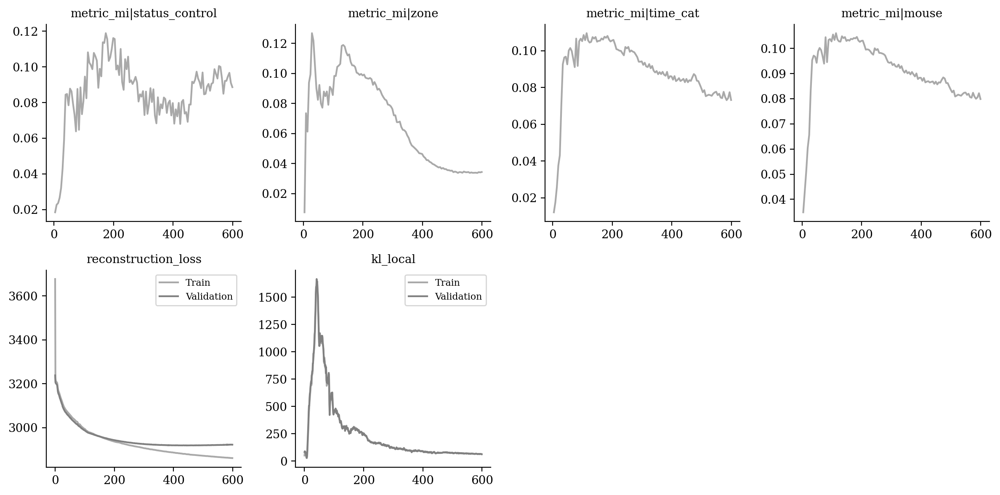

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

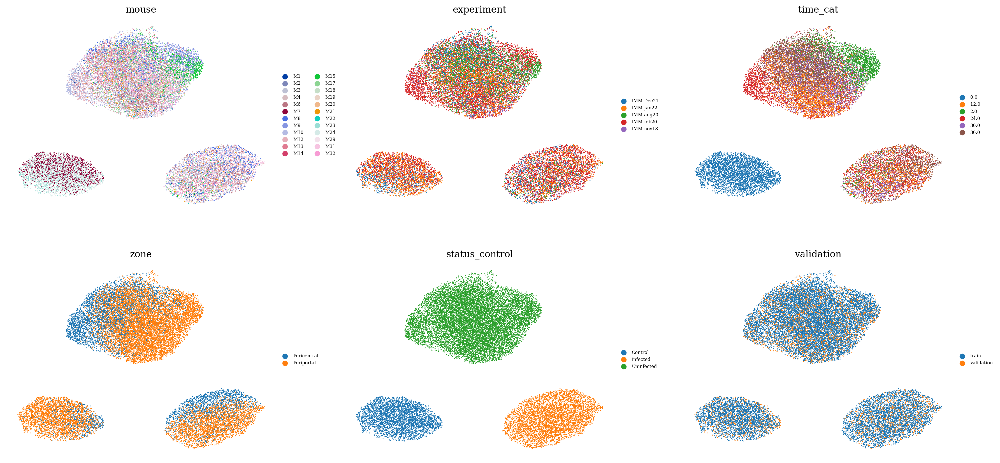

In [13]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

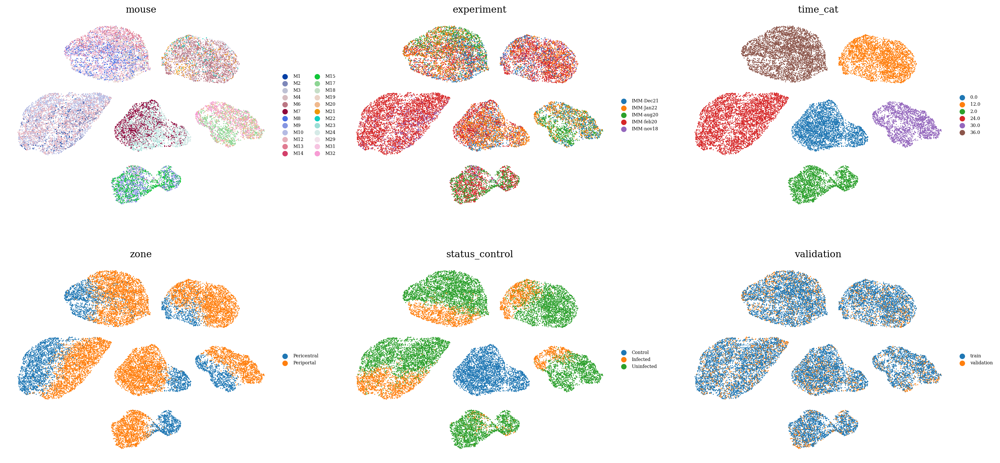

In [14]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

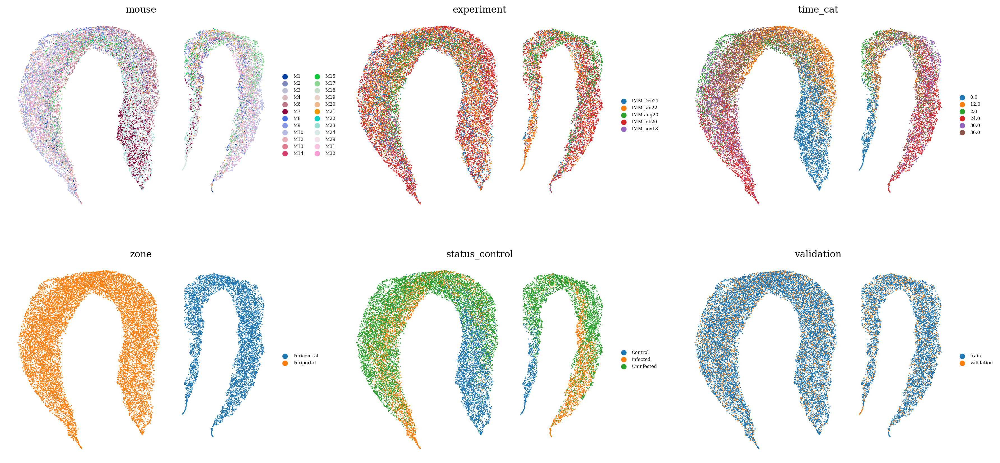

In [15]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

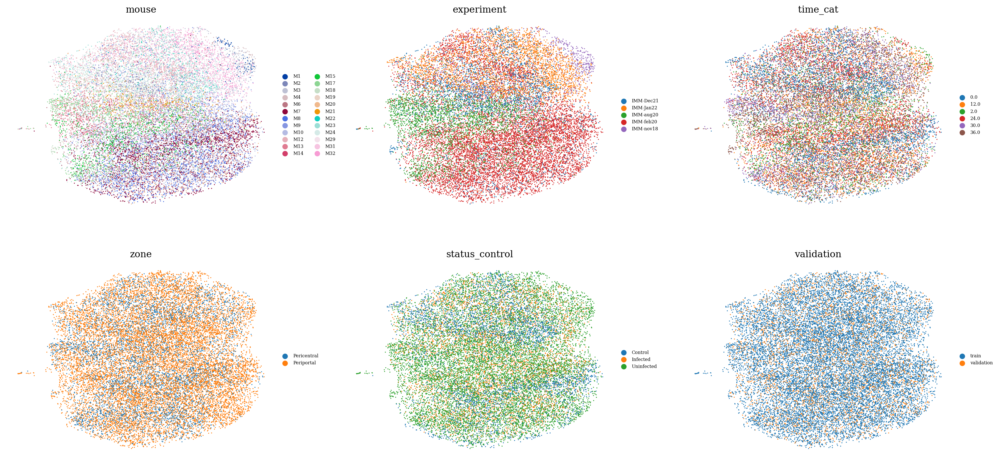

In [16]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )